In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when ONI is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-24 01:14:42,607] A new study created in memory with name: no-name-834639af-1d98-42f3-bf39-873a8c7de39a
[I 2025-05-24 01:16:34,851] Trial 0 finished with value: 0.0663404755294323 and parameters: {'lr': 0.09611347206227598, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.4386777450732581}. Best is trial 0 with value: 0.0663404755294323.


Cross Validation Accuracies:
[0.05573149025440216, 0.05812397971749306, 0.0762452781200409, 0.07772889733314514, 0.06387273222208023]
Mean Cross Validation Accuracy:
0.0663404755294323
Standard Deviation of Cross Validation Accuracy:
0.00909892734955732


[I 2025-05-24 01:20:09,184] Trial 1 finished with value: 2.3190051317214966 and parameters: {'lr': 0.1390135533383707, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.158814273582484}. Best is trial 0 with value: 0.0663404755294323.


Cross Validation Accuracies:
[2.2155232429504395, 2.046894073486328, 1.833328366279602, 3.061844825744629, 2.4374351501464844]
Mean Cross Validation Accuracy:
2.3190051317214966
Standard Deviation of Cross Validation Accuracy:
0.42106325655134375


[I 2025-05-24 01:23:08,589] Trial 2 finished with value: 0.10423232465982438 and parameters: {'lr': 0.09776597136889212, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4225149790102888}. Best is trial 0 with value: 0.0663404755294323.


Cross Validation Accuracies:
[0.09036526083946228, 0.07557860761880875, 0.1095808669924736, 0.14333438873291016, 0.10230249911546707]
Mean Cross Validation Accuracy:
0.10423232465982438
Standard Deviation of Cross Validation Accuracy:
0.02269199641175754


[I 2025-05-24 01:25:20,946] Trial 3 finished with value: 0.0604073204100132 and parameters: {'lr': 0.00665137762359058, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3481040529408675}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[0.05120478942990303, 0.04919479787349701, 0.06911543756723404, 0.07661311328411102, 0.05590846389532089]
Mean Cross Validation Accuracy:
0.0604073204100132
Standard Deviation of Cross Validation Accuracy:
0.010668701655905503


[I 2025-05-24 01:31:06,633] Trial 4 finished with value: 0.23698459267616273 and parameters: {'lr': 0.01858430757565702, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3645719717745386}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[0.2714492976665497, 0.23467889428138733, 0.2271706461906433, 0.282153844833374, 0.16947028040885925]
Mean Cross Validation Accuracy:
0.23698459267616273
Standard Deviation of Cross Validation Accuracy:
0.039718734577404186


[I 2025-05-24 01:33:28,330] Trial 5 finished with value: 0.06516146957874298 and parameters: {'lr': 0.14188735066231348, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3226827454323691}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[0.046074505895376205, 0.057221103459596634, 0.07721615582704544, 0.0844338908791542, 0.06086169183254242]
Mean Cross Validation Accuracy:
0.06516146957874298
Standard Deviation of Cross Validation Accuracy:
0.013875095450111527


[I 2025-05-24 01:39:04,587] Trial 6 finished with value: 1.7660640001296997 and parameters: {'lr': 0.0963135723532871, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4537506875968549}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[2.02870512008667, 1.7628592252731323, 1.5094109773635864, 1.8281025886535645, 1.7012420892715454]
Mean Cross Validation Accuracy:
1.7660640001296997
Standard Deviation of Cross Validation Accuracy:
0.16906334266330586


[I 2025-05-24 01:43:19,995] Trial 7 finished with value: 0.06077863350510597 and parameters: {'lr': 0.028373670325973207, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3887782128680205}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[0.05030292645096779, 0.05055038630962372, 0.0694279596209526, 0.07856132090091705, 0.055050574243068695]
Mean Cross Validation Accuracy:
0.06077863350510597
Standard Deviation of Cross Validation Accuracy:
0.011297813550956017


[I 2025-05-24 01:48:24,955] Trial 8 finished with value: 0.06975705772638321 and parameters: {'lr': 0.0012767435275377202, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3729367099368289}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[0.06442853808403015, 0.061361491680145264, 0.07231535017490387, 0.08439680188894272, 0.06628310680389404]
Mean Cross Validation Accuracy:
0.06975705772638321
Standard Deviation of Cross Validation Accuracy:
0.008146336050334558


[I 2025-05-24 01:54:00,296] Trial 9 finished with value: 5.7544232368469235 and parameters: {'lr': 0.9226812954578291, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.19139939804067582}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[5.556447505950928, 6.391087055206299, 5.774102687835693, 5.566640377044678, 5.4838385581970215]
Mean Cross Validation Accuracy:
5.7544232368469235
Standard Deviation of Cross Validation Accuracy:
0.3326863264934534


[I 2025-05-24 01:56:17,823] Trial 10 finished with value: 0.060248592495918275 and parameters: {'lr': 0.0032164097542874844, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.24555548430445945}. Best is trial 10 with value: 0.060248592495918275.


Cross Validation Accuracies:
[0.04928794875741005, 0.04962216690182686, 0.06901229918003082, 0.0776141807436943, 0.055706366896629333]
Mean Cross Validation Accuracy:
0.060248592495918275
Standard Deviation of Cross Validation Accuracy:
0.011243261586395225


[I 2025-05-24 01:58:39,155] Trial 11 finished with value: 0.060080526024103166 and parameters: {'lr': 0.0035096842754242623, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.23454704121931963}. Best is trial 11 with value: 0.060080526024103166.


Cross Validation Accuracies:
[0.04899641498923302, 0.04965163394808769, 0.06912282109260559, 0.0768270418047905, 0.055804718285799026]
Mean Cross Validation Accuracy:
0.060080526024103166
Standard Deviation of Cross Validation Accuracy:
0.011064454167107596


[I 2025-05-24 02:00:57,185] Trial 12 finished with value: 0.060348210483789445 and parameters: {'lr': 0.0014380248768641104, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.24063368290453022}. Best is trial 11 with value: 0.060080526024103166.


Cross Validation Accuracies:
[0.0498889721930027, 0.04984690248966217, 0.06866779923439026, 0.07785842567682266, 0.05547895282506943]
Mean Cross Validation Accuracy:
0.060348210483789445
Standard Deviation of Cross Validation Accuracy:
0.01112839609686355


[I 2025-05-24 02:03:19,816] Trial 13 finished with value: 0.06016390472650528 and parameters: {'lr': 0.004661013959236443, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.260316184623758}. Best is trial 11 with value: 0.060080526024103166.


Cross Validation Accuracies:
[0.04998728260397911, 0.04935288056731224, 0.06851087510585785, 0.07753445208072662, 0.055434033274650574]
Mean Cross Validation Accuracy:
0.06016390472650528
Standard Deviation of Cross Validation Accuracy:
0.011083513838539203


[I 2025-05-24 02:05:48,155] Trial 14 finished with value: 0.06018711403012276 and parameters: {'lr': 0.00782085485037581, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.10582200016575657}. Best is trial 11 with value: 0.060080526024103166.


Cross Validation Accuracies:
[0.04970979318022728, 0.0509929321706295, 0.06768601387739182, 0.07693956792354584, 0.05560726299881935]
Mean Cross Validation Accuracy:
0.06018711403012276
Standard Deviation of Cross Validation Accuracy:
0.010508667642443148


[I 2025-05-24 02:08:13,379] Trial 15 finished with value: 0.13821850568056107 and parameters: {'lr': 0.0037511769488984274, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2724842588051523}. Best is trial 11 with value: 0.060080526024103166.


Cross Validation Accuracies:
[0.0858163833618164, 0.1718171387910843, 0.15411610901355743, 0.15991544723510742, 0.11942745000123978]
Mean Cross Validation Accuracy:
0.13821850568056107
Standard Deviation of Cross Validation Accuracy:
0.0314688589195804


[I 2025-05-24 02:10:31,097] Trial 16 finished with value: 0.05857744812965393 and parameters: {'lr': 0.012583806596462462, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18933335146113747}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.049439966678619385, 0.050125375390052795, 0.06591598689556122, 0.07494895160198212, 0.05245696008205414]
Mean Cross Validation Accuracy:
0.05857744812965393
Standard Deviation of Cross Validation Accuracy:
0.010141713385493585


[I 2025-05-24 02:12:59,939] Trial 17 finished with value: 0.060726651549339296 and parameters: {'lr': 0.009814597976152082, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18412453852619687}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.052225783467292786, 0.05157947167754173, 0.06873369216918945, 0.07566684484481812, 0.055427465587854385]
Mean Cross Validation Accuracy:
0.060726651549339296
Standard Deviation of Cross Validation Accuracy:
0.009709161702268378


[I 2025-05-24 02:15:24,552] Trial 18 finished with value: 0.1414507582783699 and parameters: {'lr': 0.017440625467641732, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.13942296288726902}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.08137976378202438, 0.1647060066461563, 0.15428997576236725, 0.17598561942577362, 0.13089242577552795]
Mean Cross Validation Accuracy:
0.1414507582783699
Standard Deviation of Cross Validation Accuracy:
0.03352107242240263


[I 2025-05-24 02:18:12,876] Trial 19 finished with value: 0.07244054451584817 and parameters: {'lr': 0.002547398073104068, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.29535250660317175}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05222160741686821, 0.07308634370565414, 0.08288931846618652, 0.09024223685264587, 0.06376321613788605]
Mean Cross Validation Accuracy:
0.07244054451584817
Standard Deviation of Cross Validation Accuracy:
0.013495151936190422


[I 2025-05-24 02:20:46,588] Trial 20 finished with value: 0.0688962146639824 and parameters: {'lr': 0.03926751404504221, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2010060098795629}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06688518822193146, 0.06363406032323837, 0.06287848204374313, 0.0764666348695755, 0.07461670786142349]
Mean Cross Validation Accuracy:
0.0688962146639824
Standard Deviation of Cross Validation Accuracy:
0.00562108363318592


[I 2025-05-24 02:23:16,239] Trial 21 finished with value: 0.060177265852689746 and parameters: {'lr': 0.005087260405951382, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.49717370750713086}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05065624415874481, 0.04938729107379913, 0.06818271428346634, 0.07748402655124664, 0.05517605319619179]
Mean Cross Validation Accuracy:
0.060177265852689746
Standard Deviation of Cross Validation Accuracy:
0.010915096960779762


[I 2025-05-24 02:25:40,624] Trial 22 finished with value: 0.06028738394379616 and parameters: {'lr': 0.0020184900841142515, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2271012950176699}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04961559548974037, 0.049565110355615616, 0.06922563165426254, 0.07745205610990524, 0.055578526109457016]
Mean Cross Validation Accuracy:
0.06028738394379616
Standard Deviation of Cross Validation Accuracy:
0.011185220646152556


[I 2025-05-24 02:28:05,286] Trial 23 finished with value: 0.06075650453567505 and parameters: {'lr': 0.012633827453728395, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.27598167929498907}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05270371213555336, 0.04929168522357941, 0.07148482650518417, 0.07632235437631607, 0.05397994443774223]
Mean Cross Validation Accuracy:
0.06075650453567505
Standard Deviation of Cross Validation Accuracy:
0.010950834558171266


[I 2025-05-24 02:29:52,821] Trial 24 finished with value: 0.06703053191304206 and parameters: {'lr': 0.038160249595684745, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.21080114943222245}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0713140219449997, 0.057289525866508484, 0.06148723140358925, 0.08228890597820282, 0.0627729743719101]
Mean Cross Validation Accuracy:
0.06703053191304206
Standard Deviation of Cross Validation Accuracy:
0.008887164244223283


[I 2025-05-24 02:32:06,042] Trial 25 finished with value: 0.06103661805391312 and parameters: {'lr': 0.005651190695839962, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.15447783055179862}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05136324465274811, 0.049365222454071045, 0.06883767247200012, 0.07926729321479797, 0.056349657475948334]
Mean Cross Validation Accuracy:
0.06103661805391312
Standard Deviation of Cross Validation Accuracy:
0.011357615898782935


[I 2025-05-24 02:34:17,774] Trial 26 finished with value: 0.060104161500930786 and parameters: {'lr': 0.002199065923582203, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2573187582821934}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.049374714493751526, 0.04947832599282265, 0.06865815073251724, 0.07711952179670334, 0.05589009448885918]
Mean Cross Validation Accuracy:
0.060104161500930786
Standard Deviation of Cross Validation Accuracy:
0.011031599991628775


[I 2025-05-24 02:36:39,213] Trial 27 finished with value: 0.0602863110601902 and parameters: {'lr': 0.0020865839215953572, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.314605723561593}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05007452890276909, 0.04961460828781128, 0.06903525441884995, 0.07699605822563171, 0.05571110546588898]
Mean Cross Validation Accuracy:
0.0602863110601902
Standard Deviation of Cross Validation Accuracy:
0.010907409420653158


[I 2025-05-24 02:39:56,011] Trial 28 finished with value: 0.07356517612934113 and parameters: {'lr': 0.0012217302937193165, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.10769299897165457}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06703439354896545, 0.08343540132045746, 0.07577437162399292, 0.08350000530481339, 0.05808170884847641]
Mean Cross Validation Accuracy:
0.07356517612934113
Standard Deviation of Cross Validation Accuracy:
0.00983251342183166


[I 2025-05-24 02:42:20,255] Trial 29 finished with value: 0.06181840375065804 and parameters: {'lr': 0.012584570793616466, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.22256368938138893}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05160243809223175, 0.05003950372338295, 0.06906575709581375, 0.07738222926855087, 0.06100209057331085]
Mean Cross Validation Accuracy:
0.06181840375065804
Standard Deviation of Cross Validation Accuracy:
0.010378165566718897


[I 2025-05-24 02:44:32,394] Trial 30 finished with value: 0.06482661068439484 and parameters: {'lr': 0.054041265396306874, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.1737285151008117}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06151125207543373, 0.04764775186777115, 0.07115989923477173, 0.08277756720781326, 0.06103658303618431]
Mean Cross Validation Accuracy:
0.06482661068439484
Standard Deviation of Cross Validation Accuracy:
0.011686030005863376


[I 2025-05-24 02:47:15,370] Trial 31 finished with value: 0.06020777747035026 and parameters: {'lr': 0.004126819050143067, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2650414499478294}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05029670149087906, 0.048795055598020554, 0.06849055737257004, 0.0780213475227356, 0.05543522536754608]
Mean Cross Validation Accuracy:
0.06020777747035026
Standard Deviation of Cross Validation Accuracy:
0.011288796411485504


[I 2025-05-24 02:49:33,005] Trial 32 finished with value: 0.060436681658029553 and parameters: {'lr': 0.002769689064667865, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2616488478574927}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050189223140478134, 0.04988900199532509, 0.06863117218017578, 0.07739534229040146, 0.05607866868376732]
Mean Cross Validation Accuracy:
0.060436681658029553
Standard Deviation of Cross Validation Accuracy:
0.010862799591093538


[I 2025-05-24 02:51:43,187] Trial 33 finished with value: 0.06125041171908378 and parameters: {'lr': 0.0010037408001855469, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.29457936994038064}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05372806638479233, 0.05002914369106293, 0.06934433430433273, 0.07761798799037933, 0.05553252622485161]
Mean Cross Validation Accuracy:
0.06125041171908378
Standard Deviation of Cross Validation Accuracy:
0.01047478769066801


[I 2025-05-24 02:54:21,975] Trial 34 finished with value: 0.06043914631009102 and parameters: {'lr': 0.00802496925508273, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.243766134156234}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05040942132472992, 0.050341393798589706, 0.06849808245897293, 0.07827161252498627, 0.05467522144317627]
Mean Cross Validation Accuracy:
0.06043914631009102
Standard Deviation of Cross Validation Accuracy:
0.011124083082160814


[I 2025-05-24 02:56:36,357] Trial 35 finished with value: 0.06034991890192032 and parameters: {'lr': 0.001819992302974783, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3294253323818063}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0500563345849514, 0.04946891963481903, 0.06878947466611862, 0.07776504755020142, 0.055669818073511124]
Mean Cross Validation Accuracy:
0.06034991890192032
Standard Deviation of Cross Validation Accuracy:
0.011142442947921945


[I 2025-05-24 02:59:45,425] Trial 36 finished with value: 0.07497927397489548 and parameters: {'lr': 0.005168868996997178, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15834339612274212}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06275928020477295, 0.06535421311855316, 0.06972522288560867, 0.09520319104194641, 0.08185446262359619]
Mean Cross Validation Accuracy:
0.07497927397489548
Standard Deviation of Cross Validation Accuracy:
0.012048652518594263


[I 2025-05-24 03:01:55,100] Trial 37 finished with value: 0.06220525726675987 and parameters: {'lr': 0.021155365917566882, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2248742715232805}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04856157302856445, 0.05230605974793434, 0.0672784149646759, 0.08009877055883408, 0.06278146803379059]
Mean Cross Validation Accuracy:
0.06220525726675987
Standard Deviation of Cross Validation Accuracy:
0.011228454897428288


[I 2025-05-24 03:04:55,954] Trial 38 finished with value: 0.06046527624130249 and parameters: {'lr': 0.012362478271155237, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2006015278939784}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.049345847219228745, 0.04805497080087662, 0.06806445866823196, 0.07985585182905197, 0.057005252689123154]
Mean Cross Validation Accuracy:
0.06046527624130249
Standard Deviation of Cross Validation Accuracy:
0.012028060035310893


[I 2025-05-24 03:07:18,808] Trial 39 finished with value: 4.064578819274902 and parameters: {'lr': 0.39238543088624483, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.29637581285328674}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[4.547480583190918, 2.8041739463806152, 4.045146942138672, 3.367302894592285, 5.5587897300720215]
Mean Cross Validation Accuracy:
4.064578819274902
Standard Deviation of Cross Validation Accuracy:
0.9530007467095769


[I 2025-05-24 03:09:14,524] Trial 40 finished with value: 0.06382537931203842 and parameters: {'lr': 0.003969205292486996, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.33465859632945605}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05163729190826416, 0.05390852689743042, 0.07232318818569183, 0.08047609776258469, 0.06078179180622101]
Mean Cross Validation Accuracy:
0.06382537931203842
Standard Deviation of Cross Validation Accuracy:
0.011005598955561026


[I 2025-05-24 03:10:55,426] Trial 41 finished with value: 0.06019473075866699 and parameters: {'lr': 0.005568037910920602, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4786317717408524}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050697192549705505, 0.04979837313294411, 0.0677935928106308, 0.07749404013156891, 0.05519045516848564]
Mean Cross Validation Accuracy:
0.06019473075866699
Standard Deviation of Cross Validation Accuracy:
0.010773477315697494


[I 2025-05-24 03:12:38,525] Trial 42 finished with value: 0.061256276071071626 and parameters: {'lr': 0.007548342000792872, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.39464289062460467}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.051435161381959915, 0.049472883343696594, 0.06824938207864761, 0.08031853288412094, 0.05680542066693306]
Mean Cross Validation Accuracy:
0.061256276071071626
Standard Deviation of Cross Validation Accuracy:
0.011553232605402095


[I 2025-05-24 03:14:31,277] Trial 43 finished with value: 0.060115878283977506 and parameters: {'lr': 0.0045882659555312, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.45338346327807405}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05048877373337746, 0.04898534715175629, 0.06849055737257004, 0.07728193700313568, 0.05533277615904808]
Mean Cross Validation Accuracy:
0.060115878283977506
Standard Deviation of Cross Validation Accuracy:
0.010993241132964652


[I 2025-05-24 03:18:13,410] Trial 44 finished with value: 0.06736791729927064 and parameters: {'lr': 0.0028710176432494303, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4299650546254363}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06061430275440216, 0.056036077439785004, 0.06780685484409332, 0.08323984593153, 0.06914250552654266]
Mean Cross Validation Accuracy:
0.06736791729927064
Standard Deviation of Cross Validation Accuracy:
0.009265871271217276


[I 2025-05-24 03:20:10,915] Trial 45 finished with value: 0.37229722142219546 and parameters: {'lr': 0.0017195757261512725, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35331220409389746}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.40502938628196716, 0.3960557281970978, 0.39874032139778137, 0.29652807116508484, 0.365132600069046]
Mean Cross Validation Accuracy:
0.37229722142219546
Standard Deviation of Cross Validation Accuracy:
0.040317228889688826


[I 2025-05-24 03:22:21,783] Trial 46 finished with value: 0.060743505507707594 and parameters: {'lr': 0.010046015274048168, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.40696262866928584}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.048731423914432526, 0.0516427606344223, 0.06858859956264496, 0.07862558960914612, 0.056129153817892075]
Mean Cross Validation Accuracy:
0.060743505507707594
Standard Deviation of Cross Validation Accuracy:
0.011222480434477608


[I 2025-05-24 03:26:10,042] Trial 47 finished with value: 0.06138894036412239 and parameters: {'lr': 0.024865309548099963, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.25367004959605854}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05855738744139671, 0.04304709658026695, 0.07224561274051666, 0.08194497227668762, 0.051149632781744]
Mean Cross Validation Accuracy:
0.06138894036412239
Standard Deviation of Cross Validation Accuracy:
0.014069130237444438


[I 2025-05-24 03:28:34,443] Trial 48 finished with value: 0.0638867311179638 and parameters: {'lr': 0.0037453457623558375, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3128306045760347}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.056927796453237534, 0.04976959526538849, 0.07522063702344894, 0.08001113682985306, 0.05750449001789093]
Mean Cross Validation Accuracy:
0.0638867311179638
Standard Deviation of Cross Validation Accuracy:
0.011635352856217583


[I 2025-05-24 03:30:30,101] Trial 49 finished with value: 0.060862661153078076 and parameters: {'lr': 0.016913301437573778, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.13383226977287307}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05167745053768158, 0.04865730181336403, 0.06975455582141876, 0.07731609046459198, 0.056907907128334045]
Mean Cross Validation Accuracy:
0.060862661153078076
Standard Deviation of Cross Validation Accuracy:
0.01094312658209542


[I 2025-05-24 03:32:22,233] Trial 50 finished with value: 0.07000289410352707 and parameters: {'lr': 0.0027505256991501785, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18719569316027596}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06197335571050644, 0.05138983950018883, 0.09219516068696976, 0.08216636627912521, 0.06228974834084511]
Mean Cross Validation Accuracy:
0.07000289410352707
Standard Deviation of Cross Validation Accuracy:
0.014905426243521916


[I 2025-05-24 03:34:07,874] Trial 51 finished with value: 0.06033792719244957 and parameters: {'lr': 0.004734883991904868, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4714782316595556}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050721004605293274, 0.048960041254758835, 0.06920428574085236, 0.07696911692619324, 0.055835187435150146]
Mean Cross Validation Accuracy:
0.06033792719244957
Standard Deviation of Cross Validation Accuracy:
0.010930918896863505


[I 2025-05-24 03:35:59,463] Trial 52 finished with value: 0.06023994013667107 and parameters: {'lr': 0.00639768255820573, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4534654500988202}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04988380894064903, 0.04991781711578369, 0.06767135858535767, 0.07770778238773346, 0.05601893365383148]
Mean Cross Validation Accuracy:
0.06023994013667107
Standard Deviation of Cross Validation Accuracy:
0.010880846160140376


[I 2025-05-24 03:37:35,420] Trial 53 finished with value: 0.06126395314931869 and parameters: {'lr': 0.009441667326419096, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4929191814488475}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.051815275102853775, 0.05095745623111725, 0.07038498669862747, 0.07858411222696304, 0.05457793548703194]
Mean Cross Validation Accuracy:
0.06126395314931869
Standard Deviation of Cross Validation Accuracy:
0.011165889048468793


[I 2025-05-24 03:39:21,979] Trial 54 finished with value: 0.06034421920776367 and parameters: {'lr': 0.002330131099244145, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.49226117524271057}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050339020788669586, 0.050123706459999084, 0.06822642683982849, 0.07693213224411011, 0.05609980970621109]
Mean Cross Validation Accuracy:
0.06034421920776367
Standard Deviation of Cross Validation Accuracy:
0.010581738461197233


[I 2025-05-24 03:41:15,107] Trial 55 finished with value: 0.06023600697517395 and parameters: {'lr': 0.0035444762328612277, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2326029634449647}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05021806061267853, 0.050020862370729446, 0.06839131563901901, 0.07731298357248306, 0.0552368126809597]
Mean Cross Validation Accuracy:
0.06023600697517395
Standard Deviation of Cross Validation Accuracy:
0.010842809242170414


[I 2025-05-24 03:42:52,071] Trial 56 finished with value: 0.06032423824071884 and parameters: {'lr': 0.0016182505381466493, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2781224831814467}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05002141371369362, 0.04975142329931259, 0.06867227703332901, 0.0777585506439209, 0.05541752651333809]
Mean Cross Validation Accuracy:
0.06032423824071884
Standard Deviation of Cross Validation Accuracy:
0.01109642671900176


[I 2025-05-24 03:46:13,242] Trial 57 finished with value: 0.06808652207255364 and parameters: {'lr': 0.006691518382290263, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4726777507685638}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.062300268560647964, 0.0527539886534214, 0.07369972765445709, 0.08991359919309616, 0.061765026301145554]
Mean Cross Validation Accuracy:
0.06808652207255364
Standard Deviation of Cross Validation Accuracy:
0.012778560107239007


[I 2025-05-24 03:48:57,551] Trial 58 finished with value: 0.060288825631141664 and parameters: {'lr': 0.004716510641384771, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4497277429015104}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05159471929073334, 0.04914021119475365, 0.06867089122533798, 0.07714934647083282, 0.05488895997405052]
Mean Cross Validation Accuracy:
0.060288825631141664
Standard Deviation of Cross Validation Accuracy:
0.010803460784723287


[I 2025-05-24 03:52:19,991] Trial 59 finished with value: 0.06360699757933616 and parameters: {'lr': 0.01455730967499716, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2117377543289437}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04666071757674217, 0.06508321315050125, 0.07248011231422424, 0.07592766731977463, 0.05788327753543854]
Mean Cross Validation Accuracy:
0.06360699757933616
Standard Deviation of Cross Validation Accuracy:
0.010513302596531946


[I 2025-05-24 03:54:57,023] Trial 60 finished with value: 0.06135954111814499 and parameters: {'lr': 0.009115540693819807, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1737493172822573}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05122634395956993, 0.050279613584280014, 0.06925895065069199, 0.08005204051733017, 0.055980756878852844]
Mean Cross Validation Accuracy:
0.06135954111814499
Standard Deviation of Cross Validation Accuracy:
0.01154285929442565


[I 2025-05-24 03:57:07,099] Trial 61 finished with value: 0.060055617988109586 and parameters: {'lr': 0.003319103496060317, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1152554366206567}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04979312792420387, 0.049351420253515244, 0.06823316961526871, 0.07714350521564484, 0.05575686693191528]
Mean Cross Validation Accuracy:
0.060055617988109586
Standard Deviation of Cross Validation Accuracy:
0.010929282251017263


[I 2025-05-24 03:59:19,163] Trial 62 finished with value: 0.0603411465883255 and parameters: {'lr': 0.002197443588460913, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12539995889176347}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05063484609127045, 0.04933499917387962, 0.06861180812120438, 0.07757487893104553, 0.055549200624227524]
Mean Cross Validation Accuracy:
0.0603411465883255
Standard Deviation of Cross Validation Accuracy:
0.010988318060762862


[I 2025-05-24 04:01:30,772] Trial 63 finished with value: 0.06013099774718285 and parameters: {'lr': 0.0031786550904997594, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2824704808012052}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0496620275080204, 0.049318552017211914, 0.06893530488014221, 0.07813455909490585, 0.05460454523563385]
Mean Cross Validation Accuracy:
0.06013099774718285
Standard Deviation of Cross Validation Accuracy:
0.011477752769485382


[I 2025-05-24 04:03:40,565] Trial 64 finished with value: 0.05995095670223236 and parameters: {'lr': 0.00320862724948566, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2869428033379535}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0492803119122982, 0.04799806699156761, 0.06957987695932388, 0.07719933986663818, 0.05569718778133392]
Mean Cross Validation Accuracy:
0.05995095670223236
Standard Deviation of Cross Validation Accuracy:
0.011533010099746305


[I 2025-05-24 04:06:04,457] Trial 65 finished with value: 0.06024790480732918 and parameters: {'lr': 0.003248830136420171, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2838029912061083}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0508534200489521, 0.048499930649995804, 0.06865108758211136, 0.07763393223285675, 0.055601153522729874]
Mean Cross Validation Accuracy:
0.06024790480732918
Standard Deviation of Cross Validation Accuracy:
0.011142270581576002


[I 2025-05-24 04:08:19,100] Trial 66 finished with value: 0.060254880040884015 and parameters: {'lr': 0.001261920089000173, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3086929486551275}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05014854669570923, 0.049186721444129944, 0.06875286251306534, 0.07771637290716171, 0.05546989664435387]
Mean Cross Validation Accuracy:
0.060254880040884015
Standard Deviation of Cross Validation Accuracy:
0.011177277072063034


[I 2025-05-24 04:10:29,897] Trial 67 finished with value: 0.06026346161961556 and parameters: {'lr': 0.001480242849037198, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2441669158432837}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050004877150058746, 0.049897097051143646, 0.06859950721263885, 0.0772889256477356, 0.05552690103650093]
Mean Cross Validation Accuracy:
0.06026346161961556
Standard Deviation of Cross Validation Accuracy:
0.010904046563957711


[I 2025-05-24 04:12:59,257] Trial 68 finished with value: 0.07154315114021301 and parameters: {'lr': 0.002431722484951938, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.37298477183871226}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05974225699901581, 0.05205811560153961, 0.0844324380159378, 0.09638340026140213, 0.06509954482316971]
Mean Cross Validation Accuracy:
0.07154315114021301
Standard Deviation of Cross Validation Accuracy:
0.01639280005009282


[I 2025-05-24 04:15:24,147] Trial 69 finished with value: 0.06034475713968277 and parameters: {'lr': 0.001006347949651916, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.26234238758746425}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04966782405972481, 0.04951724037528038, 0.06957796961069107, 0.07726029306650162, 0.05570045858621597]
Mean Cross Validation Accuracy:
0.06034475713968277
Standard Deviation of Cross Validation Accuracy:
0.011173084592513668


[I 2025-05-24 04:17:42,625] Trial 70 finished with value: 0.09197816401720046 and parameters: {'lr': 0.056321937555938346, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.286459732586009}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.090122751891613, 0.07874702662229538, 0.0940416157245636, 0.11018666625022888, 0.08679275959730148]
Mean Cross Validation Accuracy:
0.09197816401720046
Standard Deviation of Cross Validation Accuracy:
0.010403858480730707


[I 2025-05-24 04:19:51,543] Trial 71 finished with value: 0.060343355685472486 and parameters: {'lr': 0.0030240399775611766, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.26848805615251287}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05041820928454399, 0.04980887472629547, 0.06878771632909775, 0.07756388187408447, 0.05513809621334076]
Mean Cross Validation Accuracy:
0.060343355685472486
Standard Deviation of Cross Validation Accuracy:
0.010994837836217708


[I 2025-05-24 04:22:08,585] Trial 72 finished with value: 0.06012117341160774 and parameters: {'lr': 0.004283734823020672, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2552404032946885}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04943995177745819, 0.049115587025880814, 0.06863424926996231, 0.07771597802639008, 0.05570010095834732]
Mean Cross Validation Accuracy:
0.06012117341160774
Standard Deviation of Cross Validation Accuracy:
0.011285450092317678


[I 2025-05-24 04:24:24,500] Trial 73 finished with value: 0.06047673150897026 and parameters: {'lr': 0.004094127042213769, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2529240509540616}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05189770087599754, 0.04905140772461891, 0.06976034492254257, 0.0766139030456543, 0.05506030097603798]
Mean Cross Validation Accuracy:
0.06047673150897026
Standard Deviation of Cross Validation Accuracy:
0.01077097296546468


[I 2025-05-24 04:26:37,528] Trial 74 finished with value: 0.060128945112228396 and parameters: {'lr': 0.0019412065961147606, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2165137808979884}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04999455437064171, 0.048946086317300797, 0.06880894303321838, 0.07714725285768509, 0.05574788898229599]
Mean Cross Validation Accuracy:
0.060128945112228396
Standard Deviation of Cross Validation Accuracy:
0.01106273945974981


[I 2025-05-24 04:29:17,957] Trial 75 finished with value: 0.06011576652526855 and parameters: {'lr': 0.0019587812357464117, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2101555463244163}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04978245124220848, 0.049516461789608, 0.06858164817094803, 0.07726964354515076, 0.055428627878427505]
Mean Cross Validation Accuracy:
0.06011576652526855
Standard Deviation of Cross Validation Accuracy:
0.011018335474699664


[I 2025-05-24 04:31:44,639] Trial 76 finished with value: 0.06003864407539368 and parameters: {'lr': 0.0064776450987943214, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23262017892950096}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05077330023050308, 0.04916521534323692, 0.06789635866880417, 0.07673869282007217, 0.055619653314352036]
Mean Cross Validation Accuracy:
0.06003864407539368
Standard Deviation of Cross Validation Accuracy:
0.010623001788662653


[I 2025-05-24 04:34:29,414] Trial 77 finished with value: 0.0634428769350052 and parameters: {'lr': 0.0063086956010021955, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1938252022719909}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050356969237327576, 0.054596614092588425, 0.07890442758798599, 0.07468120008707047, 0.05867517367005348]
Mean Cross Validation Accuracy:
0.0634428769350052
Standard Deviation of Cross Validation Accuracy:
0.011292367305723194


[I 2025-05-24 04:37:02,928] Trial 78 finished with value: 0.06652219370007514 and parameters: {'lr': 0.29346805024476047, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23318345670657825}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050969526171684265, 0.045842286199331284, 0.08479862660169601, 0.08509408682584763, 0.06590644270181656]
Mean Cross Validation Accuracy:
0.06652219370007514
Standard Deviation of Cross Validation Accuracy:
0.0164247764347793


[I 2025-05-24 04:39:52,934] Trial 79 finished with value: 0.06145017519593239 and parameters: {'lr': 0.007817095069339808, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.1506764151414296}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.053342580795288086, 0.05058427155017853, 0.06828169524669647, 0.0794379934668541, 0.05560433492064476]
Mean Cross Validation Accuracy:
0.06145017519593239
Standard Deviation of Cross Validation Accuracy:
0.010846253453428397


[I 2025-05-24 04:42:49,784] Trial 80 finished with value: 0.06147937625646591 and parameters: {'lr': 0.002332763377670883, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.20533899028932023}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05084580183029175, 0.05047814920544624, 0.07127177715301514, 0.08122088015079498, 0.05358027294278145]
Mean Cross Validation Accuracy:
0.06147937625646591
Standard Deviation of Cross Validation Accuracy:
0.012506908700345428


[I 2025-05-24 04:45:56,777] Trial 81 finished with value: 0.06028019189834595 and parameters: {'lr': 0.004048821109857787, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23654161549098063}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04979489743709564, 0.04917408153414726, 0.06921445578336716, 0.07754583656787872, 0.05567168816924095]
Mean Cross Validation Accuracy:
0.06028019189834595
Standard Deviation of Cross Validation Accuracy:
0.011246767989105334


[I 2025-05-24 04:48:48,322] Trial 82 finished with value: 0.05998982489109039 and parameters: {'lr': 0.005131096835477821, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10079058989550779}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050174977630376816, 0.04893159866333008, 0.06907304376363754, 0.07745376229286194, 0.05431574210524559]
Mean Cross Validation Accuracy:
0.05998982489109039
Standard Deviation of Cross Validation Accuracy:
0.011298714831127255


[I 2025-05-24 04:51:25,553] Trial 83 finished with value: 0.0609616607427597 and parameters: {'lr': 0.005579491563195683, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10406146631562349}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04954634606838226, 0.051926229149103165, 0.06865500658750534, 0.07857809960842133, 0.05610262230038643]
Mean Cross Validation Accuracy:
0.0609616607427597
Standard Deviation of Cross Validation Accuracy:
0.011000774303453581


[I 2025-05-24 04:54:05,437] Trial 84 finished with value: 0.06074306070804596 and parameters: {'lr': 0.011203542545839239, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11710132505426077}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04973021522164345, 0.049015093594789505, 0.06968564540147781, 0.07925289869308472, 0.056031450629234314]
Mean Cross Validation Accuracy:
0.06074306070804596
Standard Deviation of Cross Validation Accuracy:
0.011862640271738377


[I 2025-05-24 04:57:24,552] Trial 85 finished with value: 0.08261916190385818 and parameters: {'lr': 0.0034318743629979595, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13824317777863165}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.10409820824861526, 0.0643736943602562, 0.08387774974107742, 0.08680369704961777, 0.07394246011972427]
Mean Cross Validation Accuracy:
0.08261916190385818
Standard Deviation of Cross Validation Accuracy:
0.013331361891012802


[I 2025-05-24 04:59:52,940] Trial 86 finished with value: 0.06028575524687767 and parameters: {'lr': 0.0026818660852105103, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17425075202346935}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05022308975458145, 0.0486145056784153, 0.06943648308515549, 0.07789243012666702, 0.05526226758956909]
Mean Cross Validation Accuracy:
0.06028575524687767
Standard Deviation of Cross Validation Accuracy:
0.011458111116891405


[I 2025-05-24 05:03:14,188] Trial 87 finished with value: 0.06028334870934486 and parameters: {'lr': 0.0014156180255726172, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17930285852716676}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050117358565330505, 0.04969428479671478, 0.06843329966068268, 0.07745558768510818, 0.05571621283888817]
Mean Cross Validation Accuracy:
0.06028334870934486
Standard Deviation of Cross Validation Accuracy:
0.010932903110913505


[I 2025-05-24 05:05:52,111] Trial 88 finished with value: 0.06053644865751266 and parameters: {'lr': 0.0017995455289515673, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2185448977167548}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05014009773731232, 0.0492059700191021, 0.06942315399646759, 0.07768658548593521, 0.05622643604874611]
Mean Cross Validation Accuracy:
0.06053644865751266
Standard Deviation of Cross Validation Accuracy:
0.01120839678396675


[I 2025-05-24 05:08:40,630] Trial 89 finished with value: 0.05999241471290588 and parameters: {'lr': 0.0065250666433205725, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11596655204300417}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05007677152752876, 0.04762886464595795, 0.06767754256725311, 0.0780864804983139, 0.05649241432547569]
Mean Cross Validation Accuracy:
0.05999241471290588
Standard Deviation of Cross Validation Accuracy:
0.011400734709078993


[I 2025-05-24 05:11:25,045] Trial 90 finished with value: 0.06011657267808914 and parameters: {'lr': 0.006724885398005415, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12049033314380747}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0496179424226284, 0.04935239255428314, 0.0692470595240593, 0.07683202624320984, 0.05553344264626503]
Mean Cross Validation Accuracy:
0.06011657267808914
Standard Deviation of Cross Validation Accuracy:
0.011044148403560721


[I 2025-05-24 05:14:05,755] Trial 91 finished with value: 0.060458201169967654 and parameters: {'lr': 0.005254591411642742, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11354146417775046}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050712838768959045, 0.049115654081106186, 0.07034401595592499, 0.07664178311824799, 0.05547671392560005]
Mean Cross Validation Accuracy:
0.060458201169967654
Standard Deviation of Cross Validation Accuracy:
0.011027949370710647


[I 2025-05-24 05:16:39,143] Trial 92 finished with value: 0.06003008708357811 and parameters: {'lr': 0.004675174325005113, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12736486939196728}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.049077436327934265, 0.04936295375227928, 0.06877393275499344, 0.07767990976572037, 0.055256202816963196]
Mean Cross Validation Accuracy:
0.06003008708357811
Standard Deviation of Cross Validation Accuracy:
0.011353495857315819


[I 2025-05-24 05:19:23,492] Trial 93 finished with value: 0.06026511862874031 and parameters: {'lr': 0.0035656906307564686, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14816821823253734}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05036449059844017, 0.0502324216067791, 0.06769192218780518, 0.07784780114889145, 0.05518895760178566]
Mean Cross Validation Accuracy:
0.06026511862874031
Standard Deviation of Cross Validation Accuracy:
0.010851294774447651


[I 2025-05-24 05:21:58,917] Trial 94 finished with value: 0.05982970893383026 and parameters: {'lr': 0.007892615548430707, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1314428006868377}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.047164011746644974, 0.04861903563141823, 0.06828338652849197, 0.07854761928319931, 0.05653449147939682]
Mean Cross Validation Accuracy:
0.05982970893383026
Standard Deviation of Cross Validation Accuracy:
0.01198984880575558


[I 2025-05-24 05:24:32,293] Trial 95 finished with value: 0.059876096248626706 and parameters: {'lr': 0.007704874525542525, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1257000062448301}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05104102939367294, 0.0491432324051857, 0.0666031539440155, 0.07748179137706757, 0.055111274123191833]
Mean Cross Validation Accuracy:
0.059876096248626706
Standard Deviation of Cross Validation Accuracy:
0.010688031705539381


[I 2025-05-24 05:26:46,126] Trial 96 finished with value: 0.06083782911300659 and parameters: {'lr': 0.008698904366284954, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12862925180305426}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04739874228835106, 0.05084040015935898, 0.07152318954467773, 0.07889778912067413, 0.055529024451971054]
Mean Cross Validation Accuracy:
0.06083782911300659
Standard Deviation of Cross Validation Accuracy:
0.012239935705110288


[I 2025-05-24 05:29:13,574] Trial 97 finished with value: 0.05999933108687401 and parameters: {'lr': 0.006546693594126075, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.16392635528071786}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04881248623132706, 0.049686942249536514, 0.06962300837039948, 0.0762166678905487, 0.05565755069255829]
Mean Cross Validation Accuracy:
0.05999933108687401
Standard Deviation of Cross Validation Accuracy:
0.01100871559999849


[I 2025-05-24 05:32:11,187] Trial 98 finished with value: 0.0628356009721756 and parameters: {'lr': 0.011427941287431511, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10132338127302247}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.047710176557302475, 0.05690063536167145, 0.07019950449466705, 0.07932575792074203, 0.06004193052649498]
Mean Cross Validation Accuracy:
0.0628356009721756
Standard Deviation of Cross Validation Accuracy:
0.010935805652661282


[I 2025-05-24 05:34:45,037] Trial 99 finished with value: 0.061500614136457445 and parameters: {'lr': 0.00610882928492973, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16726658797302402}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05104614421725273, 0.04751218482851982, 0.07257089763879776, 0.07981345057487488, 0.056560393422842026]
Mean Cross Validation Accuracy:
0.061500614136457445
Standard Deviation of Cross Validation Accuracy:
0.012548219250048006
Number of finished trials: 100
Best trial: {'lr': 0.012583806596462462, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18933335146113747}
Best hyperparameters:  {'lr': 0.012583806596462462, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18933335146113747}
Fold 1:
Epoch 1/100
84/84 [==============================] - 15s 30ms/step - loss: 0.1070 - val_loss: 0.1477
Epoch 2/100
84/84 [==============================] - 1s 9ms/step - loss: 0.0729 - val_loss: 0.1390
Epoch 3/100
84/84 [==============================] - 1s 10ms/step - loss: 0.0711 - val_loss: 0.1277
Epoch 4/100
84/84 [==============================] - 1s 10ms/step - loss: 0.0730 - val_lo

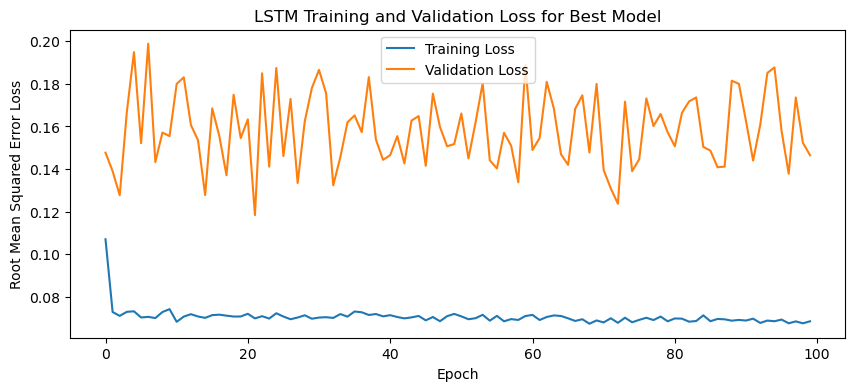

1/1 - 4s - loss: 0.0444 - 4s/epoch - 4s/step
Test Loss: 0.04444485157728195
1/1 [==============================] - 0s 33ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

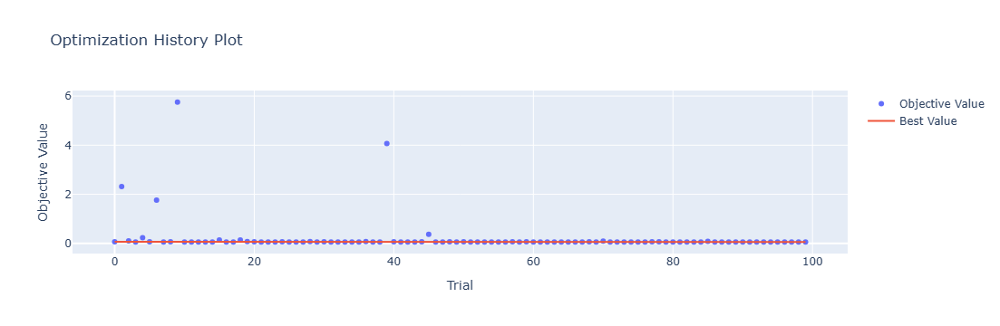

In [4]:
optuna.visualization.plot_optimization_history(study)

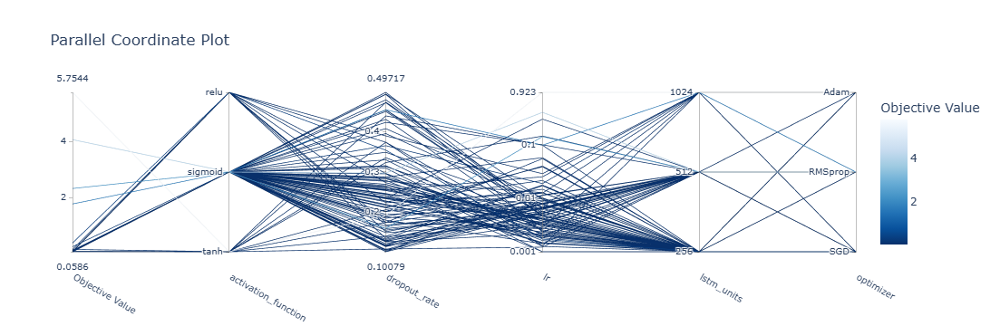

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

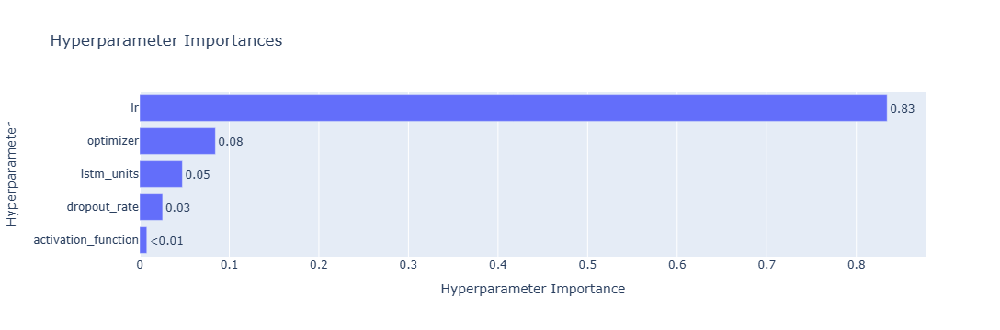

In [6]:
optuna.visualization.plot_param_importances(study)

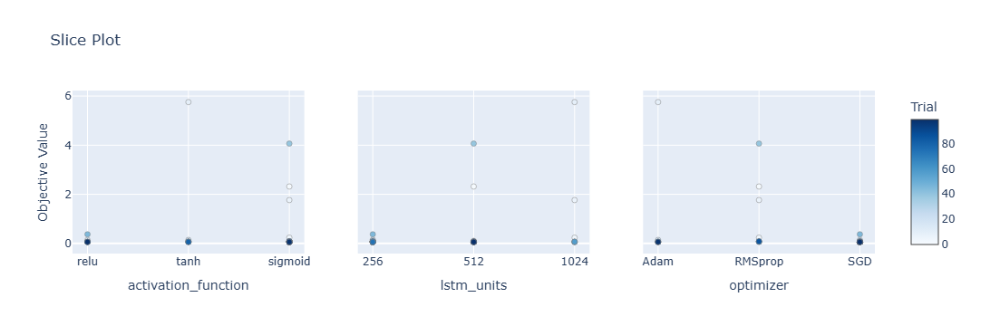

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

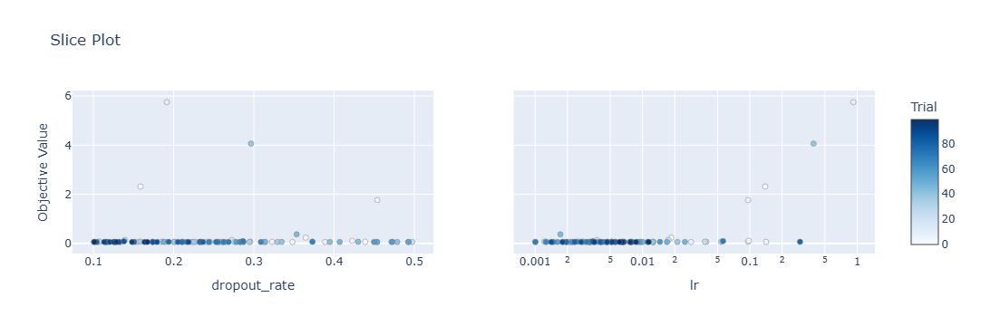

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 35s 166ms/step - loss: 0.1503 - accuracy: 0.5238 - mae: 0.1235 - rmse: 0.1503 - mape: 24.7054 - pearson: 0.6459 - val_loss: 0.0676 - val_accuracy: 0.6000 - val_mae: 0.0535 - val_rmse: 0.0676 - val_mape: 12.2992 - val_pearson: 0.8212
Epoch 2/100
84/84 [==============================] - 8s 95ms/step - loss: 0.0753 - accuracy: 0.7024 - mae: 0.0583 - rmse: 0.0753 - mape: 13.0758 - pearson: 0.7872 - val_loss: 0.0762 - val_accuracy: 0.6000 - val_mae: 0.0599 - val_rmse: 0.0762 - val_mape: 14.1156 - val_pearson: 0.7697
Epoch 3/100
84/84 [==============================] - 9s 102ms/step - loss: 0.0740 - accuracy: 0.7500 - mae: 0.0580 - rmse: 0.0740 - mape: 13.0007 - pearson: 0.7918 - val_loss: 0.0773 - val_accuracy: 0.4000 - val_mae: 0.0591 - val_rmse: 0.0773 - val_mape: 14.1163 - val_pearson: 0.7953
Epoch 4/100
84/84 [==============================] - 8s 91ms/step - loss: 0.0748 - accuracy: 0.6667 - mae: 0.0590 - rmse: 0.0748 - mape: 13.2961 

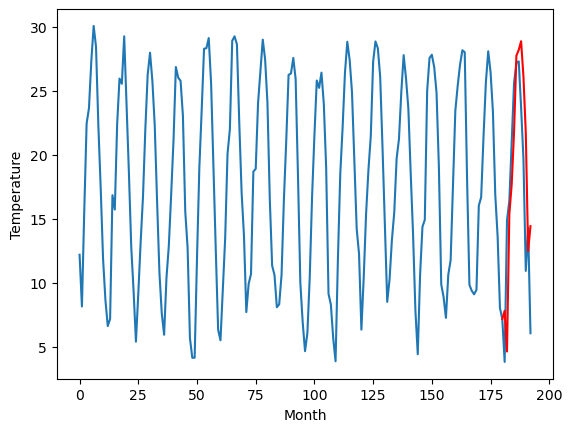

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		6.85		-1.68
8.44		3.67		-4.77
13.50		14.41		0.91
14.90		16.72		1.82
18.92		20.79		1.87
22.40		26.75		4.35
23.62		27.20		3.58
23.96		27.89		3.93
21.83		25.13		3.30
19.20		20.75		1.55
13.69		11.49		-2.20
13.45		13.46		0.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[13.23, 6.854505653381348, 3.6742817115783692, 14.406756038665772, 16.724594707489015, 20.78993761062622, 26.74834167480469, 27.199714924097062, 27.88620301604271, 25.133093799352647, 20.7505488049984, 11.493934119939805, 13.460123981237412]


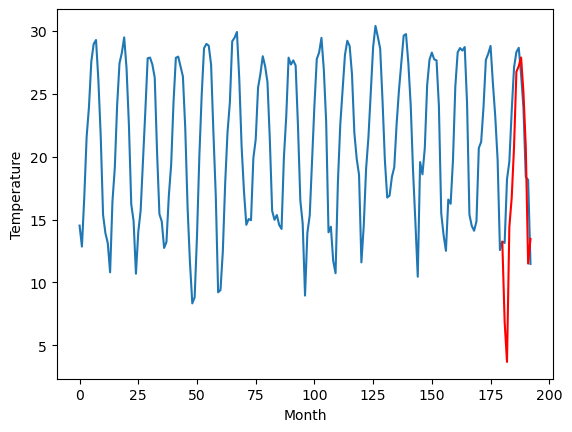

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.31		5.48		-1.83
8.17		2.30		-5.87
14.15		13.03		-1.12
15.79		15.35		-0.44
19.77		19.42		-0.35
23.91		25.38		1.47
25.67		25.82		0.15
25.95		26.51		0.56
22.38		23.76		1.38
18.50		19.37		0.87
10.14		10.11		-0.03
12.32		12.08		-0.24
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.18, 5.480435361862183, 2.298893918991089, 13.028798093795777, 15.352870693206787, 19.42211650848389, 25.3763959312439, 25.821762939691546, 26.51304467558861, 23.756722291707995, 19.369480928182604, 10.1111334168911, 12.078855713605883]


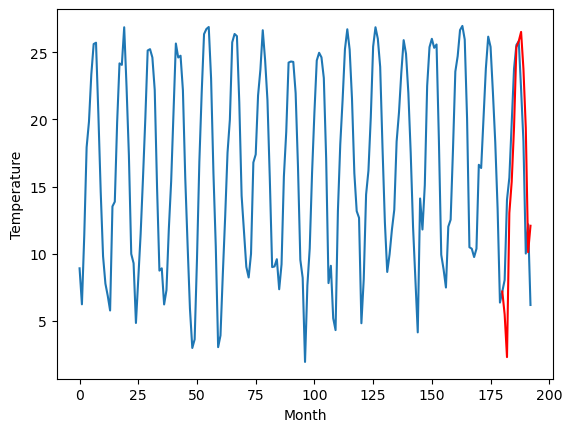

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.38		4.26		-1.12
3.81		1.09		-2.72
11.72		11.81		0.09
13.51		14.14		0.63
17.48		18.20		0.72
20.76		24.15		3.39
21.39		24.59		3.20
21.44		25.29		3.85
18.93		22.53		3.60
16.62		18.14		1.52
8.53		8.89		0.36
11.30		10.86		-0.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.46, 4.263274111747742, 1.0873395586013794, 11.813660778999328, 14.142120757102965, 18.20306436061859, 24.148991026878356, 24.59201321840286, 25.28524927139282, 22.53003553390503, 18.14216236114502, 8.886049308776855, 10.864259519577026]


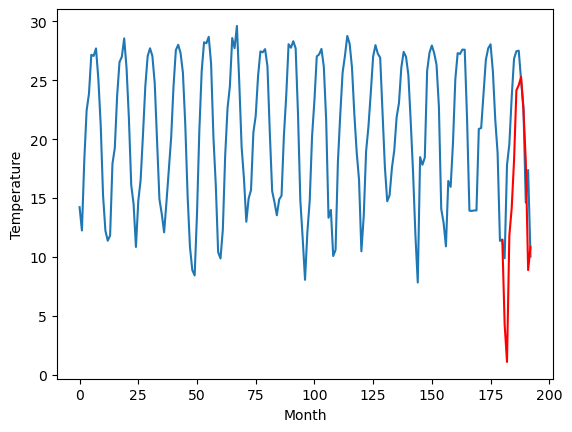

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.33		11.19		-0.14
8.24		8.02		-0.22
18.14		18.76		0.62
20.07		21.07		1.00
23.93		25.14		1.21
29.13		31.10		1.97
29.56		31.54		1.98
30.32		32.23		1.91
28.31		29.48		1.17
23.96		25.08		1.12
16.39		15.82		-0.57
18.72		17.80		-0.92
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.27, 11.187302432060243, 8.016124091148377, 18.755138716697694, 21.073542675971986, 25.136517128944398, 31.095207772254945, 31.544848433732987, 32.226484051942826, 29.47598933339119, 25.08050774693489, 15.821115962266923, 17.79576872944832]


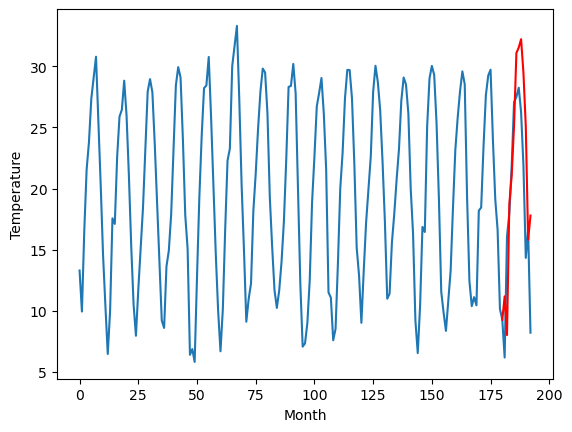

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.74		13.50		0.76
13.39		10.32		-3.07
18.29		21.04		2.75
21.66		23.36		1.70
25.17		27.42		2.25
29.74		33.38		3.64
31.73		33.81		2.08
32.21		34.50		2.29
29.20		31.75		2.55
25.60		27.35		1.75
17.43		18.10		0.67
18.48		20.08		1.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.77, 13.49694432735443, 10.318406958580017, 21.043637175559997, 23.36270417690277, 27.424682040214538, 33.37703265666961, 33.81499241709709, 34.50110774159431, 31.747885752916332, 27.35489421010017, 18.10322241902351, 20.075508762598034]


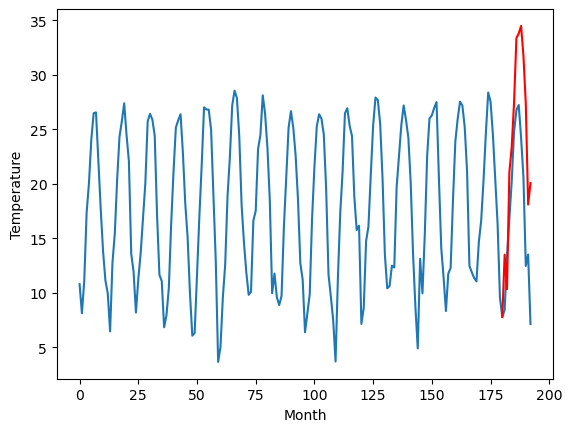

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.33		7.88		-0.45
8.97		4.70		-4.27
15.95		15.42		-0.53
16.98		17.74		0.76
20.69		21.81		1.12
25.02		27.76		2.74
26.64		28.20		1.56
26.58		28.90		2.32
22.53		26.14		3.61
19.30		21.75		2.45
10.65		12.49		1.84
12.59		14.46		1.87
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 7.884525928497315, 4.70137134552002, 15.423566017150879, 17.740761194229126, 21.805931482315064, 27.76196900367737, 28.20438880085945, 28.895348731279373, 26.144128028154373, 21.74550789952278, 12.491917315721512, 14.45904904961586]


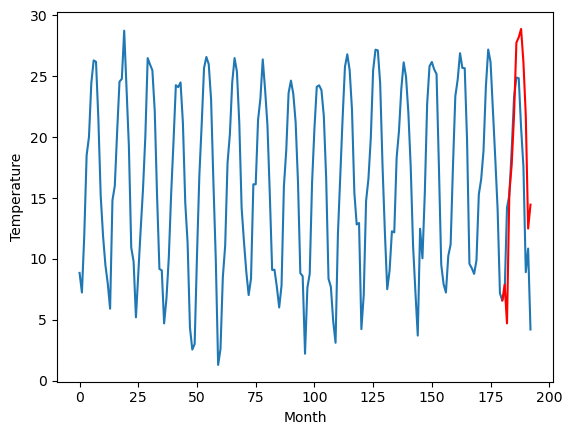

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.29		13.20		-0.09
13.91		10.02		-3.89
20.43		20.74		0.31
24.06		23.06		-1.00
27.08		27.13		0.05
31.87		33.08		1.21
33.99		33.52		-0.47
33.94		34.22		0.28
29.43		31.46		2.03
25.58		27.06		1.48
16.08		17.81		1.73
18.14		19.77		1.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.3, 13.201876978874207, 10.021869759559632, 20.737151246070862, 23.05644784450531, 27.12537751674652, 33.079635481834416, 33.517402957677845, 34.216398011446, 31.45981265187264, 27.0618205177784, 17.806478034257893, 19.770915638208393]


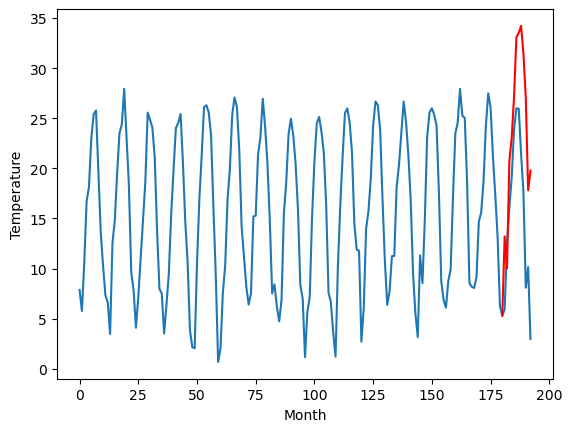

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.51		12.27		-0.24
8.24		9.09		0.85
20.71		19.82		-0.89
23.31		22.14		-1.17
28.00		26.20		-1.80
34.19		32.17		-2.02
34.76		32.61		-2.15
34.70		33.30		-1.40
30.96		30.55		-0.41
27.00		26.15		-0.85
16.96		16.90		-0.06
18.76		18.87		0.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.1, 12.26963918209076, 9.094224619865418, 19.82251994609833, 22.135928082466126, 26.204622673988343, 32.1661857843399, 32.613367813825604, 33.30464954972267, 30.550162750482556, 26.15371461510658, 16.89714093804359, 18.866393762826917]


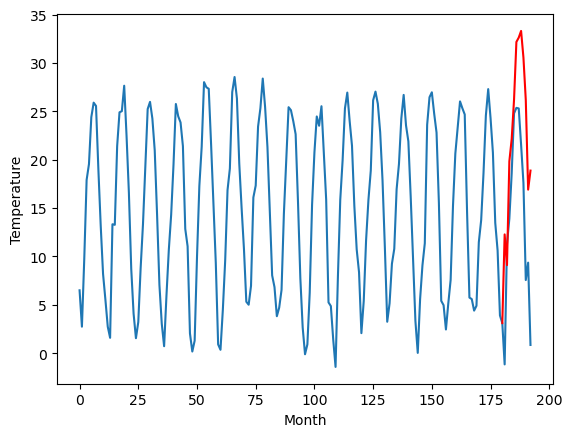

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.20		9.76		0.56
7.03		6.58		-0.45
17.78		17.31		-0.47
20.84		19.63		-1.21
25.31		23.69		-1.62
31.79		29.66		-2.13
32.80		30.11		-2.69
33.40		30.80		-2.60
29.54		28.04		-1.50
25.07		23.65		-1.42
14.41		14.39		-0.02
15.64		16.36		0.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.6, 9.759206452369689, 6.581776776313781, 17.30853573322296, 19.629329600334167, 23.69488040447235, 29.6623224401474, 30.112922587394714, 30.802444257736205, 28.043750562667846, 23.648869314193725, 14.388883390426635, 16.356142678260802]


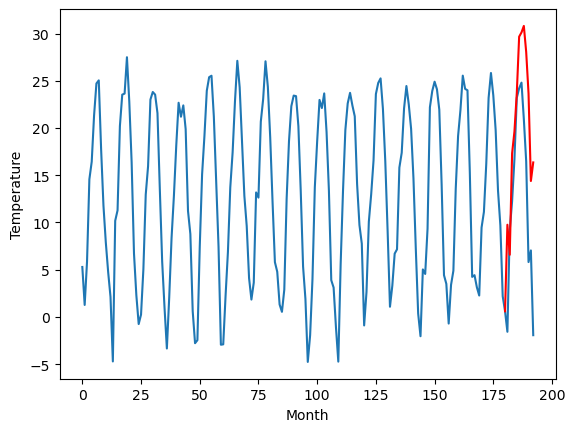

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.24		7.82		0.58
2.93		4.65		1.72
14.66		15.37		0.71
18.63		17.70		-0.93
23.78		21.77		-2.01
31.09		27.73		-3.36
31.68		28.18		-3.50
32.39		28.87		-3.52
28.34		26.11		-2.23
23.99		21.72		-2.27
13.13		12.46		-0.67
12.23		14.42		2.19
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.75, 7.819039678573608, 4.645514583587646, 15.373340702056884, 17.698212003707887, 21.766412115097047, 27.731730794906618, 28.184830790758134, 28.87394822239876, 26.112142449617387, 21.716131097078325, 12.45933902859688, 14.42312121987343]


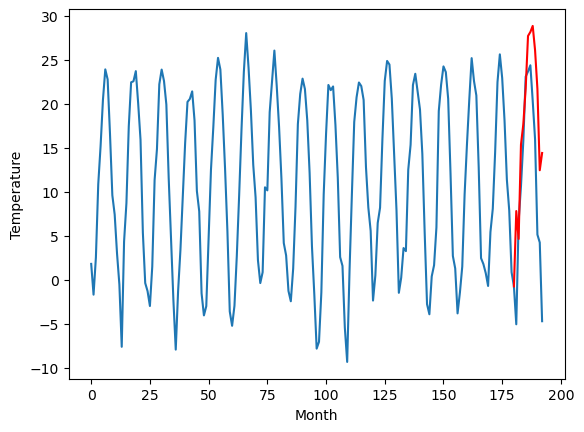

RangeIndex(start=1, stop=12, step=1)
[7.989999999999999, 8.53, 7.310000000000001, 5.3800000000000034, 11.33, 12.739999999999998, 8.33, 13.29, 12.51, 9.2, 7.24]
[7.833326315879821, 6.854505653381348, 5.480435361862183, 4.263274111747742, 11.187302432060243, 13.49694432735443, 7.884525928497315, 13.201876978874207, 12.26963918209076, 9.759206452369689, 7.819039678573608]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.99   7.833326
1                 1    8.53   6.854506
2                 2    7.31   5.480435
3                 3    5.38   4.263274
4                 4   11.33  11.187302
5                 5   12.74  13.496944
6                 6    8.33   7.884526
7                 7   13.29  13.201877
8                 8   12.51  12.269639
9                 9    9.20   9.759206
10               10    7.24   7.819040


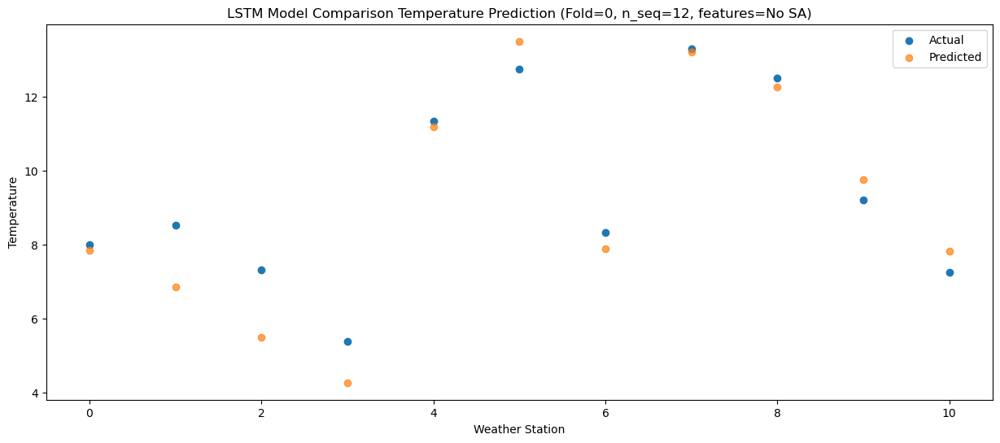

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.64   4.651406
1                 1    8.44   3.674282
2                 2    8.17   2.298894
3                 3    3.81   1.087340
4                 4    8.24   8.016124
5                 5   13.39  10.318407
6                 6    8.97   4.701371
7                 7   13.91  10.021870
8                 8    8.24   9.094225
9                 9    7.03   6.581777
10               10    2.93   4.645515


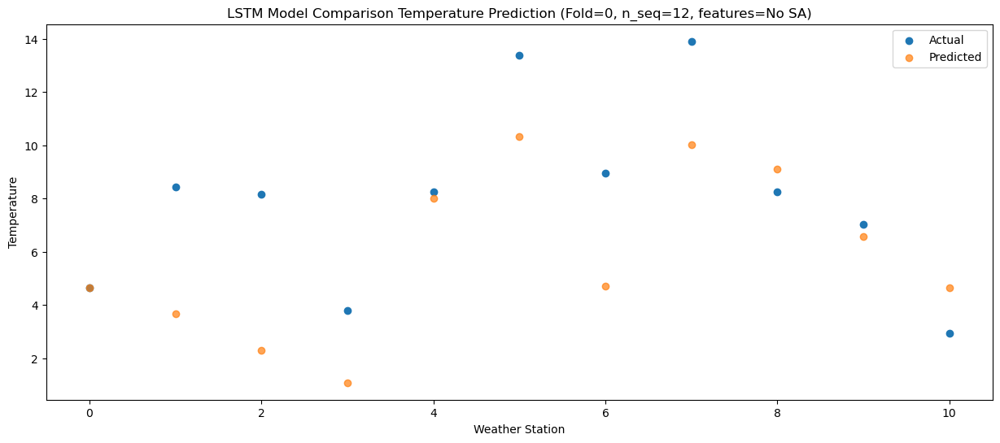

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.71  15.395509
1                 1   13.50  14.406756
2                 2   14.15  13.028798
3                 3   11.72  11.813661
4                 4   18.14  18.755139
5                 5   18.29  21.043637
6                 6   15.95  15.423566
7                 7   20.43  20.737151
8                 8   20.71  19.822520
9                 9   17.78  17.308536
10               10   14.66  15.373341


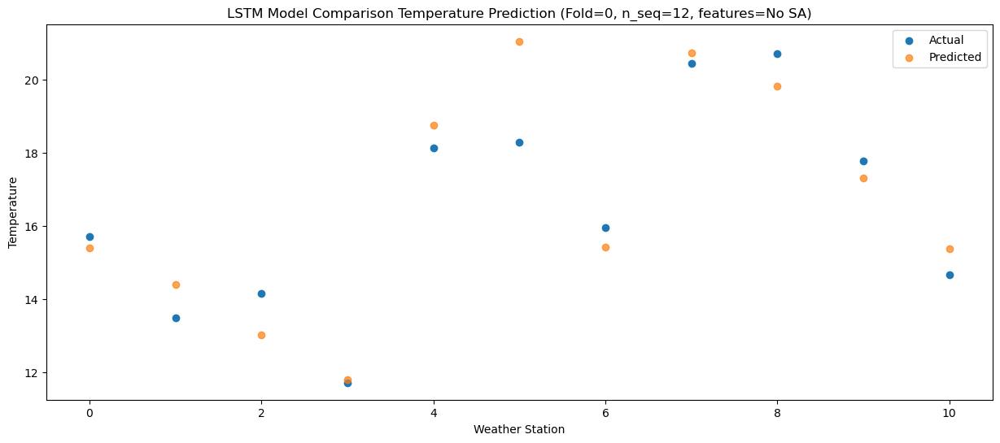

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.24  17.702296
1                 1   14.90  16.724595
2                 2   15.79  15.352871
3                 3   13.51  14.142121
4                 4   20.07  21.073543
5                 5   21.66  23.362704
6                 6   16.98  17.740761
7                 7   24.06  23.056448
8                 8   23.31  22.135928
9                 9   20.84  19.629330
10               10   18.63  17.698212


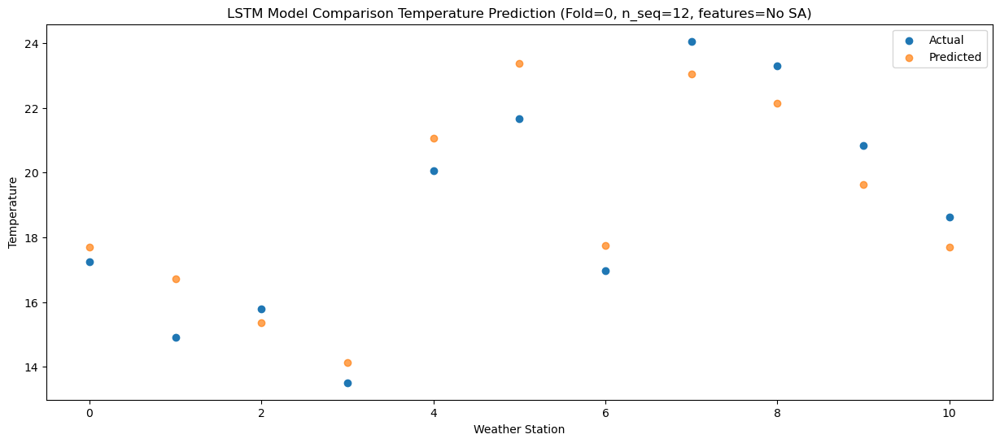

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   21.74  21.781386
1                 1   18.92  20.789938
2                 2   19.77  19.422117
3                 3   17.48  18.203064
4                 4   23.93  25.136517
5                 5   25.17  27.424682
6                 6   20.69  21.805931
7                 7   27.08  27.125378
8                 8   28.00  26.204623
9                 9   25.31  23.694880
10               10   23.78  21.766412


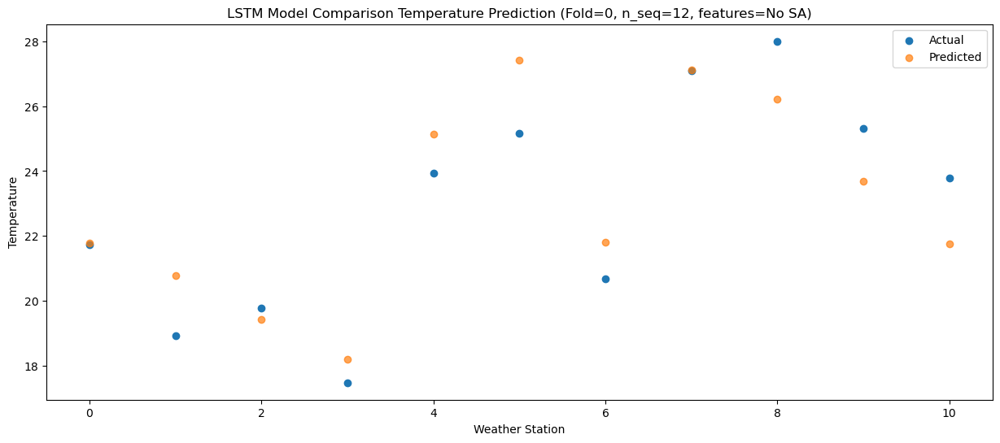

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   26.41  27.754083
1                 1   22.40  26.748342
2                 2   23.91  25.376396
3                 3   20.76  24.148991
4                 4   29.13  31.095208
5                 5   29.74  33.377033
6                 6   25.02  27.761969
7                 7   31.87  33.079635
8                 8   34.19  32.166186
9                 9   31.79  29.662322
10               10   31.09  27.731731


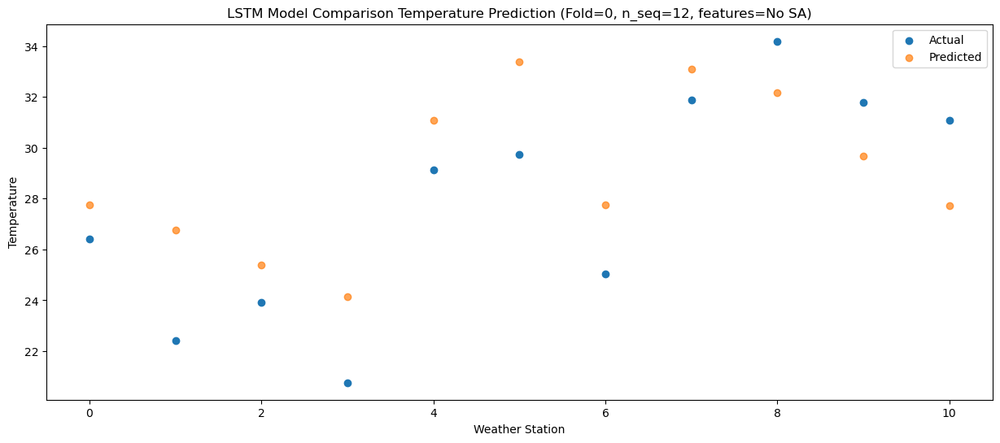

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   28.00  28.205929
1                 1   23.62  27.199715
2                 2   25.67  25.821763
3                 3   21.39  24.592013
4                 4   29.56  31.544848
5                 5   31.73  33.814992
6                 6   26.64  28.204389
7                 7   33.99  33.517403
8                 8   34.76  32.613368
9                 9   32.80  30.112923
10               10   31.68  28.184831


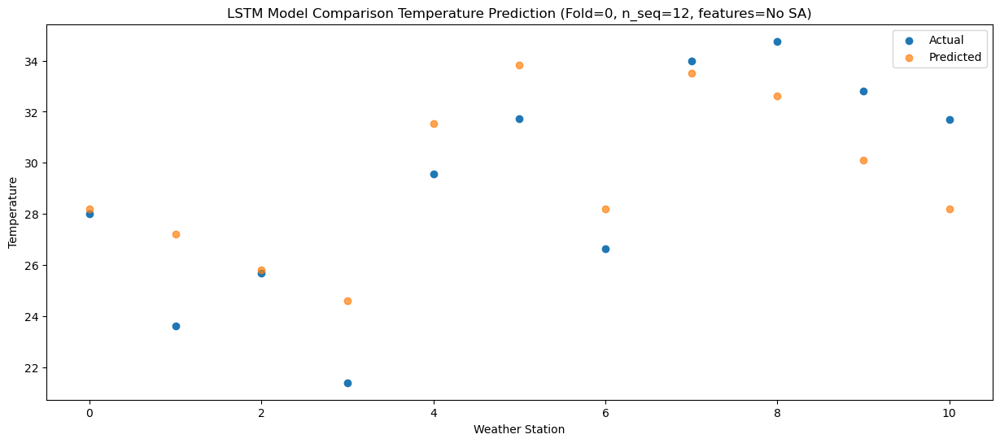

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   28.11  28.883020
1                 1   23.96  27.886203
2                 2   25.95  26.513045
3                 3   21.44  25.285249
4                 4   30.32  32.226484
5                 5   32.21  34.501108
6                 6   26.58  28.895349
7                 7   33.94  34.216398
8                 8   34.70  33.304650
9                 9   33.40  30.802444
10               10   32.39  28.873948


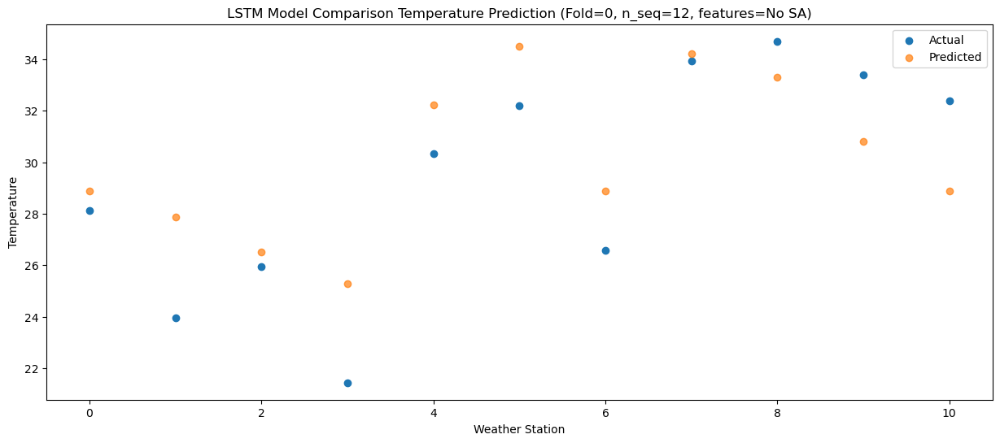

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   24.53  26.132205
1                 1   21.83  25.133094
2                 2   22.38  23.756722
3                 3   18.93  22.530036
4                 4   28.31  29.475989
5                 5   29.20  31.747886
6                 6   22.53  26.144128
7                 7   29.43  31.459813
8                 8   30.96  30.550163
9                 9   29.54  28.043751
10               10   28.34  26.112142


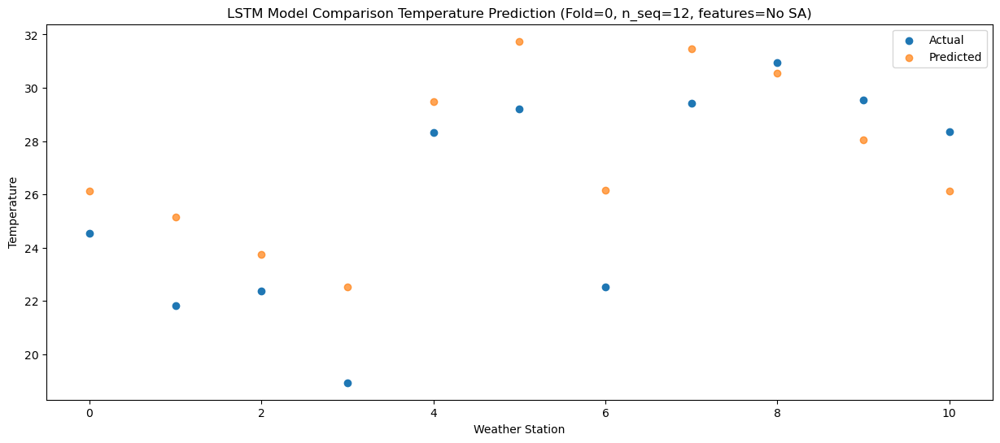

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   20.51  21.741617
1                 1   19.20  20.750549
2                 2   18.50  19.369481
3                 3   16.62  18.142162
4                 4   23.96  25.080508
5                 5   25.60  27.354894
6                 6   19.30  21.745508
7                 7   25.58  27.061821
8                 8   27.00  26.153715
9                 9   25.07  23.648869
10               10   23.99  21.716131


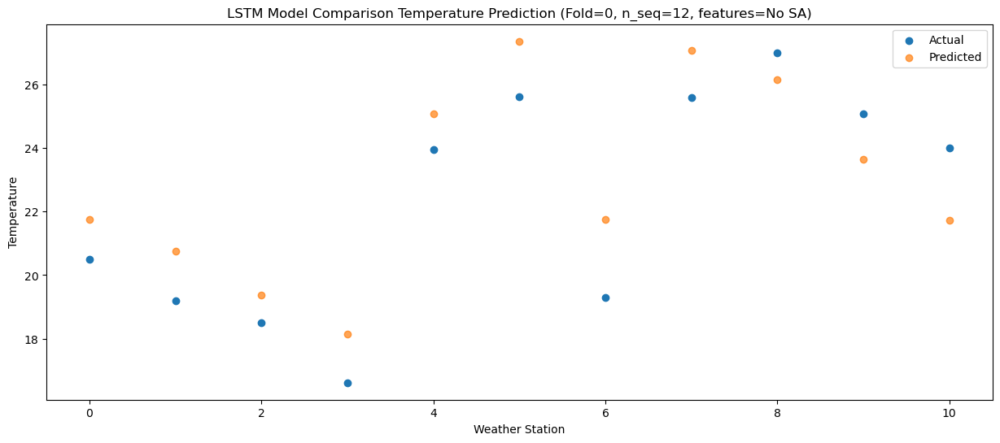

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   11.75  12.486997
1                 1   13.69  11.493934
2                 2   10.14  10.111133
3                 3    8.53   8.886049
4                 4   16.39  15.821116
5                 5   17.43  18.103222
6                 6   10.65  12.491917
7                 7   16.08  17.806478
8                 8   16.96  16.897141
9                 9   14.41  14.388883
10               10   13.13  12.459339


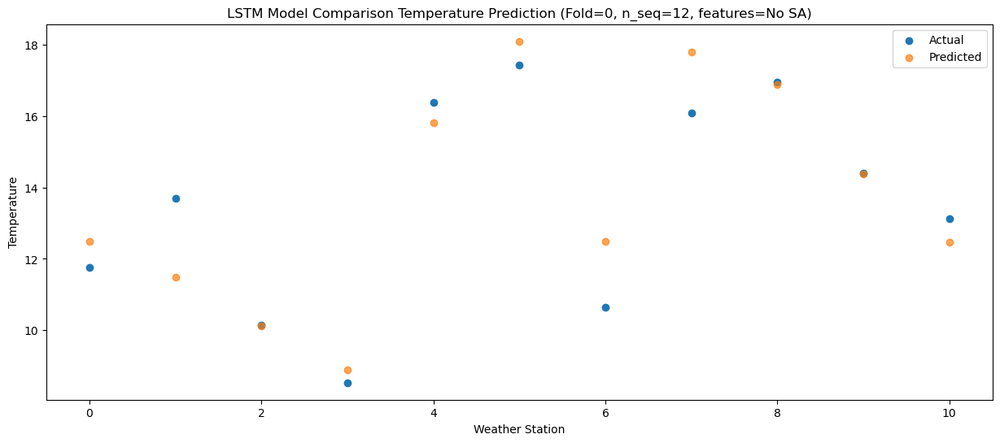

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.13  14.444896
1                 1   13.45  13.460124
2                 2   12.32  12.078856
3                 3   11.30  10.864260
4                 4   18.72  17.795769
5                 5   18.48  20.075509
6                 6   12.59  14.459049
7                 7   18.14  19.770916
8                 8   18.76  18.866394
9                 9   15.64  16.356143
10               10   12.23  14.423121


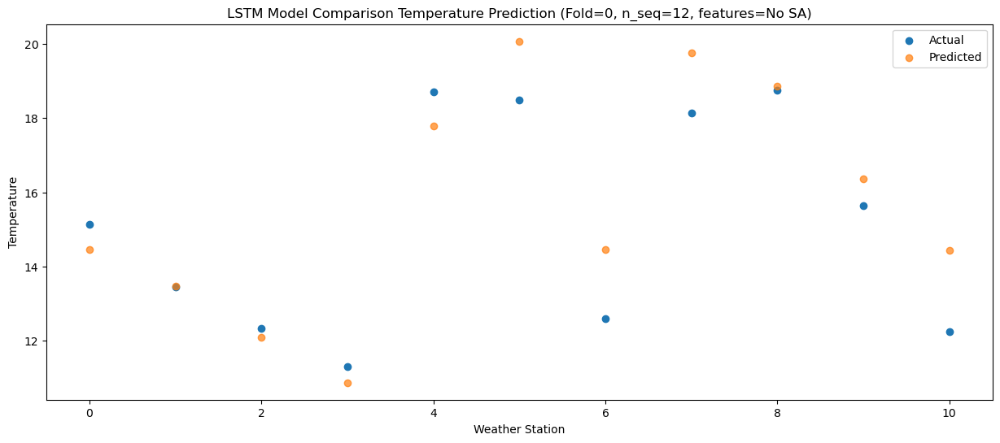

Model: "sequential_508"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1016 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1016 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1017 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1017 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1524 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1525 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1526 (Dense)          (1, 12)                

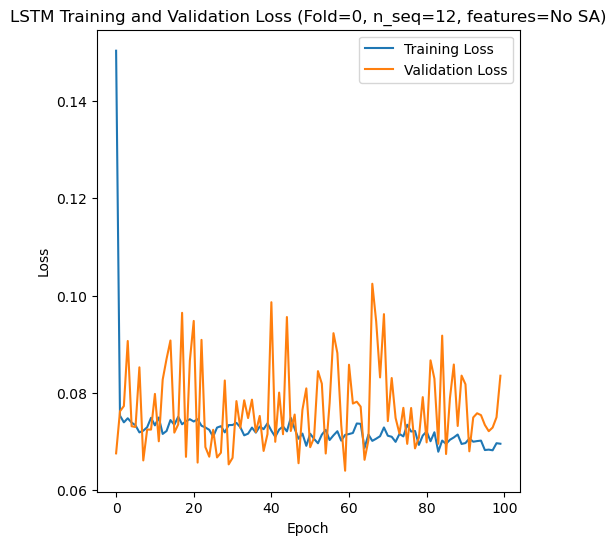

Epoch 1/100
84/84 [==============================] - 21s 99ms/step - loss: 0.1353 - accuracy: 0.6071 - mae: 0.1111 - rmse: 0.1353 - mape: 24.4746 - pearson: 0.6913 - val_loss: 0.0800 - val_accuracy: 0.1000 - val_mae: 0.0582 - val_rmse: 0.0800 - val_mape: 13.1385 - val_pearson: 0.7926
Epoch 2/100
84/84 [==============================] - 4s 48ms/step - loss: 0.0737 - accuracy: 0.6905 - mae: 0.0579 - rmse: 0.0737 - mape: 12.9572 - pearson: 0.7959 - val_loss: 0.0810 - val_accuracy: 0.1000 - val_mae: 0.0611 - val_rmse: 0.0810 - val_mape: 14.3253 - val_pearson: 0.7973
Epoch 3/100
84/84 [==============================] - 4s 44ms/step - loss: 0.0731 - accuracy: 0.6905 - mae: 0.0581 - rmse: 0.0731 - mape: 13.1333 - pearson: 0.7961 - val_loss: 0.0678 - val_accuracy: 0.8000 - val_mae: 0.0528 - val_rmse: 0.0678 - val_mape: 12.0684 - val_pearson: 0.8279
Epoch 4/100
84/84 [==============================] - 4s 42ms/step - loss: 0.0724 - accuracy: 0.6667 - mae: 0.0561 - rmse: 0.0724 - mape: 12.6200 - 

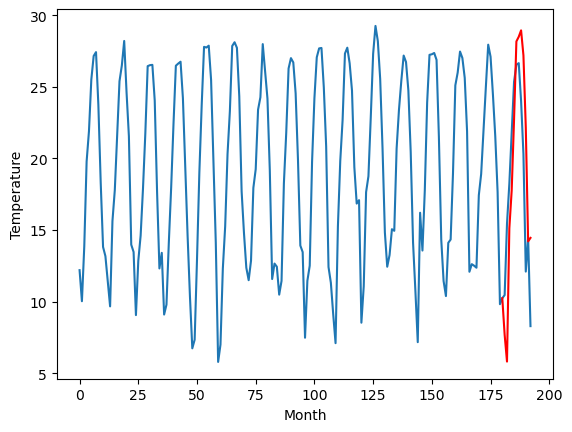

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.67		6.71		-0.96
8.33		4.83		-3.50
15.10		14.15		-0.95
17.24		16.80		-0.44
20.97		21.73		0.76
25.11		27.18		2.07
26.49		27.51		1.02
26.76		27.96		1.20
23.02		26.20		3.18
19.24		21.17		1.93
11.58		13.21		1.63
13.21		13.46		0.25
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.41, 6.708529944419861, 4.833515043258667, 14.14735209465027, 16.79644262313843, 21.729615802764894, 27.181100006103517, 27.50782224059105, 27.957309539318086, 26.20114904165268, 21.169011647701264, 13.21175056219101, 13.459785143733026]


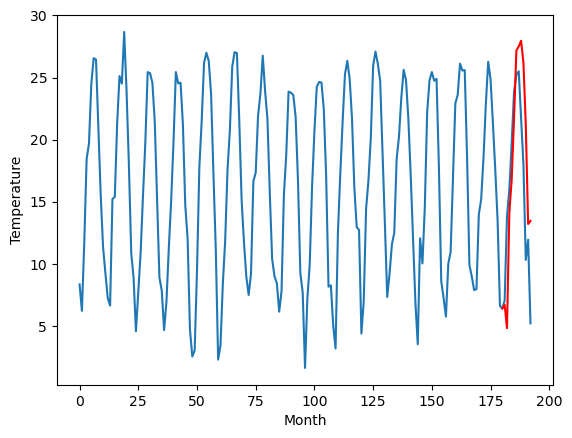

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.91		5.33		-1.58
7.40		3.46		-3.94
14.46		12.77		-1.69
15.86		15.41		-0.45
19.98		20.34		0.36
23.86		25.79		1.93
24.63		26.12		1.49
25.29		26.58		1.29
22.27		24.83		2.56
18.49		19.80		1.31
10.75		11.84		1.09
13.35		12.09		-1.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.6, 5.330924143791199, 3.455540409088135, 12.766196002960205, 15.41410659790039, 20.344066848754885, 25.791353454589846, 26.12139641284943, 26.57538439869881, 24.825610896348955, 19.796775599718096, 11.84407164692879, 12.090000694394114]


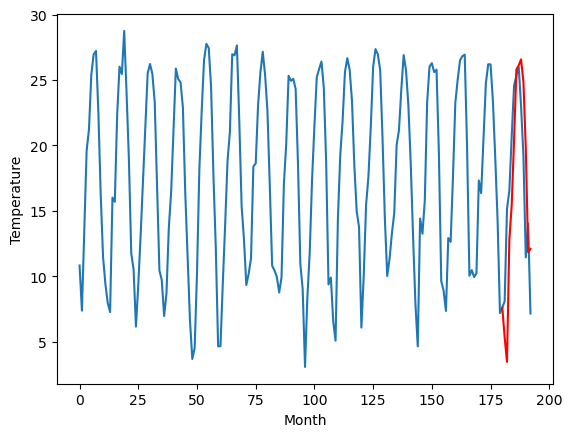

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.19		4.12		-1.07
3.60		2.25		-1.35
10.97		11.55		0.58
13.31		14.20		0.89
17.20		19.13		1.93
21.09		24.58		3.49
20.97		24.92		3.95
21.94		25.37		3.43
18.93		23.62		4.69
16.24		18.59		2.35
9.08		10.65		1.57
12.45		10.89		-1.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.89, 4.124267973899841, 2.248627939224243, 11.54763440132141, 14.203920164108276, 19.13042477607727, 24.57984475135803, 24.916435250043868, 25.37439165353775, 23.62173769712448, 18.590805747509002, 10.645193316936492, 10.890684031844138]


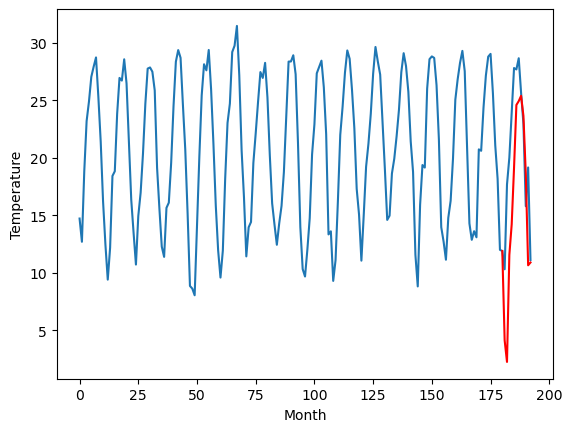

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.20		11.04		-1.16
10.50		9.17		-1.33
18.11		18.46		0.35
20.41		21.12		0.71
24.53		26.05		1.52
28.00		31.50		3.50
28.09		31.83		3.74
29.06		32.30		3.24
25.48		30.54		5.06
22.44		25.51		3.07
14.89		17.57		2.68
18.77		17.81		-0.96
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.96, 11.04387851715088, 9.171179494857789, 18.46095820426941, 21.120893440246583, 26.047237358093263, 31.497021160125733, 31.831817260980607, 32.295724353790284, 30.538785061836244, 25.505928597450257, 17.56523855686188, 17.806651256084443]


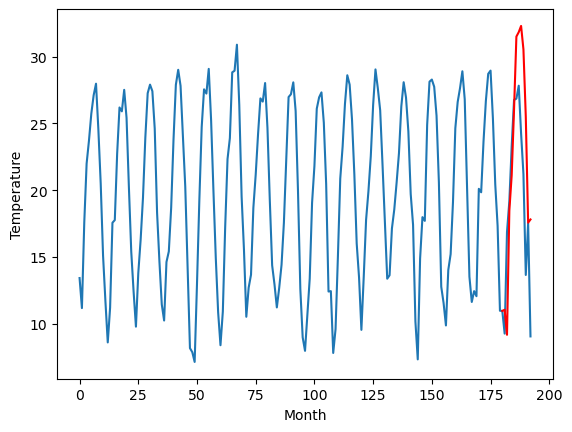

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.01		13.36		0.35
13.39		11.50		-1.89
20.73		20.79		0.06
23.00		23.46		0.46
28.59		28.38		-0.21
32.86		33.83		0.97
32.20		34.17		1.97
31.61		34.63		3.02
31.25		32.88		1.63
26.93		27.83		0.90
20.46		19.89		-0.57
20.72		20.12		-0.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 13.355435271263122, 11.497260828018188, 20.79248501777649, 23.458210487365722, 28.38495542526245, 33.82854988098144, 34.16735940098762, 34.62953277349472, 32.87850495100021, 27.833451468944546, 19.889174659252163, 20.117981527447697]


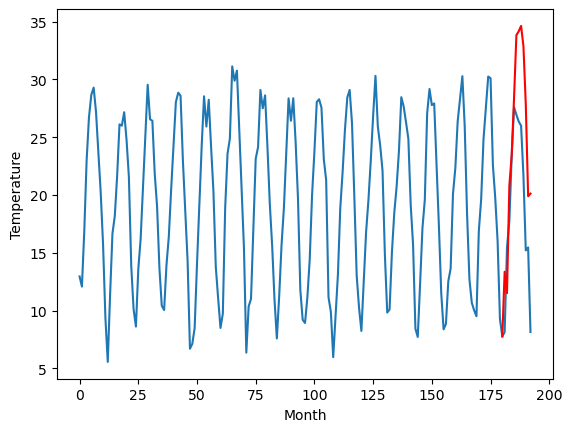

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.71		7.75		-0.96
9.49		5.89		-3.60
15.77		15.19		-0.58
18.34		17.85		-0.49
22.11		22.79		0.68
26.12		28.23		2.11
27.48		28.56		1.08
27.74		29.03		1.29
24.41		27.27		2.86
20.46		22.23		1.77
12.86		14.28		1.42
14.38		14.52		0.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.17, 7.752661738395691, 5.889154944419861, 15.186474356651306, 17.851460013389588, 22.786214385032654, 28.231765303611756, 28.562861028909683, 29.025204632282257, 27.26599535703659, 22.226671550273895, 14.275215957164765, 14.520131368041039]


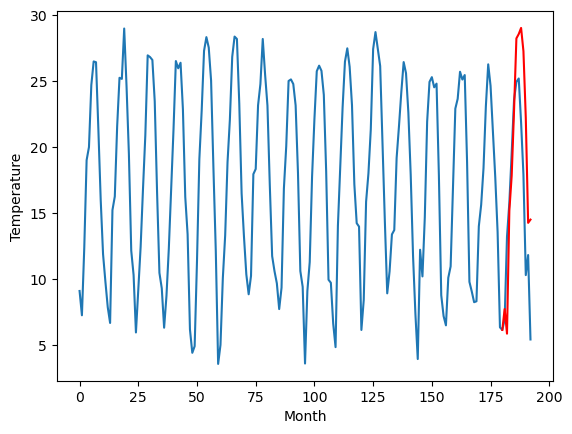

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.92		13.07		-0.85
10.92		11.19		0.27
22.24		20.49		-1.75
23.95		23.15		-0.80
28.61		28.08		-0.53
34.69		33.53		-1.16
35.68		33.87		-1.81
36.90		34.34		-2.56
33.19		32.59		-0.60
27.99		27.56		-0.43
18.69		19.61		0.92
21.10		19.86		-1.24
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.57, 13.066234569549561, 11.193666677474976, 20.486446599960328, 23.151042919158936, 28.08473871231079, 33.532033424377445, 33.872416238784794, 34.34244231462479, 32.59109358072281, 27.559271852970127, 19.609862368106846, 19.85511239945889]


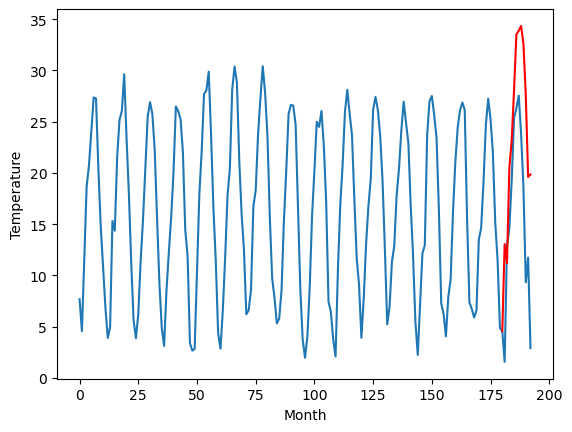

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.95		12.13		-0.82
8.17		10.27		2.10
20.73		19.56		-1.17
22.53		22.23		-0.30
27.34		27.16		-0.18
33.37		32.61		-0.76
34.88		32.96		-1.92
35.27		33.43		-1.84
32.76		31.68		-1.08
26.51		26.66		0.15
18.76		18.72		-0.04
17.95		18.96		1.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.46, 12.134131956100465, 10.269656467437745, 19.560836124420167, 22.229457664489747, 27.164376544952393, 32.61293535232544, 32.96000851988792, 33.43306376338005, 31.684264796972272, 26.659000533819196, 18.71599783301353, 18.955625909566876]


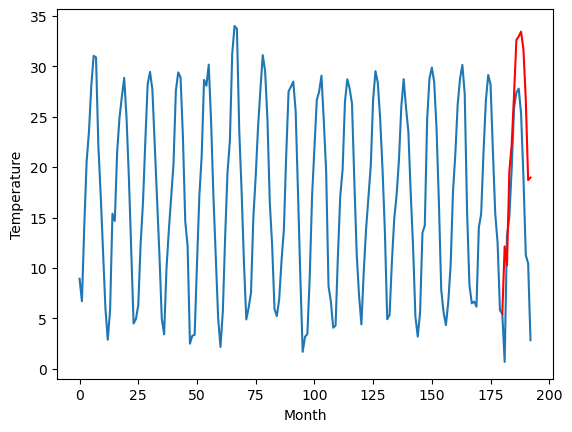

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.90		9.62		-1.28
6.53		7.76		1.23
17.24		17.05		-0.19
21.00		19.72		-1.28
25.55		24.66		-0.89
32.66		30.11		-2.55
33.33		30.45		-2.88
33.18		30.93		-2.25
31.23		29.18		-2.05
23.79		24.16		0.37
17.54		16.21		-1.33
15.93		16.45		0.52
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.42, 9.619599976539611, 7.759279885292052, 17.05218283176422, 19.721598782539367, 24.662127652168273, 30.113553204536437, 30.452677764892577, 30.926110663414, 29.182399430274963, 24.157554783821105, 16.20904032230377, 16.450449102520942]


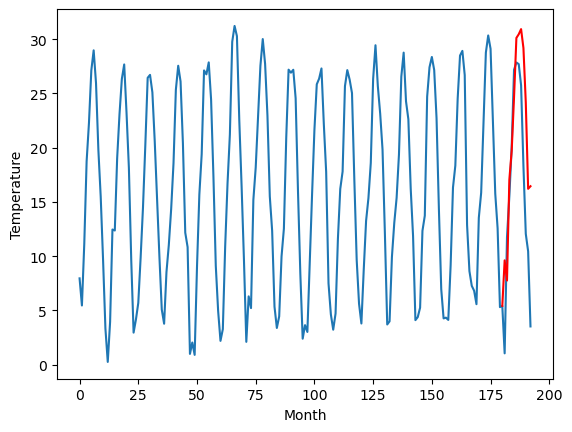

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.01		7.68		0.67
6.05		5.82		-0.23
13.27		15.12		1.85
17.92		17.79		-0.13
22.46		22.73		0.27
28.55		28.20		-0.35
30.78		28.52		-2.26
30.56		28.98		-1.58
26.86		27.22		0.36
22.44		22.19		-0.25
13.12		14.22		1.10
12.35		14.46		2.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.17, 7.679472780227661, 5.822372651100158, 15.120524621009826, 17.786616063117982, 22.725063061714174, 28.197541928291322, 28.521011924743654, 28.976062452793123, 27.215639984607698, 22.18745223283768, 14.222876465320589, 14.460864728689195]


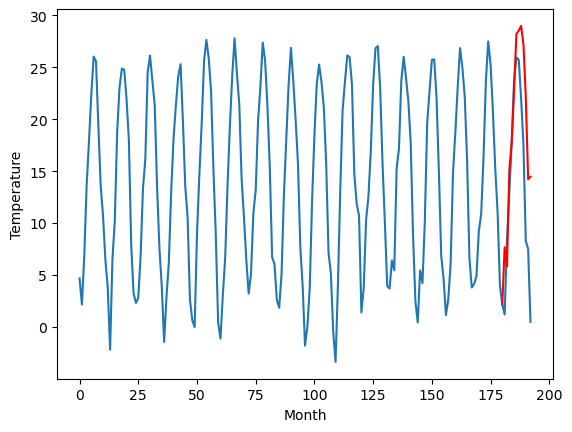

RangeIndex(start=1, stop=12, step=1)
[9.27, 7.669999999999999, 6.91, 5.1899999999999995, 12.2, 13.01, 8.709999999999999, 13.92, 12.950000000000001, 10.9, 7.01]
[7.6843384265899655, 6.708529944419861, 5.330924143791199, 4.124267973899841, 11.04387851715088, 13.355435271263122, 7.752661738395691, 13.066234569549561, 12.134131956100465, 9.619599976539611, 7.679472780227661]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    9.27   7.684338
1                 1    7.67   6.708530
2                 2    6.91   5.330924
3                 3    5.19   4.124268
4                 4   12.20  11.043879
5                 5   13.01  13.355435
6                 6    8.71   7.752662
7                 7   13.92  13.066235
8                 8   12.95  12.134132
9                 9   10.90   9.619600
10               10    7.01   7.679473


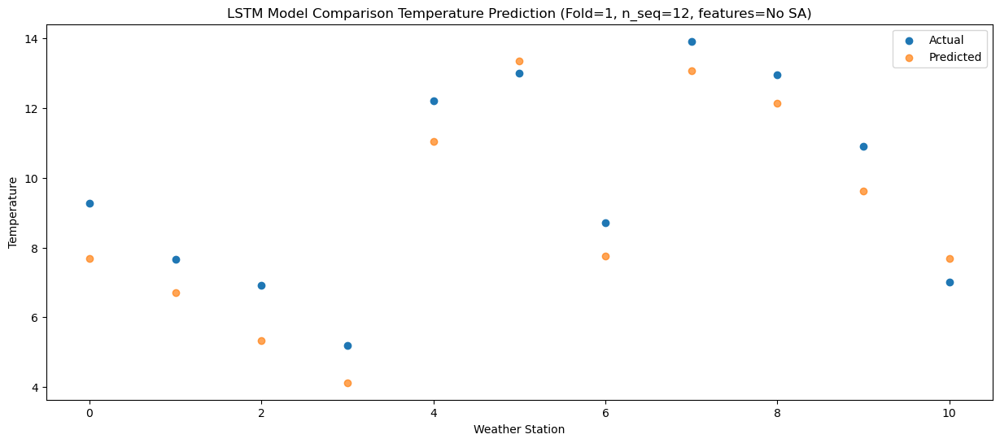

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    9.49   5.813681
1                 1    8.33   4.833515
2                 2    7.40   3.455540
3                 3    3.60   2.248628
4                 4   10.50   9.171179
5                 5   13.39  11.497261
6                 6    9.49   5.889155
7                 7   10.92  11.193667
8                 8    8.17  10.269656
9                 9    6.53   7.759280
10               10    6.05   5.822373


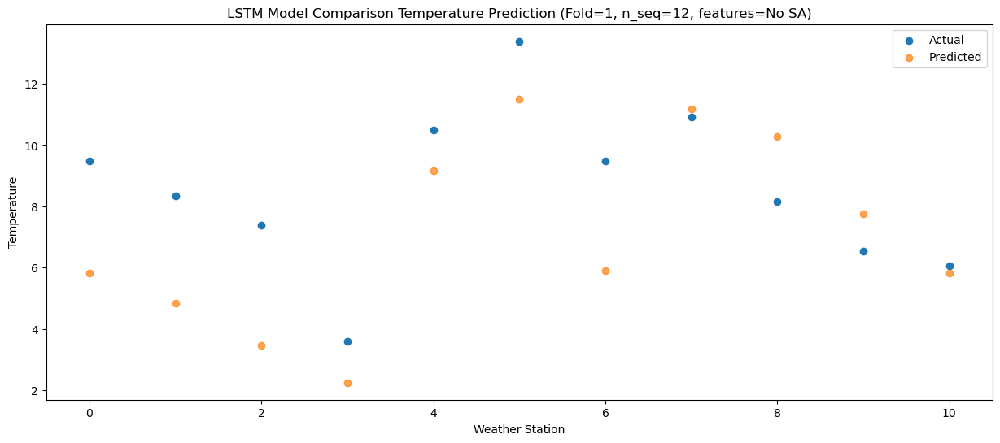

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   14.47  15.128264
1                 1   15.10  14.147352
2                 2   14.46  12.766196
3                 3   10.97  11.547634
4                 4   18.11  18.460958
5                 5   20.73  20.792485
6                 6   15.77  15.186474
7                 7   22.24  20.486447
8                 8   20.73  19.560836
9                 9   17.24  17.052183
10               10   13.27  15.120525


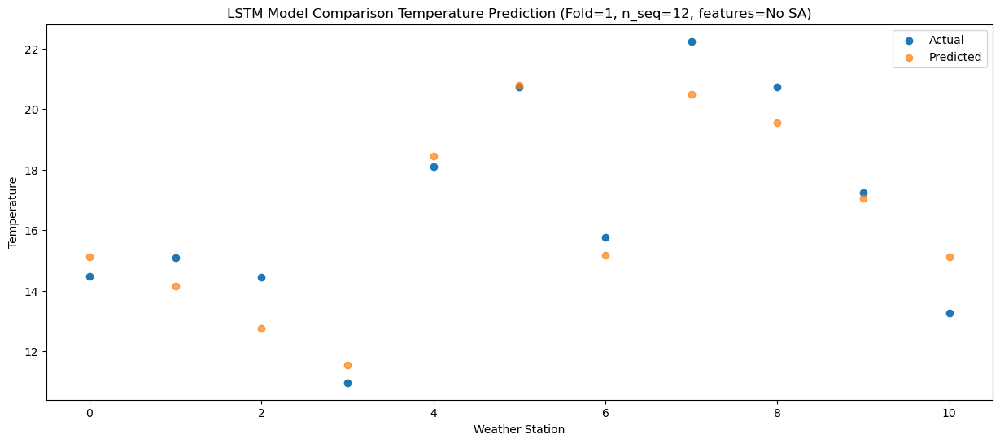

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.28  17.775208
1                 1   17.24  16.796443
2                 2   15.86  15.414107
3                 3   13.31  14.203920
4                 4   20.41  21.120893
5                 5   23.00  23.458210
6                 6   18.34  17.851460
7                 7   23.95  23.151043
8                 8   22.53  22.229458
9                 9   21.00  19.721599
10               10   17.92  17.786616


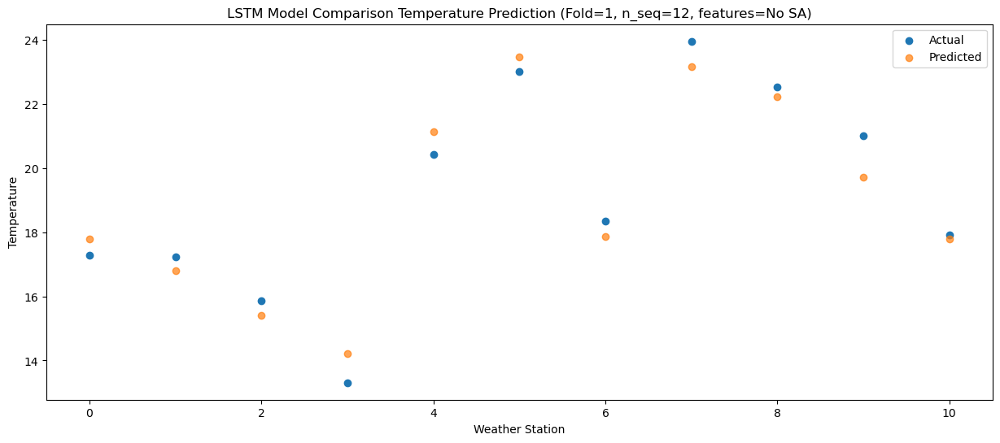

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.89  22.713377
1                 1   20.97  21.729616
2                 2   19.98  20.344067
3                 3   17.20  19.130425
4                 4   24.53  26.047237
5                 5   28.59  28.384955
6                 6   22.11  22.786214
7                 7   28.61  28.084739
8                 8   27.34  27.164377
9                 9   25.55  24.662128
10               10   22.46  22.725063


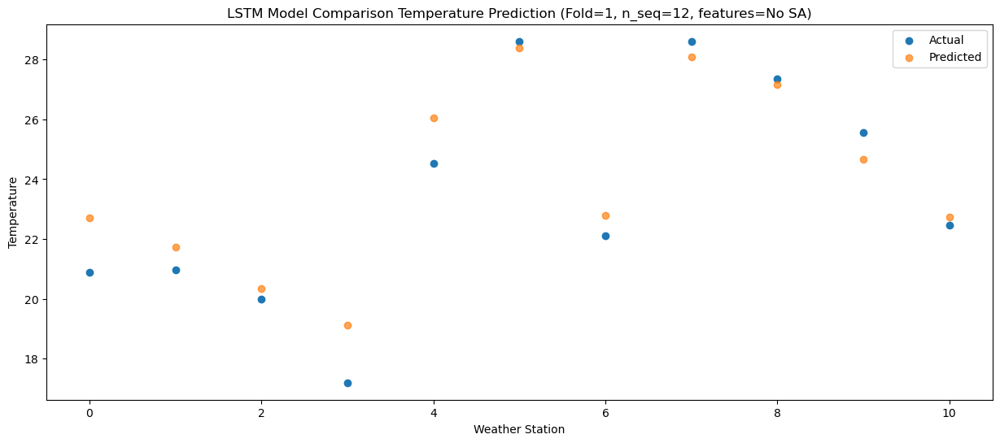

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   24.38  28.175984
1                 1   25.11  27.181100
2                 2   23.86  25.791353
3                 3   21.09  24.579845
4                 4   28.00  31.497021
5                 5   32.86  33.828550
6                 6   26.12  28.231765
7                 7   34.69  33.532033
8                 8   33.37  32.612935
9                 9   32.66  30.113553
10               10   28.55  28.197542


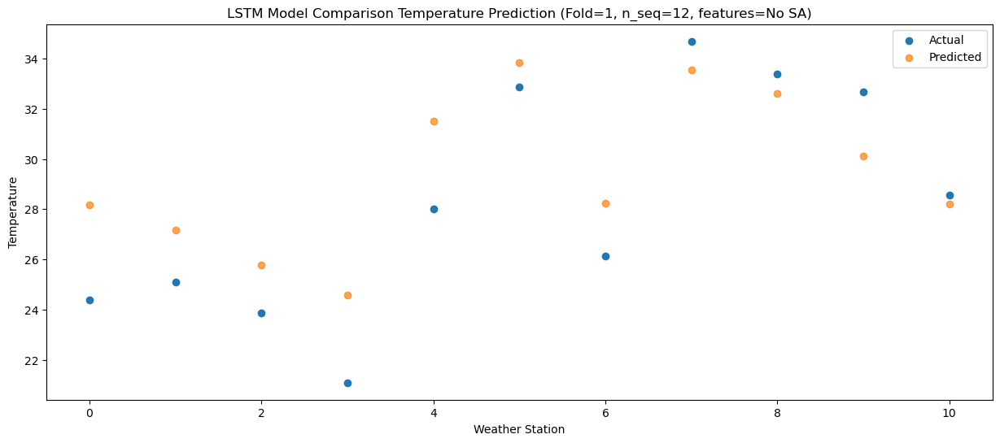

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   25.58  28.501491
1                 1   26.49  27.507822
2                 2   24.63  26.121396
3                 3   20.97  24.916435
4                 4   28.09  31.831817
5                 5   32.20  34.167359
6                 6   27.48  28.562861
7                 7   35.68  33.872416
8                 8   34.88  32.960009
9                 9   33.33  30.452678
10               10   30.78  28.521012


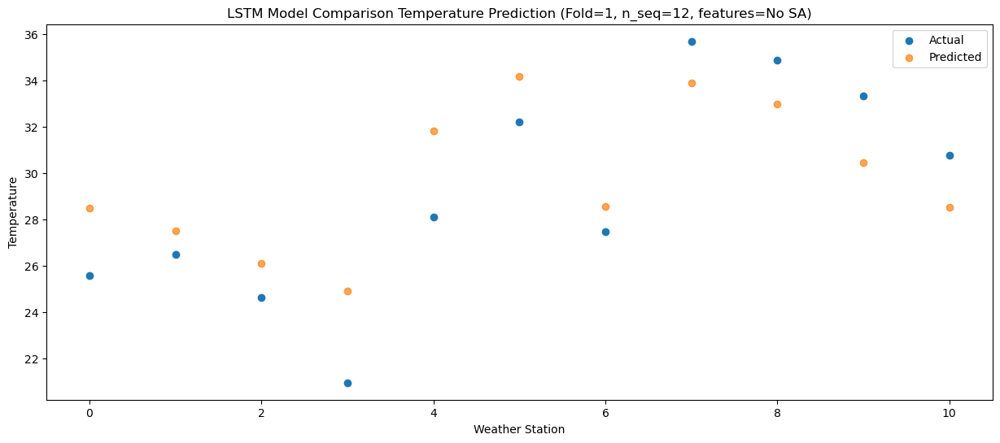

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   25.69  28.950593
1                 1   26.76  27.957310
2                 2   25.29  26.575384
3                 3   21.94  25.374392
4                 4   29.06  32.295724
5                 5   31.61  34.629533
6                 6   27.74  29.025205
7                 7   36.90  34.342442
8                 8   35.27  33.433064
9                 9   33.18  30.926111
10               10   30.56  28.976062


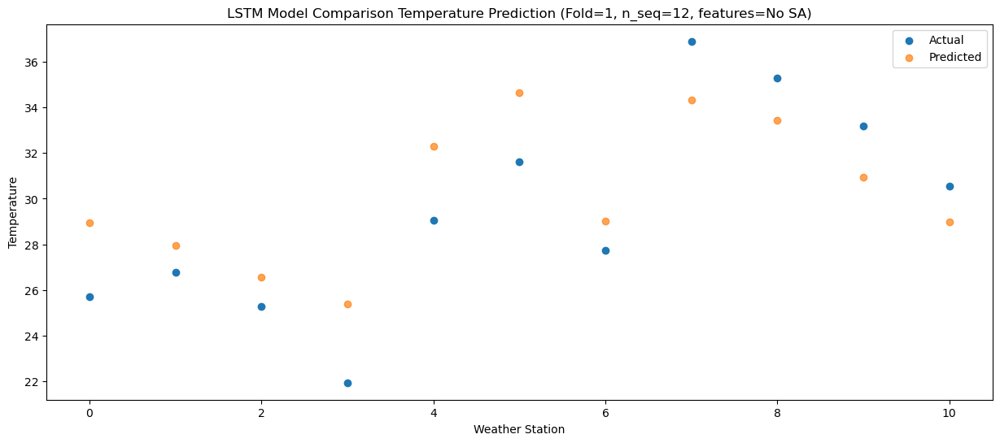

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   23.04  27.199105
1                 1   23.02  26.201149
2                 2   22.27  24.825611
3                 3   18.93  23.621738
4                 4   25.48  30.538785
5                 5   31.25  32.878505
6                 6   24.41  27.265995
7                 7   33.19  32.591094
8                 8   32.76  31.684265
9                 9   31.23  29.182399
10               10   26.86  27.215640


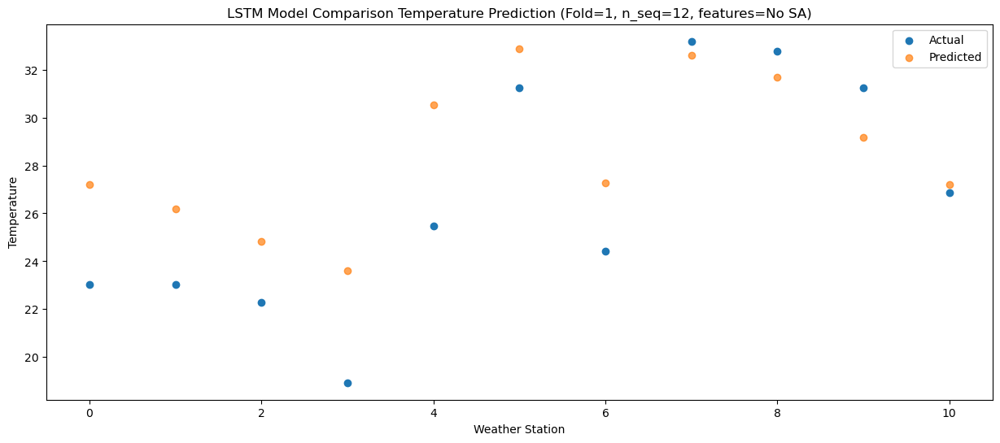

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   19.34  22.171257
1                 1   19.24  21.169012
2                 2   18.49  19.796776
3                 3   16.24  18.590806
4                 4   22.44  25.505929
5                 5   26.93  27.833451
6                 6   20.46  22.226672
7                 7   27.99  27.559272
8                 8   26.51  26.659001
9                 9   23.79  24.157555
10               10   22.44  22.187452


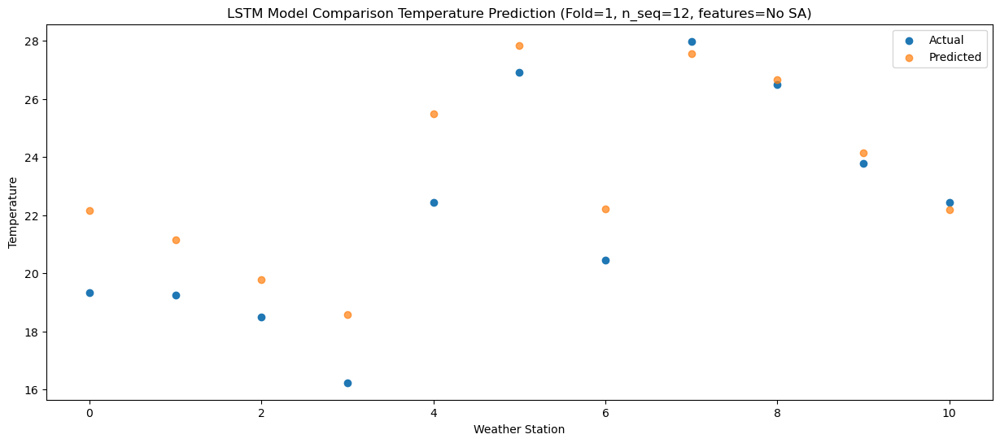

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   11.13  14.210155
1                 1   11.58  13.211751
2                 2   10.75  11.844072
3                 3    9.08  10.645193
4                 4   14.89  17.565239
5                 5   20.46  19.889175
6                 6   12.86  14.275216
7                 7   18.69  19.609862
8                 8   18.76  18.715998
9                 9   17.54  16.209040
10               10   13.12  14.222876


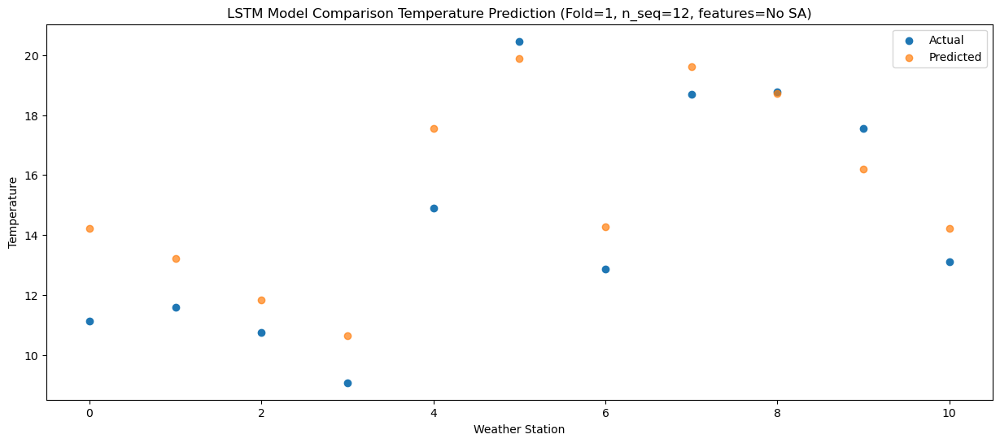

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   13.48  14.454503
1                 1   13.21  13.459785
2                 2   13.35  12.090001
3                 3   12.45  10.890684
4                 4   18.77  17.806651
5                 5   20.72  20.117982
6                 6   14.38  14.520131
7                 7   21.10  19.855112
8                 8   17.95  18.955626
9                 9   15.93  16.450449
10               10   12.35  14.460865


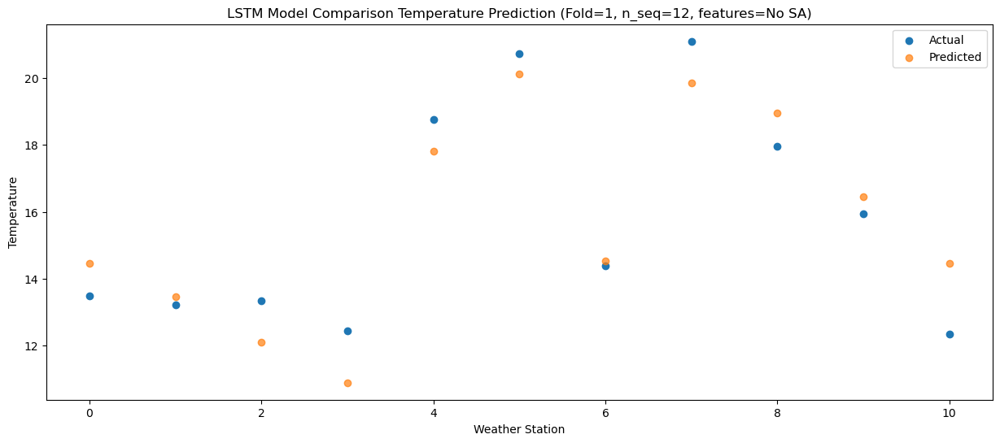

Model: "sequential_509"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1018 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1018 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1019 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1019 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1527 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1528 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1529 (Dense)          (1, 12)                

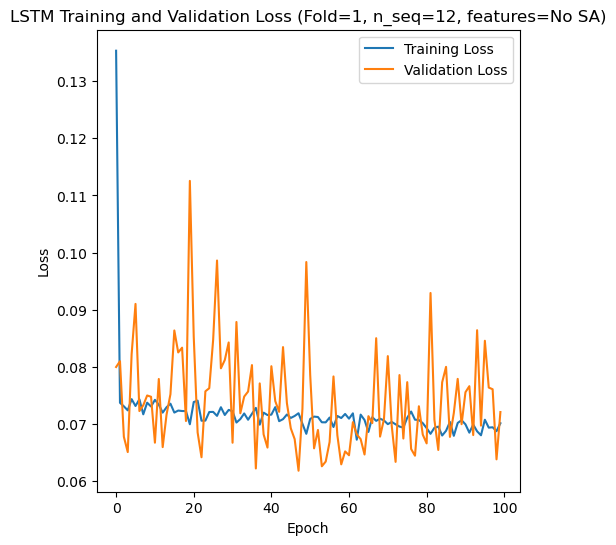

Epoch 1/100
84/84 [==============================] - 36s 212ms/step - loss: 0.1650 - accuracy: 0.5833 - mae: 0.1278 - rmse: 0.1650 - mape: 28.9509 - pearson: 0.6523 - val_loss: 0.0795 - val_accuracy: 0.9000 - val_mae: 0.0635 - val_rmse: 0.0795 - val_mape: 14.9964 - val_pearson: 0.8360
Epoch 2/100
84/84 [==============================] - 8s 92ms/step - loss: 0.0742 - accuracy: 0.7143 - mae: 0.0589 - rmse: 0.0742 - mape: 13.2485 - pearson: 0.7988 - val_loss: 0.0599 - val_accuracy: 0.9000 - val_mae: 0.0493 - val_rmse: 0.0599 - val_mape: 11.7921 - val_pearson: 0.8764
Epoch 3/100
84/84 [==============================] - 7s 87ms/step - loss: 0.0730 - accuracy: 0.7381 - mae: 0.0571 - rmse: 0.0730 - mape: 12.7817 - pearson: 0.8018 - val_loss: 0.0651 - val_accuracy: 0.9000 - val_mae: 0.0521 - val_rmse: 0.0651 - val_mape: 12.0498 - val_pearson: 0.8975
Epoch 4/100
84/84 [==============================] - 8s 92ms/step - loss: 0.0727 - accuracy: 0.7143 - mae: 0.0569 - rmse: 0.0727 - mape: 12.9380 -

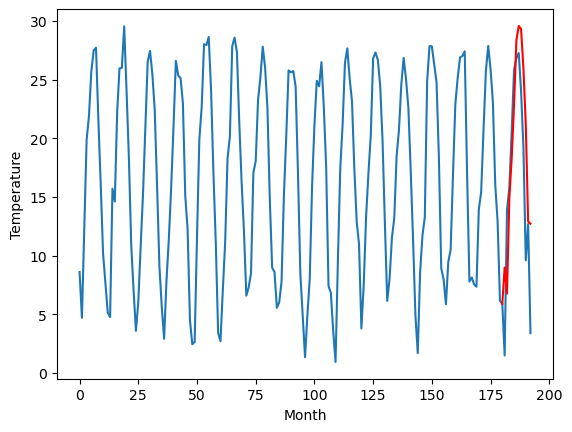

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.79		8.03		0.24
3.75		5.80		2.05
13.94		13.95		0.01
17.70		17.38		-0.32
22.88		21.95		-0.93
30.13		27.43		-2.70
30.82		28.67		-2.15
31.58		28.39		-3.19
29.34		25.00		-4.34
21.08		20.25		-0.83
14.37		11.99		-2.38
11.98		11.79		-0.19
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.63, 8.028687874674798, 5.799854676127435, 13.948263565897943, 17.37644974410534, 21.95049111068249, 27.431122938990594, 28.670266429781915, 28.39466194331646, 25.000572721362115, 20.24957374751568, 11.988182107806207, 11.793392176628114]


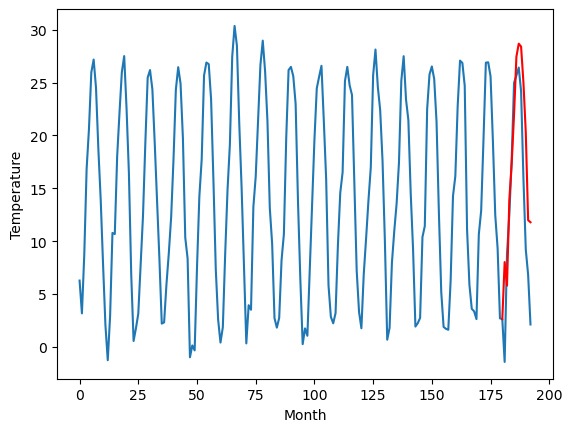

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.15		6.65		-0.50
9.88		4.43		-5.45
11.69		12.58		0.89
13.50		15.99		2.49
17.08		20.56		3.48
18.30		26.04		7.74
19.09		27.28		8.19
19.14		27.00		7.86
17.86		23.61		5.75
16.72		18.87		2.15
9.87		10.61		0.74
10.77		10.42		-0.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[16.55, 6.648069789409638, 4.42720406293869, 12.5782927775383, 15.993185212612152, 20.56409089803696, 26.040189912319185, 27.282902529239657, 26.999681820869448, 23.60929214000702, 18.866281142234804, 10.609822859764101, 10.422570666074755]


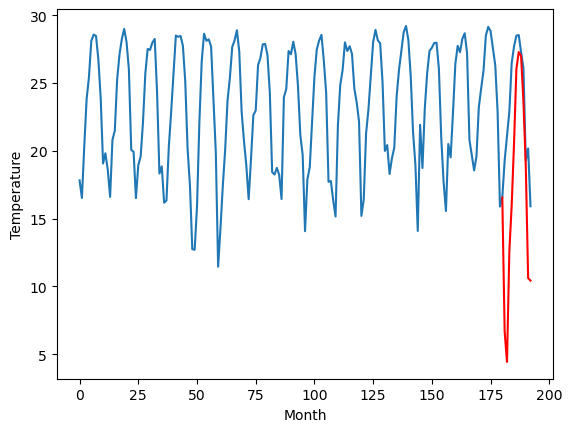

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.21		5.44		3.23
2.23		3.23		1.00
6.34		11.37		5.03
10.84		14.79		3.95
16.10		19.36		3.26
21.67		24.85		3.18
23.67		26.09		2.42
24.73		25.80		1.07
21.56		22.41		0.85
17.73		17.66		-0.07
9.65		9.38		-0.27
7.73		9.17		1.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.83, 5.444227823019028, 3.2303317868709565, 11.374148734807967, 14.786249049901961, 19.361501106023788, 24.845491775274276, 26.087511786222457, 25.801918812990188, 22.406661101579665, 17.658902713060378, 9.382681437730788, 9.172962226867675]


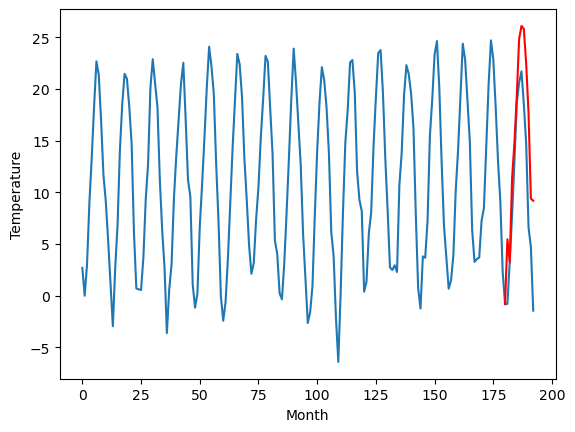

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.56		12.37		-0.19
11.82		10.16		-1.66
19.15		18.29		-0.86
20.02		21.71		1.69
24.49		26.28		1.79
27.97		31.74		3.77
28.56		33.00		4.44
28.73		32.72		3.99
26.19		29.33		3.14
23.45		24.59		1.14
15.18		16.32		1.14
18.59		16.14		-2.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.52, 12.369922093153, 10.159310749769212, 18.29473536372185, 21.711872509717942, 26.279299191236497, 31.74430411219597, 32.99600749373436, 32.72151657104492, 29.332627019882203, 24.58524724006653, 16.32001706123352, 16.141073740124703]


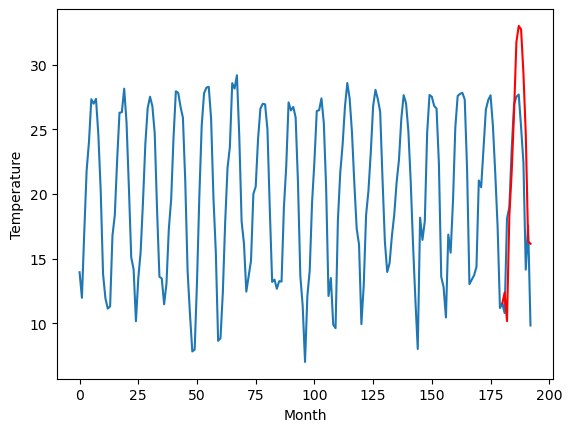

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.93		14.68		0.75
11.58		12.47		0.89
19.96		20.60		0.64
22.08		24.02		1.94
26.12		28.58		2.46
30.67		34.05		3.38
30.75		35.30		4.55
31.86		35.02		3.16
29.12		31.64		2.52
25.82		26.88		1.06
18.18		18.61		0.43
21.42		18.43		-2.99
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.47, 14.681644890904426, 12.471878264546394, 20.603345130085945, 24.01967785179615, 28.581638072133064, 34.0454261046648, 35.29638979256153, 35.01949420988559, 31.638987217545505, 26.88461223661899, 18.61081138670444, 18.432561699748035]


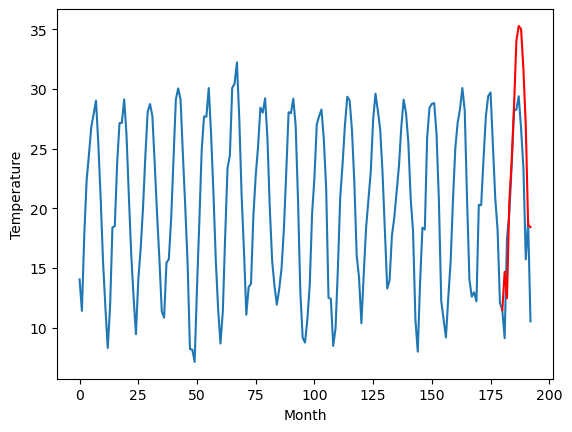

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.21		9.07		0.86
5.10		6.86		1.76
15.47		15.00		-0.47
17.17		18.41		1.24
21.25		22.97		1.72
26.81		28.43		1.62
27.70		29.68		1.98
28.26		29.40		1.14
25.99		26.02		0.03
21.48		21.26		-0.22
13.51		12.99		-0.52
15.80		12.81		-2.99
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 9.071552667617798, 6.861317071914673, 14.997732553482056, 18.411924514770508, 22.967274341583252, 28.430211219787598, 29.68397096157074, 29.40442347884178, 26.022405389547348, 21.264658216238022, 12.989494565725327, 12.81081712603569]


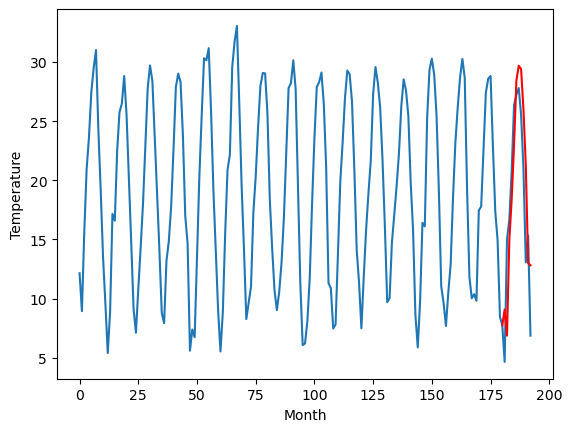

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.77		14.39		-0.38
17.69		12.18		-5.51
20.79		20.32		-0.47
27.45		23.75		-3.70
32.46		28.32		-4.14
37.45		33.78		-3.67
36.25		35.03		-1.22
35.73		34.73		-1.00
33.55		31.35		-2.20
26.99		26.59		-0.40
21.59		18.32		-3.27
18.24		18.14		-0.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.9, 14.392896752357483, 12.177435021400452, 20.318799118995667, 23.748160700798035, 28.31632743358612, 33.77901492595673, 35.03252552032471, 34.73496810674668, 31.35155002355576, 26.5904525923729, 18.3210958647728, 18.136115874648098]


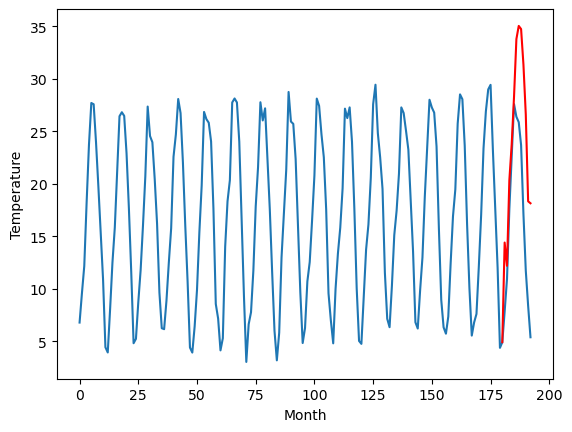

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.24		13.46		0.22
12.32		11.24		-1.08
11.92		19.37		7.45
15.78		22.79		7.01
18.00		27.35		9.35
22.24		32.81		10.57
25.22		34.06		8.84
24.82		33.76		8.94
23.04		30.37		7.33
18.06		25.60		7.54
16.80		17.33		0.53
10.29		17.13		6.84
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.14, 13.456190007925034, 11.242791551351548, 19.369480508565903, 22.789749282598496, 27.349219459295274, 32.81042160391807, 34.06080247759819, 33.756193953752515, 30.371533948183057, 25.60462148785591, 17.328018742799756, 17.13023844659328]


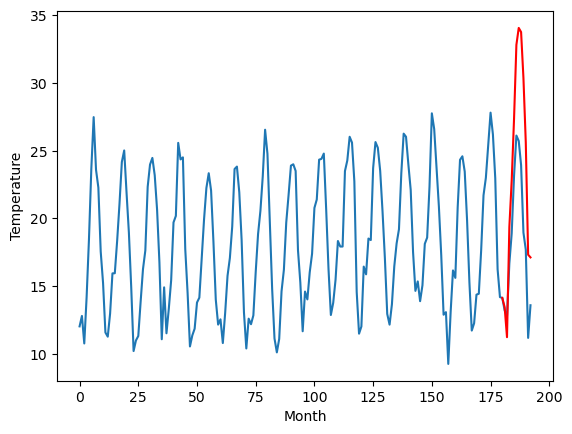

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.38		10.95		0.57
10.88		8.74		-2.14
17.76		16.87		-0.89
20.55		20.29		-0.26
24.57		24.85		0.28
28.86		30.30		1.44
30.43		31.56		1.13
30.52		31.28		0.76
26.41		27.89		1.48
23.13		23.15		0.02
14.22		14.86		0.64
16.14		14.67		-1.47
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.55, 10.948405318856238, 8.740130000710487, 16.87152438700199, 20.288374953866004, 24.84748416483402, 30.303272777199744, 31.56086080610752, 31.27504413664341, 27.889880829453467, 23.147060089707374, 14.864992790818214, 14.670859211087226]


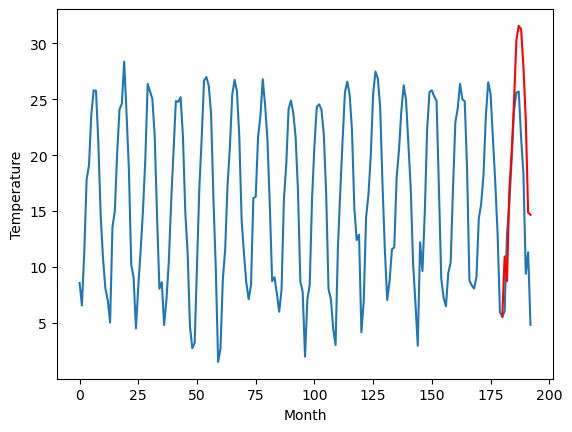

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.18		9.00		-0.18
10.53		6.79		-3.74
16.74		14.93		-1.81
18.71		18.34		-0.37
23.62		22.90		-0.72
29.03		28.36		-0.67
30.34		29.61		-0.73
30.42		29.33		-1.09
25.93		25.94		0.01
22.17		21.20		-0.97
11.95		12.92		0.97
14.05		12.73		-1.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.19, 9.00304659307003, 6.793662628531456, 14.92970903813839, 18.341434559226037, 22.898742279410364, 28.36000736653805, 29.61111625134945, 29.32865001857281, 25.93957998454571, 21.197398206591608, 12.917832395434381, 12.725438287854196]


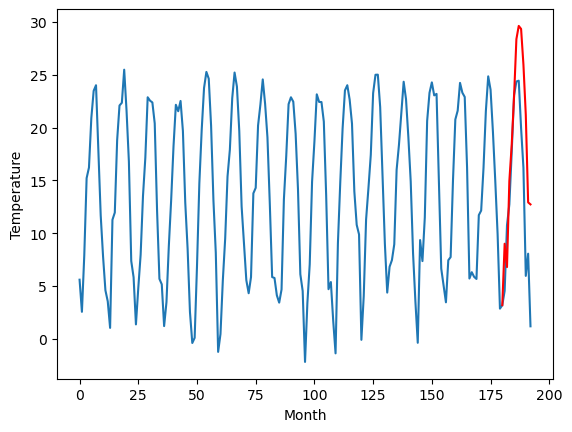

RangeIndex(start=1, stop=12, step=1)
[8.59, 7.790000000000001, 7.1499999999999995, 2.210000000000001, 12.560000000000002, 13.93, 8.21, 14.770000000000001, 13.240000000000004, 10.379999999999999, 9.18]
[9.00149450302124, 8.028687874674798, 6.648069789409638, 5.444227823019028, 12.369922093153, 14.681644890904426, 9.071552667617798, 14.392896752357483, 13.456190007925034, 10.948405318856238, 9.00304659307003]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.59   9.001495
1                 1    7.79   8.028688
2                 2    7.15   6.648070
3                 3    2.21   5.444228
4                 4   12.56  12.369922
5                 5   13.93  14.681645
6                 6    8.21   9.071553
7                 7   14.77  14.392897
8                 8   13.24  13.456190
9                 9   10.38  10.948405
10               10    9.18   9.003047


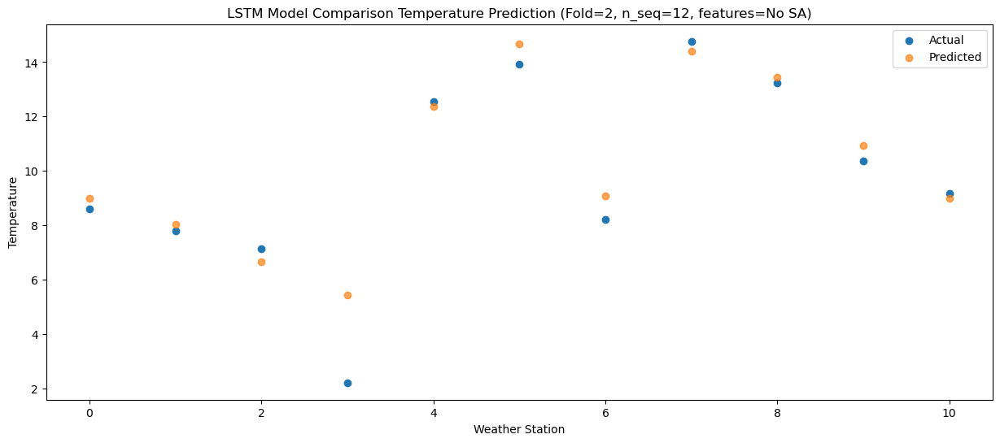

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.19   6.774543
1                 1    3.75   5.799855
2                 2    9.88   4.427204
3                 3    2.23   3.230332
4                 4   11.82  10.159311
5                 5   11.58  12.471878
6                 6    5.10   6.861317
7                 7   17.69  12.177435
8                 8   12.32  11.242792
9                 9   10.88   8.740130
10               10   10.53   6.793663


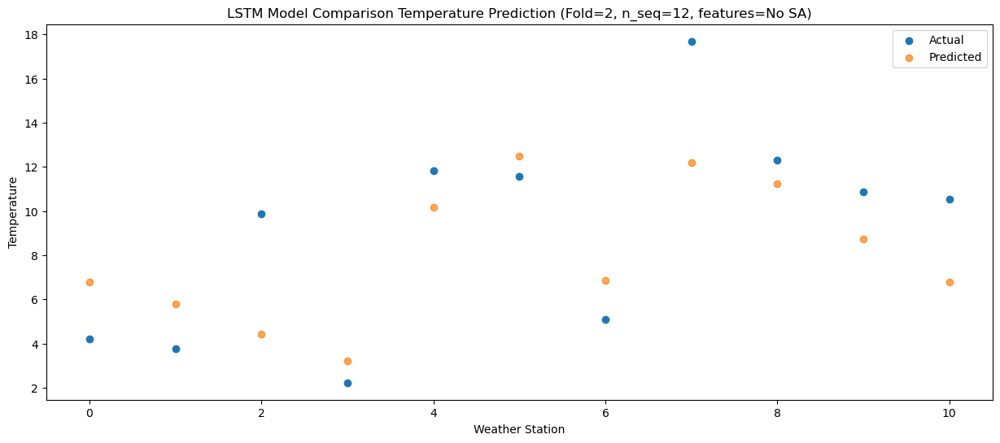

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.61  14.914655
1                 1   13.94  13.948264
2                 2   11.69  12.578293
3                 3    6.34  11.374149
4                 4   19.15  18.294735
5                 5   19.96  20.603345
6                 6   15.47  14.997733
7                 7   20.79  20.318799
8                 8   11.92  19.369481
9                 9   17.76  16.871524
10               10   16.74  14.929709


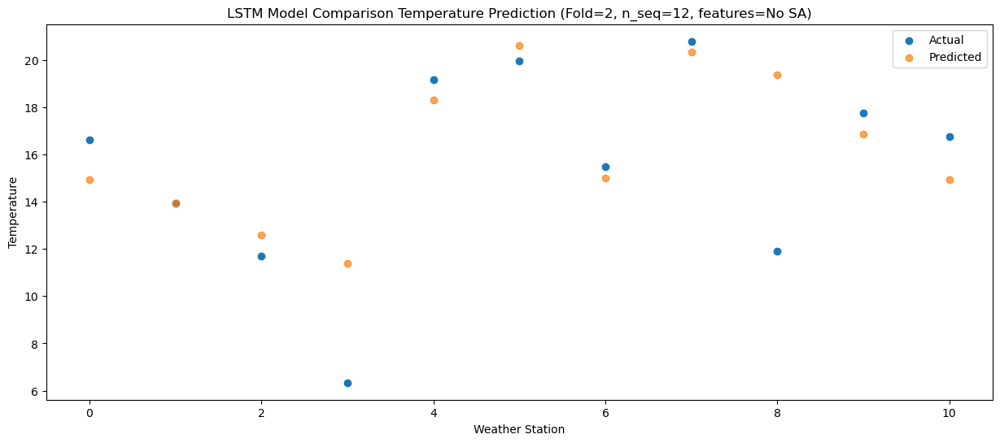

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.48  18.318010
1                 1   17.70  17.376450
2                 2   13.50  15.993185
3                 3   10.84  14.786249
4                 4   20.02  21.711873
5                 5   22.08  24.019678
6                 6   17.17  18.411925
7                 7   27.45  23.748161
8                 8   15.78  22.789749
9                 9   20.55  20.288375
10               10   18.71  18.341435


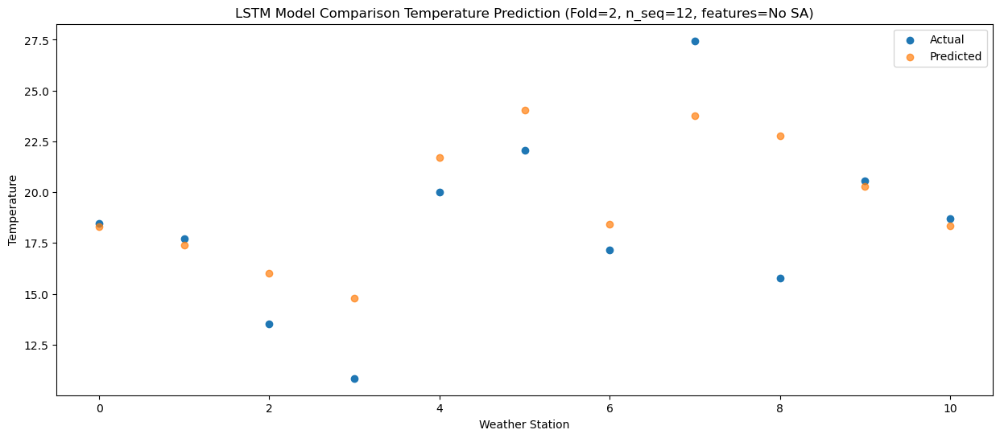

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   23.26  22.877800
1                 1   22.88  21.950491
2                 2   17.08  20.564091
3                 3   16.10  19.361501
4                 4   24.49  26.279299
5                 5   26.12  28.581638
6                 6   21.25  22.967274
7                 7   32.46  28.316327
8                 8   18.00  27.349219
9                 9   24.57  24.847484
10               10   23.62  22.898742


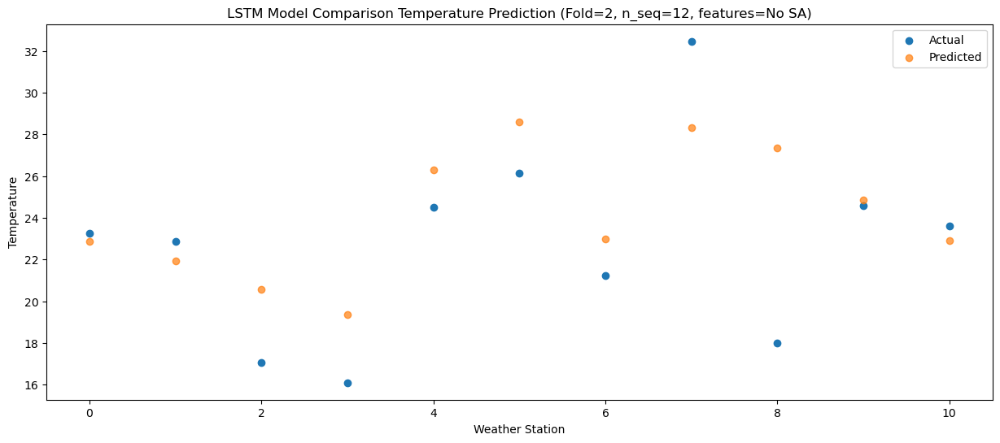

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.51  28.351131
1                 1   30.13  27.431123
2                 2   18.30  26.040190
3                 3   21.67  24.845492
4                 4   27.97  31.744304
5                 5   30.67  34.045426
6                 6   26.81  28.430211
7                 7   37.45  33.779015
8                 8   22.24  32.810422
9                 9   28.86  30.303273
10               10   29.03  28.360007


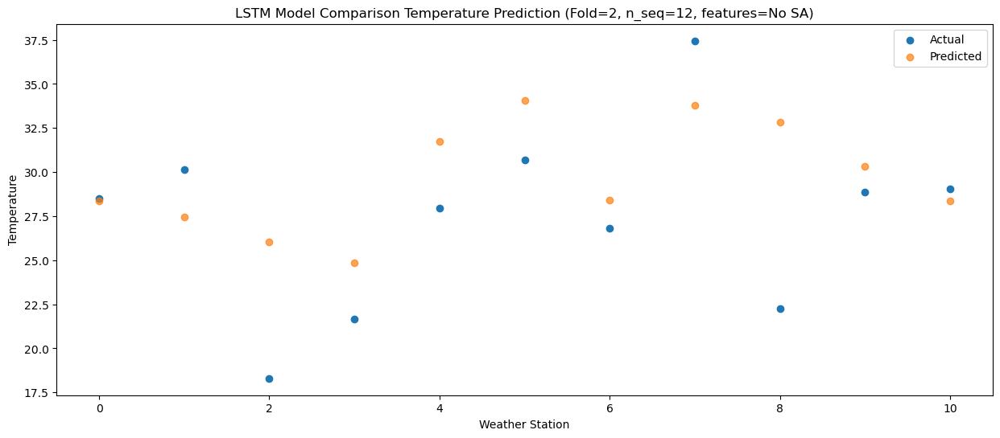

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   29.52  29.585253
1                 1   30.82  28.670266
2                 2   19.09  27.282903
3                 3   23.67  26.087512
4                 4   28.56  32.996007
5                 5   30.75  35.296390
6                 6   27.70  29.683971
7                 7   36.25  35.032526
8                 8   25.22  34.060802
9                 9   30.43  31.560861
10               10   30.34  29.611116


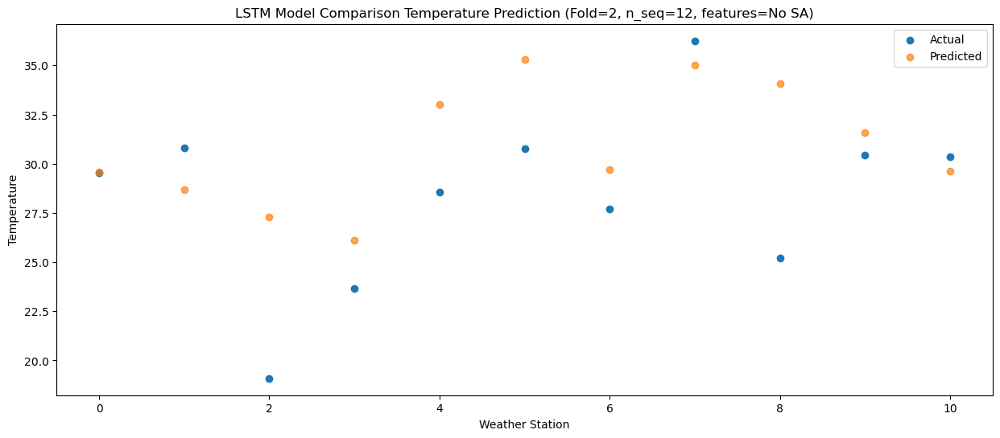

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   29.97  29.313997
1                 1   31.58  28.394662
2                 2   19.14  26.999682
3                 3   24.73  25.801919
4                 4   28.73  32.721517
5                 5   31.86  35.019494
6                 6   28.26  29.404423
7                 7   35.73  34.734968
8                 8   24.82  33.756194
9                 9   30.52  31.275044
10               10   30.42  29.328650


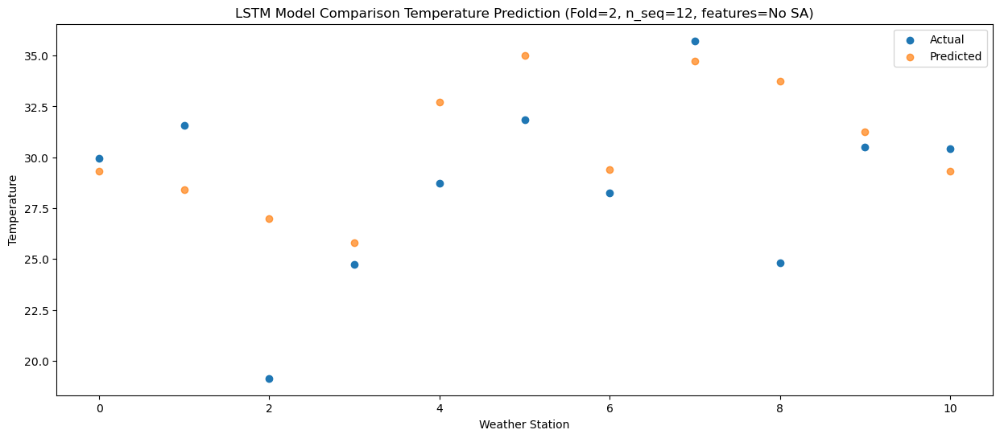

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   26.67  25.929483
1                 1   29.34  25.000573
2                 2   17.86  23.609292
3                 3   21.56  22.406661
4                 4   26.19  29.332627
5                 5   29.12  31.638987
6                 6   25.99  26.022405
7                 7   33.55  31.351550
8                 8   23.04  30.371534
9                 9   26.41  27.889881
10               10   25.93  25.939580


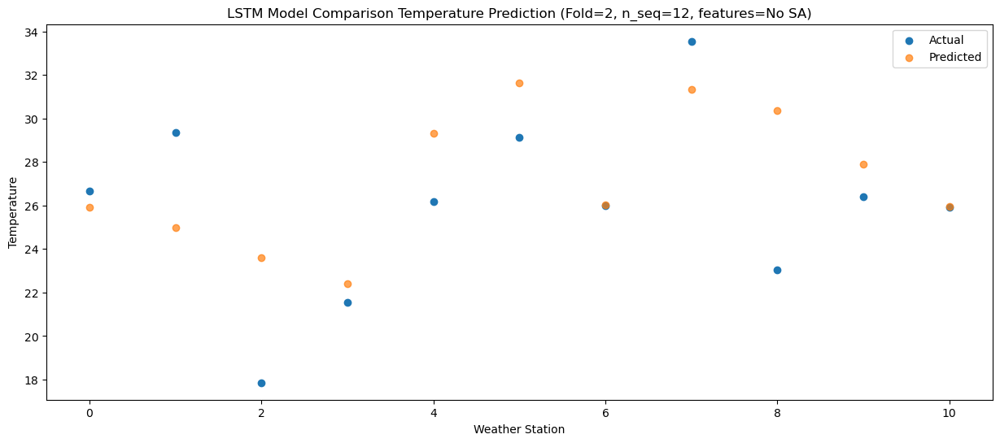

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.92  21.176183
1                 1   21.08  20.249574
2                 2   16.72  18.866281
3                 3   17.73  17.658903
4                 4   23.45  24.585247
5                 5   25.82  26.884612
6                 6   21.48  21.264658
7                 7   26.99  26.590453
8                 8   18.06  25.604621
9                 9   23.13  23.147060
10               10   22.17  21.197398


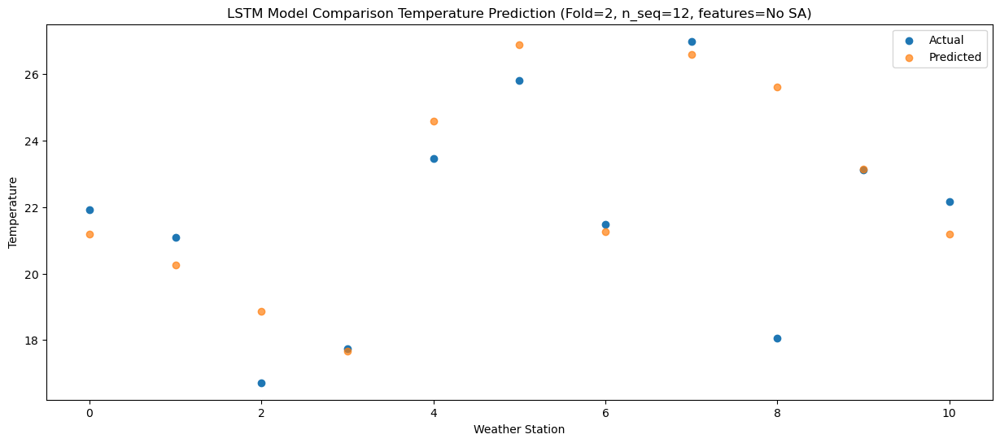

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   12.30  12.914929
1                 1   14.37  11.988182
2                 2    9.87  10.609823
3                 3    9.65   9.382681
4                 4   15.18  16.320017
5                 5   18.18  18.610811
6                 6   13.51  12.989495
7                 7   21.59  18.321096
8                 8   16.80  17.328019
9                 9   14.22  14.864993
10               10   11.95  12.917832


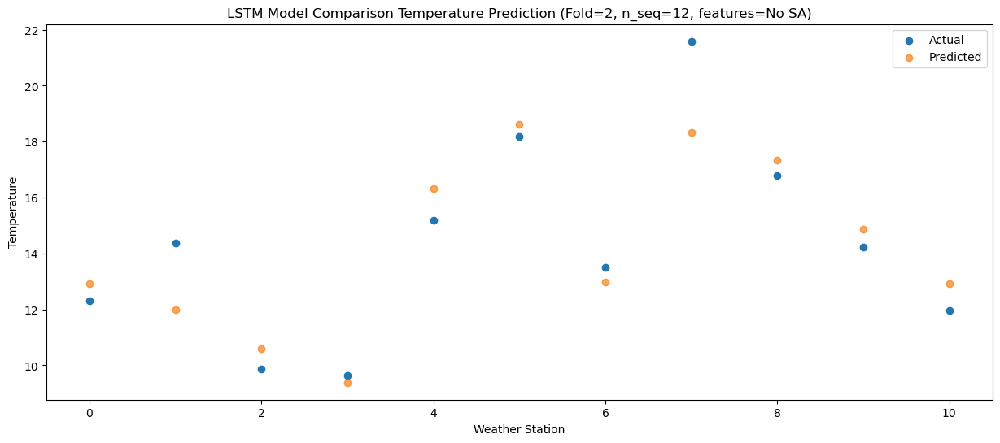

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.39  12.728375
1                 1   11.98  11.793392
2                 2   10.77  10.422571
3                 3    7.73   9.172962
4                 4   18.59  16.141074
5                 5   21.42  18.432562
6                 6   15.80  12.810817
7                 7   18.24  18.136116
8                 8   10.29  17.130238
9                 9   16.14  14.670859
10               10   14.05  12.725438


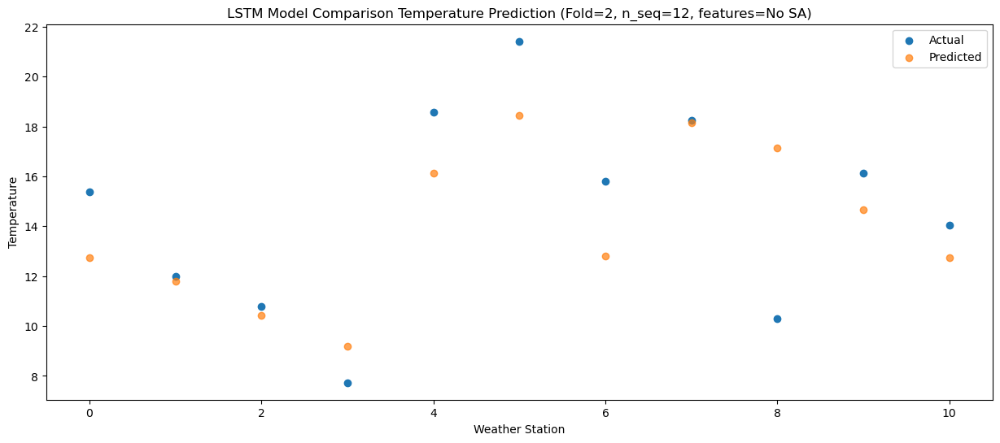

Model: "sequential_510"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1020 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1020 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1021 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1021 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1530 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1531 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1532 (Dense)          (1, 12)                

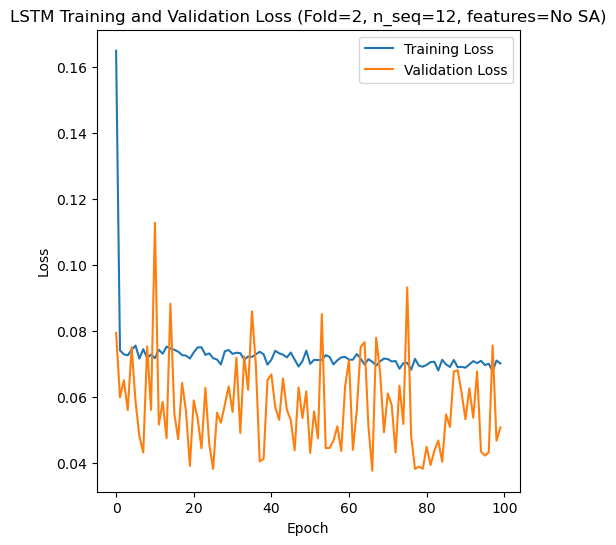

Epoch 1/100
84/84 [==============================] - 30s 170ms/step - loss: 0.2394 - accuracy: 0.6071 - mae: 0.1971 - rmse: 0.2394 - mape: 43.4435 - pearson: 0.6116 - val_loss: 0.1071 - val_accuracy: 0.7000 - val_mae: 0.0830 - val_rmse: 0.1071 - val_mape: 21.5918 - val_pearson: 0.6482
Epoch 2/100
84/84 [==============================] - 7s 78ms/step - loss: 0.0685 - accuracy: 0.7857 - mae: 0.0535 - rmse: 0.0685 - mape: 12.8652 - pearson: 0.8335 - val_loss: 0.0890 - val_accuracy: 0.7000 - val_mae: 0.0690 - val_rmse: 0.0890 - val_mape: 17.6388 - val_pearson: 0.7723
Epoch 3/100
84/84 [==============================] - 6s 76ms/step - loss: 0.0697 - accuracy: 0.7738 - mae: 0.0544 - rmse: 0.0697 - mape: 12.7300 - pearson: 0.8318 - val_loss: 0.0852 - val_accuracy: 0.7000 - val_mae: 0.0689 - val_rmse: 0.0852 - val_mape: 18.5499 - val_pearson: 0.7353
Epoch 4/100
84/84 [==============================] - 8s 92ms/step - loss: 0.0699 - accuracy: 0.7857 - mae: 0.0548 - rmse: 0.0699 - mape: 12.9840 -

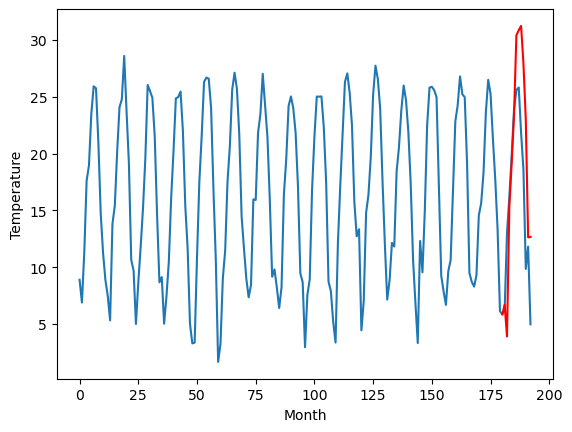

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.72		5.70		-1.02
3.00		2.90		-0.10
14.97		14.30		-0.67
16.83		18.22		1.39
21.05		22.45		1.40
27.76		29.45		1.69
29.07		29.89		0.82
29.64		30.27		0.63
26.91		26.97		0.06
20.31		22.02		1.71
12.60		11.64		-0.96
13.91		11.68		-2.23
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.2, 5.696825618743897, 2.9027510833740235, 14.300405616760255, 18.224493856430055, 22.45016610145569, 29.45454203605652, 29.89047061920166, 30.265394504070283, 26.974347169399262, 22.016188199520112, 11.644461209774018, 11.68134719029069]


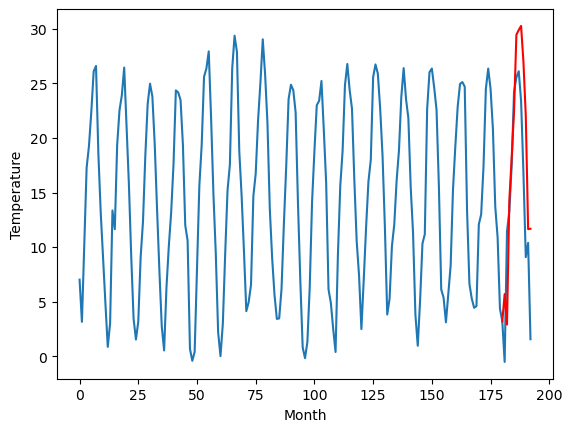

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		4.31		-3.44
10.05		1.51		-8.54
11.20		12.90		1.70
16.93		16.83		-0.10
21.73		21.04		-0.69
26.58		28.05		1.47
29.71		28.49		-1.22
27.51		28.87		1.36
24.20		25.58		1.38
15.54		20.63		5.09
11.20		10.29		-0.91
7.28		10.31		3.03
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[8.48, 4.313502540588379, 1.507617702484131, 12.896455516815186, 16.830564250946047, 21.035546531677248, 28.052273502349856, 28.490377863645556, 28.873851170539858, 25.583554854393007, 20.634058585166933, 10.285580267906191, 10.30843767128885]


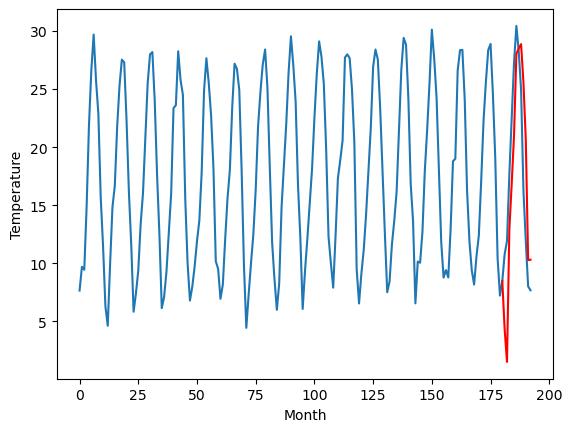

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.83		3.12		-0.71
2.51		0.32		-2.19
12.72		11.71		-1.01
15.07		15.64		0.57
19.14		19.86		0.72
25.06		26.86		1.80
26.05		27.30		1.25
26.57		27.68		1.11
22.44		24.39		1.95
18.86		19.44		0.58
9.20		9.07		-0.13
10.69		9.10		-1.59
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.55, 3.1197441005706787, 0.32242564201354984, 11.71467951774597, 15.637307205200194, 19.859618701934814, 26.861545124053954, 27.303069838285445, 27.67550654053688, 24.389228769540786, 19.436810442209243, 9.06600660920143, 9.100417678207158]


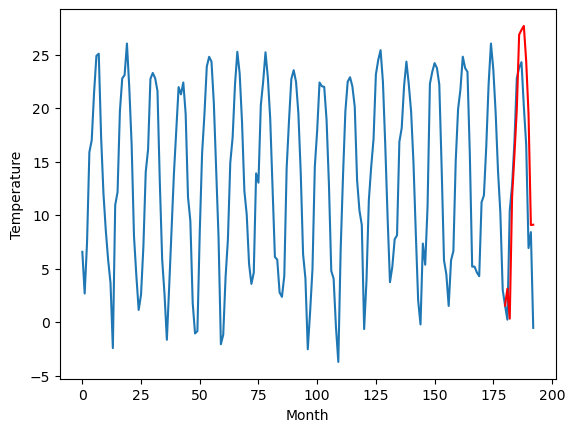

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.74		10.04		-0.70
6.87		7.24		0.37
19.95		18.64		-1.31
23.24		22.56		-0.68
27.81		26.78		-1.03
35.29		33.80		-1.49
35.29		34.24		-1.05
35.41		34.61		-0.80
32.05		31.33		-0.72
26.63		26.37		-0.26
16.89		15.99		-0.90
16.53		16.03		-0.50
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.08, 10.03909107208252, 7.236259422302247, 18.640586814880372, 22.557151279449464, 26.77749439239502, 33.796942195892335, 34.23944442629814, 34.61027239918709, 31.326006165742875, 26.36754821896553, 15.989373437166215, 16.028322941660882]


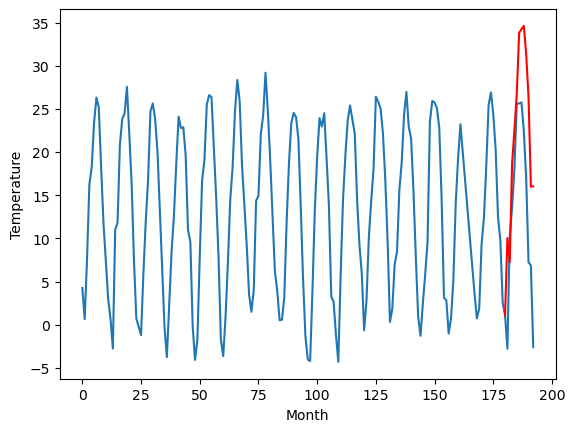

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.07		12.35		-0.72
10.35		9.55		-0.80
21.68		20.96		-0.72
25.13		24.87		-0.26
29.41		29.09		-0.32
36.12		36.11		-0.01
36.50		36.55		0.05
36.82		36.92		0.10
33.56		33.64		0.08
28.98		28.68		-0.30
18.13		18.30		0.17
19.18		18.33		-0.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.21, 12.349534530639648, 9.553057689666748, 20.95665647506714, 24.866697330474853, 29.090369243621826, 36.11140586853027, 36.549222458600994, 36.922992397546764, 33.63921492218971, 28.68498032212257, 18.30121796250343, 18.33481003761291]


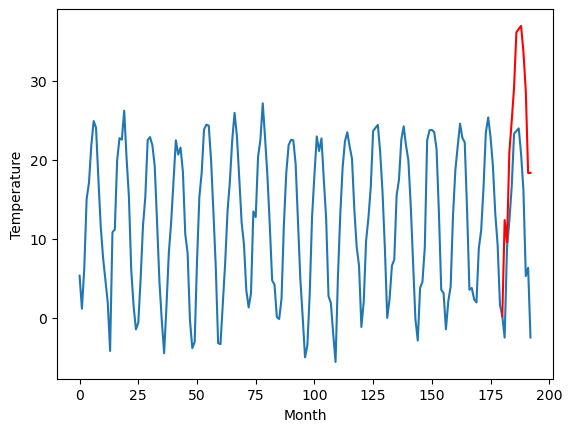

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.18		6.74		-2.44
9.28		3.95		-5.33
12.25		15.36		3.11
17.03		19.28		2.25
22.08		23.51		1.43
29.47		30.52		1.05
31.31		30.97		-0.34
29.39		31.36		1.97
27.52		28.08		0.56
19.55		23.12		3.57
16.81		12.76		-4.05
12.05		12.79		0.74
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-8.22, 6.74341646194458, 3.953895483016968, 15.363068494796753, 19.284794006347656, 23.505524311065674, 30.524896774291992, 30.97324139237404, 31.363046828508377, 28.080829087495804, 23.12176078915596, 12.75568241238594, 12.79057091459632]


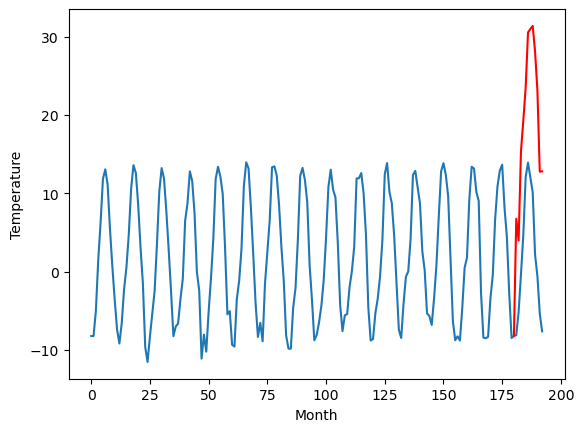

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.78		12.06		-2.72
17.63		9.26		-8.37
19.23		20.67		1.44
27.20		24.59		-2.61
31.63		28.80		-2.83
39.27		35.83		-3.44
40.35		36.28		-4.07
39.12		36.67		-2.45
35.15		33.39		-1.76
24.80		28.43		3.63
22.28		18.09		-4.19
15.01		18.12		3.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.04, 12.057332496643067, 9.263909797668457, 20.668937187194825, 24.592808465957642, 28.804454069137574, 35.82502673149109, 36.275773625373844, 36.66723684549332, 33.38906602144242, 28.431210796833042, 18.09037522554398, 18.123300216645006]


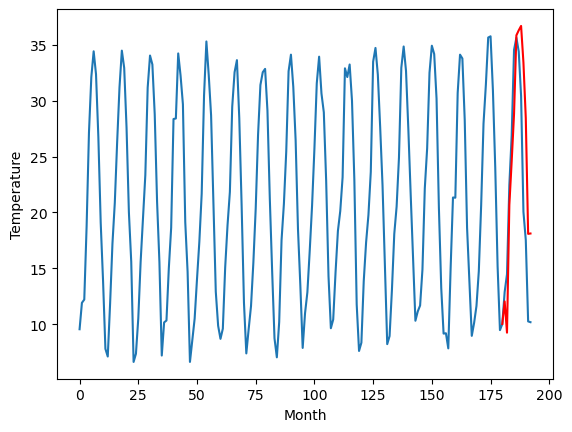

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.52		11.12		-3.40
15.45		8.31		-7.14
15.23		19.69		4.46
17.42		23.62		6.20
21.71		27.83		6.12
23.41		34.86		11.45
22.59		35.32		12.73
23.14		35.70		12.56
22.59		32.42		9.83
19.83		27.46		7.63
17.01		17.13		0.12
13.31		17.16		3.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.17, 11.121327686309815, 8.313429164886475, 19.69354467391968, 23.623979139328004, 27.827531385421754, 34.8606529712677, 35.315420287847516, 35.70034571290016, 32.4236118376255, 27.463090616464612, 17.13344832062721, 17.16034219525754]


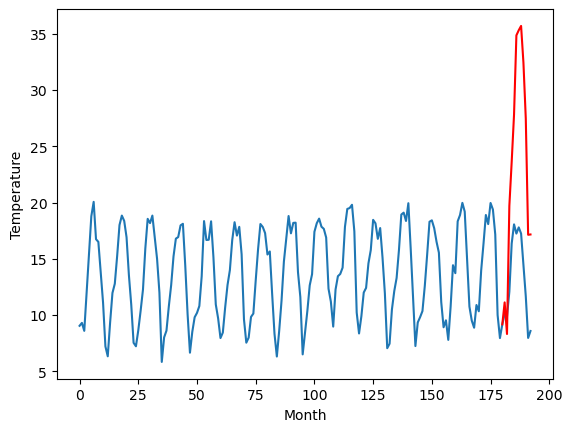

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.77		8.61		0.84
7.65		5.82		-1.83
12.65		17.20		4.55
17.27		21.12		3.85
22.10		25.34		3.24
27.97		32.37		4.40
30.11		32.82		2.71
30.73		33.20		2.47
27.41		29.91		2.50
22.97		24.94		1.97
14.05		14.59		0.54
12.45		14.61		2.16
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.94, 8.613879957199096, 5.8220301055908195, 17.20433811187744, 21.12386707305908, 25.343540229797362, 32.36759094238281, 32.815840282440185, 33.20184040904045, 29.90596867442131, 24.942473419904708, 14.586325653791427, 14.610508733391761]


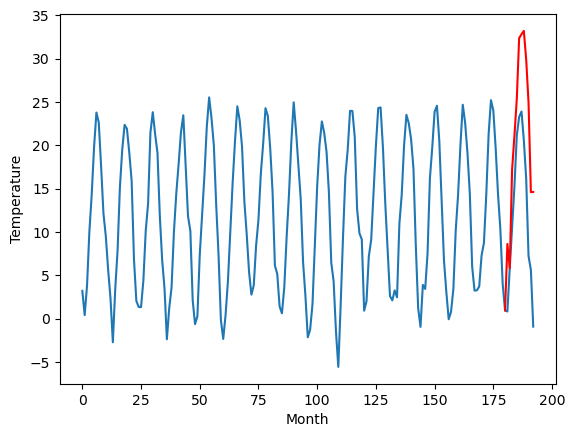

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.29		6.68		-0.61
6.49		3.89		-2.60
13.68		15.27		1.59
18.55		19.19		0.64
22.81		23.41		0.60
28.98		30.44		1.46
30.62		30.89		0.27
30.35		31.28		0.93
26.09		27.97		1.88
21.97		23.01		1.04
11.75		12.64		0.89
11.34		12.66		1.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.13, 6.678149557113647, 3.8884218692779537, 15.268786287307739, 19.18584523200989, 23.406462049484254, 30.43672881126404, 30.89021102190018, 31.275185531377794, 27.97292417883873, 23.007777637243272, 12.639540141820909, 12.663918534666301]


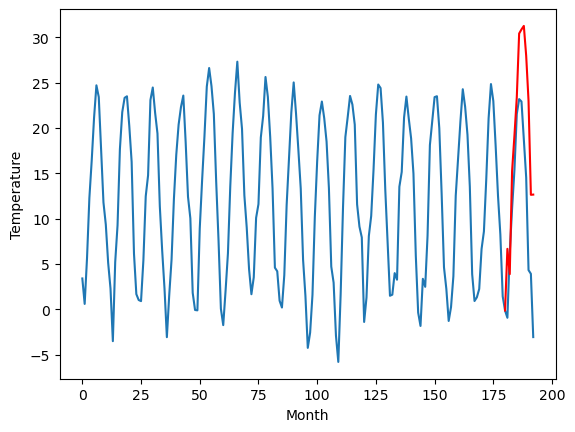

RangeIndex(start=1, stop=12, step=1)
[8.569999999999999, 6.720000000000001, 7.75, 3.8299999999999996, 10.74, 13.069999999999999, 9.18, 14.78, 14.520000000000001, 7.769999999999999, 7.29]
[6.68254075050354, 5.696825618743897, 4.313502540588379, 3.1197441005706787, 10.03909107208252, 12.349534530639648, 6.74341646194458, 12.057332496643067, 11.121327686309815, 8.613879957199096, 6.678149557113647]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.57   6.682541
1                 1    6.72   5.696826
2                 2    7.75   4.313503
3                 3    3.83   3.119744
4                 4   10.74  10.039091
5                 5   13.07  12.349535
6                 6    9.18   6.743416
7                 7   14.78  12.057332
8                 8   14.52  11.121328
9                 9    7.77   8.613880
10               10    7.29   6.678150


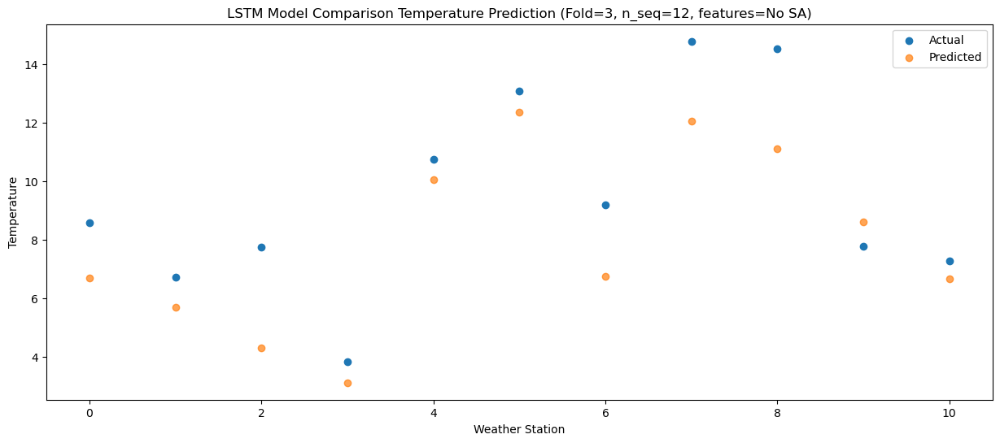

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.94   3.898352
1                 1    3.00   2.902751
2                 2   10.05   1.507618
3                 3    2.51   0.322426
4                 4    6.87   7.236259
5                 5   10.35   9.553058
6                 6    9.28   3.953895
7                 7   17.63   9.263910
8                 8   15.45   8.313429
9                 9    7.65   5.822030
10               10    6.49   3.888422


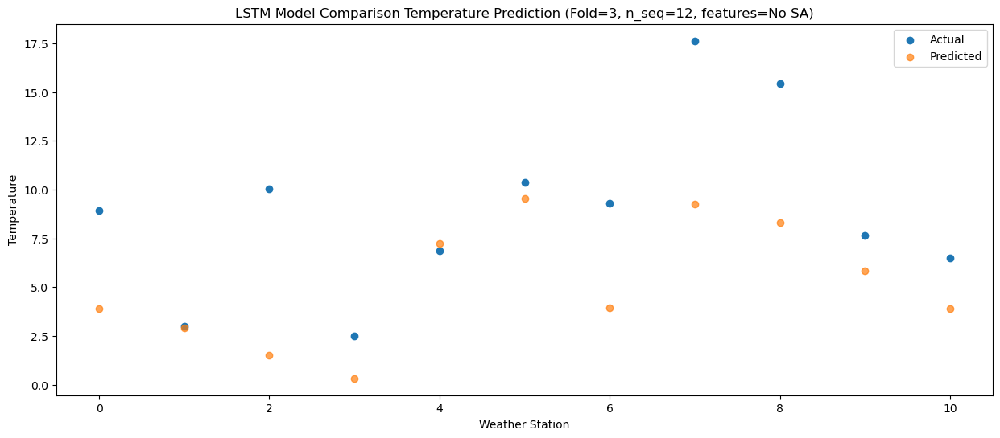

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.74  15.287050
1                 1   14.97  14.300406
2                 2   11.20  12.896456
3                 3   12.72  11.714680
4                 4   19.95  18.640587
5                 5   21.68  20.956656
6                 6   12.25  15.363068
7                 7   19.23  20.668937
8                 8   15.23  19.693545
9                 9   12.65  17.204338
10               10   13.68  15.268786


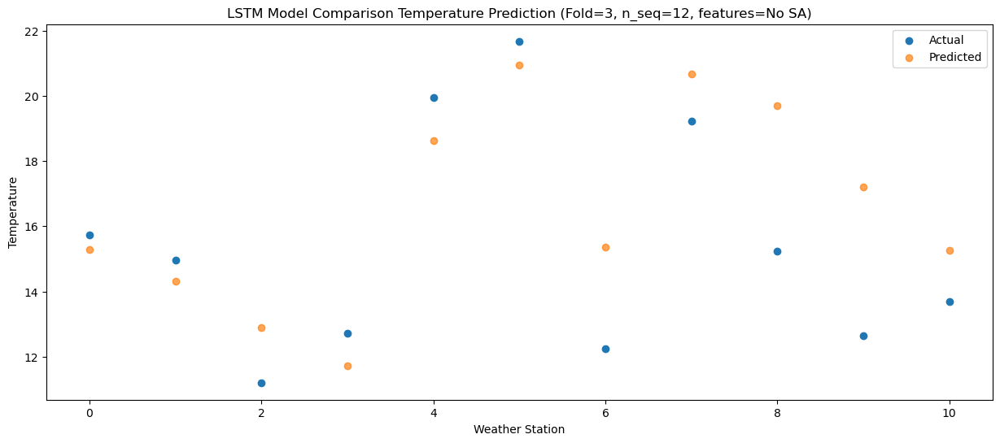

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.90  19.211646
1                 1   16.83  18.224494
2                 2   16.93  16.830564
3                 3   15.07  15.637307
4                 4   23.24  22.557151
5                 5   25.13  24.866697
6                 6   17.03  19.284794
7                 7   27.20  24.592808
8                 8   17.42  23.623979
9                 9   17.27  21.123867
10               10   18.55  19.185845


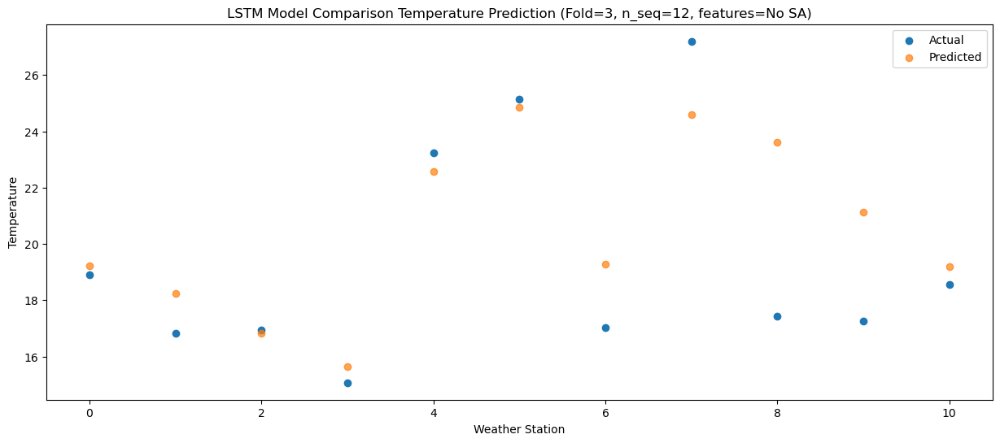

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.56  23.431784
1                 1   21.05  22.450166
2                 2   21.73  21.035547
3                 3   19.14  19.859619
4                 4   27.81  26.777494
5                 5   29.41  29.090369
6                 6   22.08  23.505524
7                 7   31.63  28.804454
8                 8   21.71  27.827531
9                 9   22.10  25.343540
10               10   22.81  23.406462


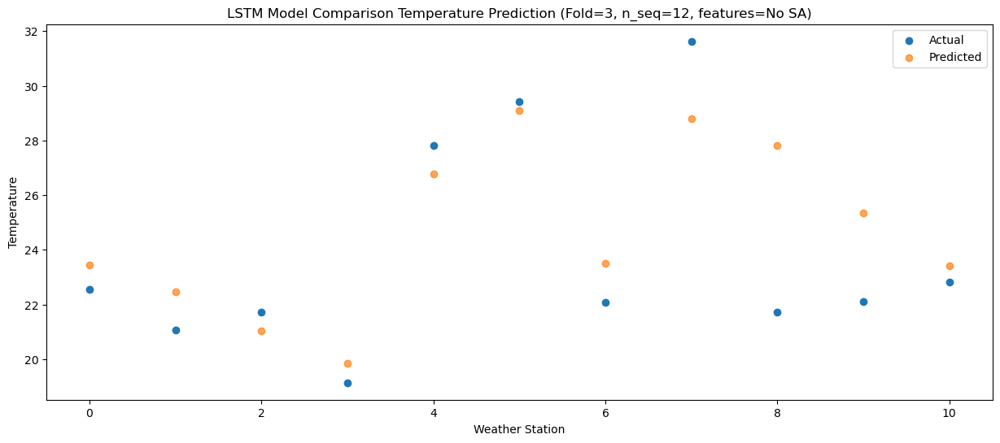

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   26.62  30.431313
1                 1   27.76  29.454542
2                 2   26.58  28.052274
3                 3   25.06  26.861545
4                 4   35.29  33.796942
5                 5   36.12  36.111406
6                 6   29.47  30.524897
7                 7   39.27  35.825027
8                 8   23.41  34.860653
9                 9   27.97  32.367591
10               10   28.98  30.436729


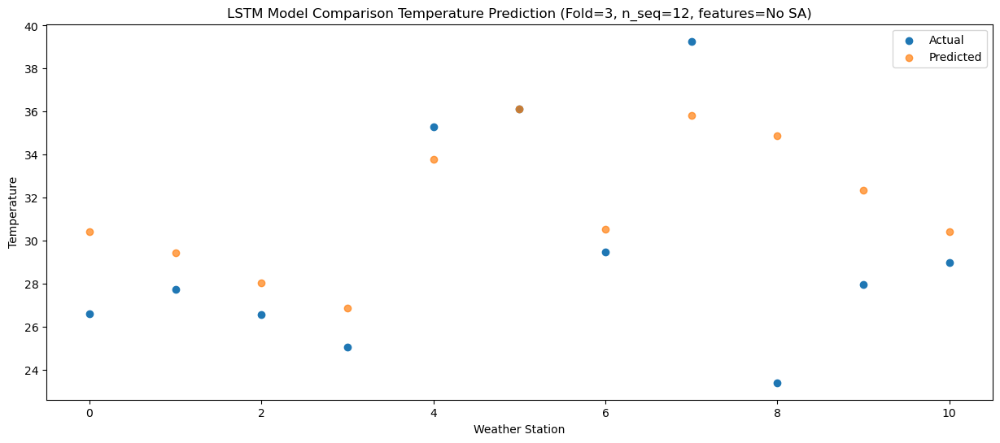

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   28.33  30.870809
1                 1   29.07  29.890471
2                 2   29.71  28.490378
3                 3   26.05  27.303070
4                 4   35.29  34.239444
5                 5   36.50  36.549222
6                 6   31.31  30.973241
7                 7   40.35  36.275774
8                 8   22.59  35.315420
9                 9   30.11  32.815840
10               10   30.62  30.890211


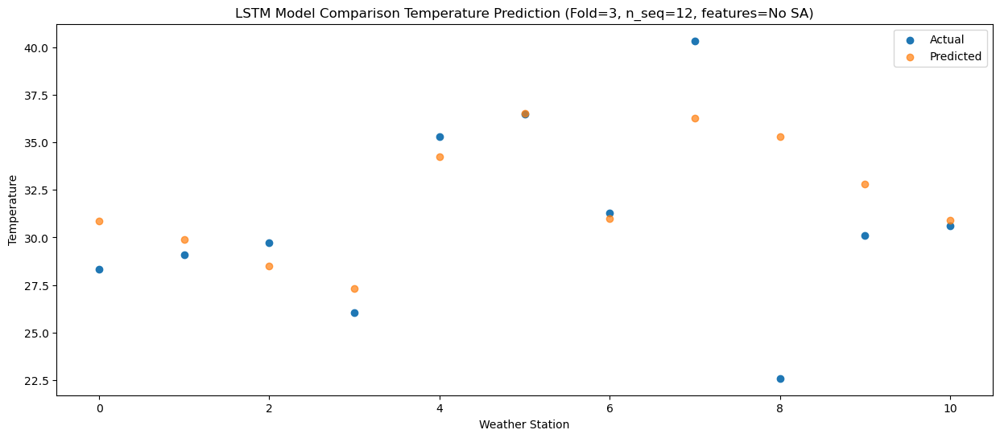

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   28.55  31.248690
1                 1   29.64  30.265395
2                 2   27.51  28.873851
3                 3   26.57  27.675507
4                 4   35.41  34.610272
5                 5   36.82  36.922992
6                 6   29.39  31.363047
7                 7   39.12  36.667237
8                 8   23.14  35.700346
9                 9   30.73  33.201840
10               10   30.35  31.275186


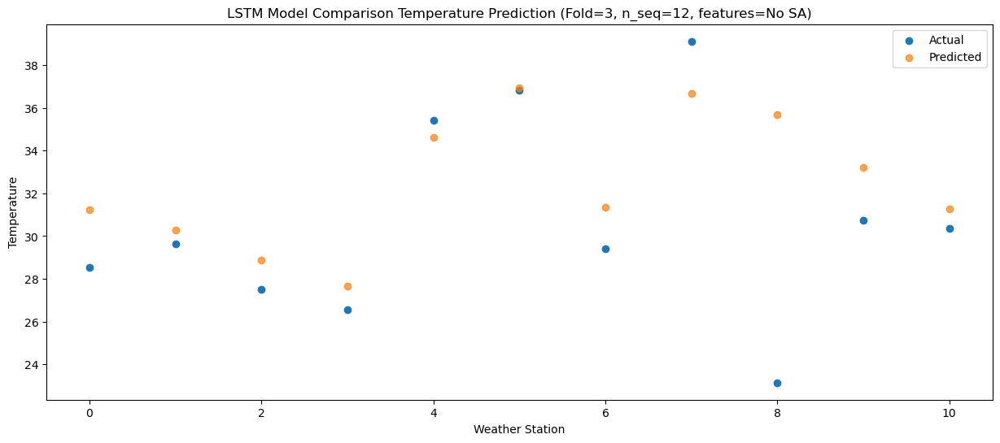

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   24.56  27.950922
1                 1   26.91  26.974347
2                 2   24.20  25.583555
3                 3   22.44  24.389229
4                 4   32.05  31.326006
5                 5   33.56  33.639215
6                 6   27.52  28.080829
7                 7   35.15  33.389066
8                 8   22.59  32.423612
9                 9   27.41  29.905969
10               10   26.09  27.972924


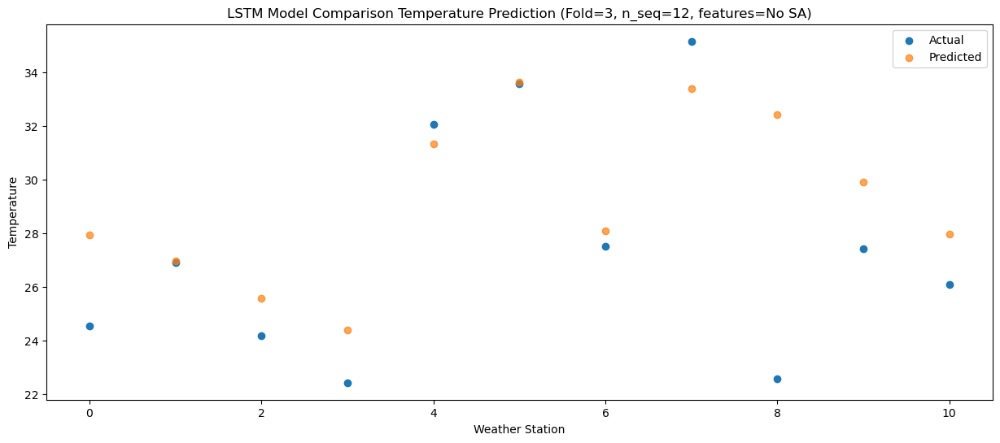

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.33  22.996593
1                 1   20.31  22.016188
2                 2   15.54  20.634059
3                 3   18.86  19.436810
4                 4   26.63  26.367548
5                 5   28.98  28.684980
6                 6   19.55  23.121761
7                 7   24.80  28.431211
8                 8   19.83  27.463091
9                 9   22.97  24.942473
10               10   21.97  23.007778


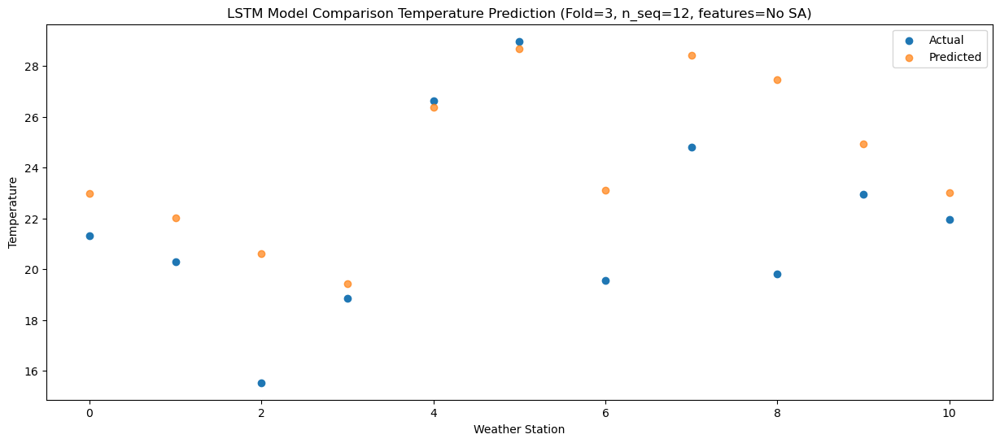

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   12.57  12.626354
1                 1   12.60  11.644461
2                 2   11.20  10.285580
3                 3    9.20   9.066007
4                 4   16.89  15.989373
5                 5   18.13  18.301218
6                 6   16.81  12.755682
7                 7   22.28  18.090375
8                 8   17.01  17.133448
9                 9   14.05  14.586326
10               10   11.75  12.639540


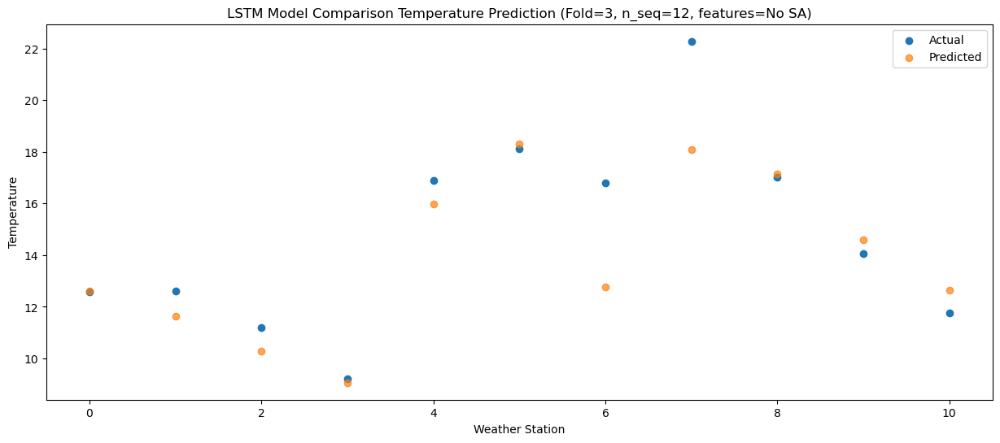

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   14.53  12.664369
1                 1   13.91  11.681347
2                 2    7.28  10.308438
3                 3   10.69   9.100418
4                 4   16.53  16.028323
5                 5   19.18  18.334810
6                 6   12.05  12.790571
7                 7   15.01  18.123300
8                 8   13.31  17.160342
9                 9   12.45  14.610509
10               10   11.34  12.663919


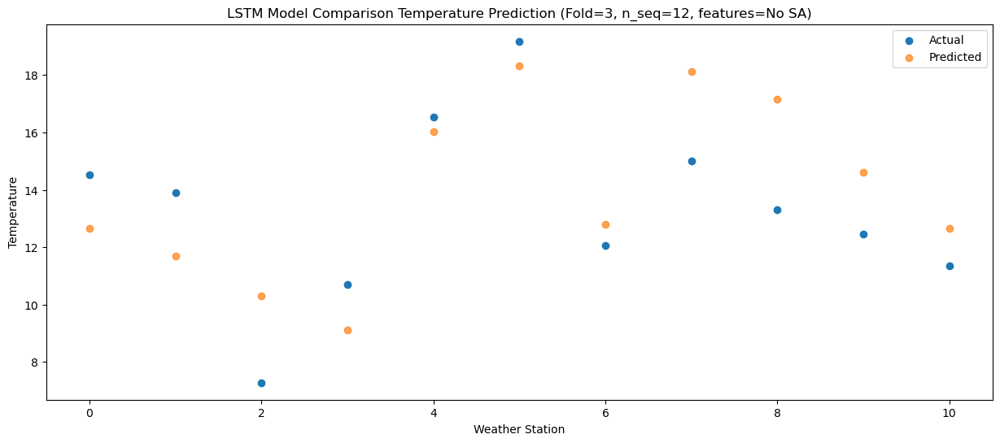

Model: "sequential_511"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1022 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1022 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1023 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1023 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1533 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1534 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1535 (Dense)          (1, 12)                

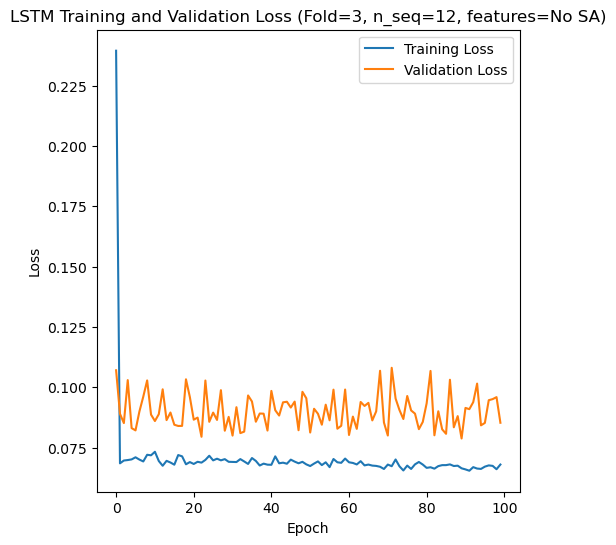

Epoch 1/100
84/84 [==============================] - 40s 214ms/step - loss: 0.1806 - accuracy: 0.5476 - mae: 0.1411 - rmse: 0.1806 - mape: 29.0326 - pearson: 0.6315 - val_loss: 0.0861 - val_accuracy: 0.7000 - val_mae: 0.0685 - val_rmse: 0.0861 - val_mape: 16.1545 - val_pearson: 0.7984
Epoch 2/100
84/84 [==============================] - 8s 94ms/step - loss: 0.0738 - accuracy: 0.6786 - mae: 0.0572 - rmse: 0.0738 - mape: 12.7245 - pearson: 0.7958 - val_loss: 0.0810 - val_accuracy: 0.7000 - val_mae: 0.0639 - val_rmse: 0.0810 - val_mape: 14.6623 - val_pearson: 0.8104
Epoch 3/100
84/84 [==============================] - 7s 79ms/step - loss: 0.0698 - accuracy: 0.7143 - mae: 0.0538 - rmse: 0.0698 - mape: 12.1613 - pearson: 0.8063 - val_loss: 0.0838 - val_accuracy: 0.7000 - val_mae: 0.0676 - val_rmse: 0.0838 - val_mape: 15.8209 - val_pearson: 0.7972
Epoch 4/100
84/84 [==============================] - 6s 73ms/step - loss: 0.0700 - accuracy: 0.6905 - mae: 0.0547 - rmse: 0.0700 - mape: 12.1842 -

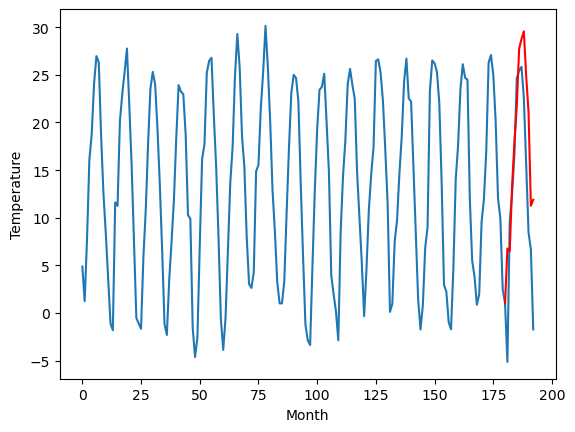

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.57		5.79		-2.78
12.00		5.53		-6.47
13.60		12.37		-1.23
15.04		17.02		1.98
19.08		20.70		1.62
20.71		26.73		6.02
21.08		27.74		6.66
21.36		28.56		7.20
20.07		23.89		3.82
18.23		20.10		1.87
11.07		10.29		-0.78
12.87		10.92		-1.95
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.25, 5.792091245651245, 5.534669364690781, 12.368658984899522, 17.01982208609581, 20.700557197332383, 26.728549922704698, 27.738347257375718, 28.56118168950081, 23.888645316362382, 20.10211506009102, 10.29351081967354, 10.924233640432359]


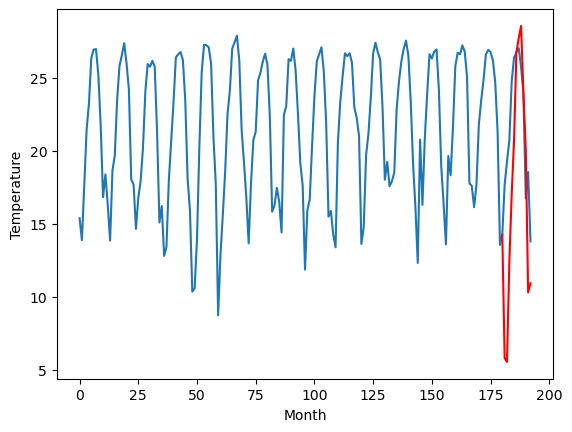

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.52		4.41		-2.11
4.60		4.16		-0.44
13.93		10.99		-2.94
15.00		15.63		0.63
19.47		19.31		-0.16
23.73		25.35		1.62
24.39		26.35		1.96
25.04		27.19		2.15
21.92		22.51		0.59
18.53		18.72		0.19
9.86		8.91		-0.95
13.37		9.54		-3.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.06, 4.409332504272461, 4.156685581207276, 10.9933597946167, 15.6343510055542, 19.313123931884768, 25.345788707733156, 26.354273309707644, 27.18773101806641, 22.508224239349367, 18.724478235244753, 8.90895890235901, 9.53999762773514]


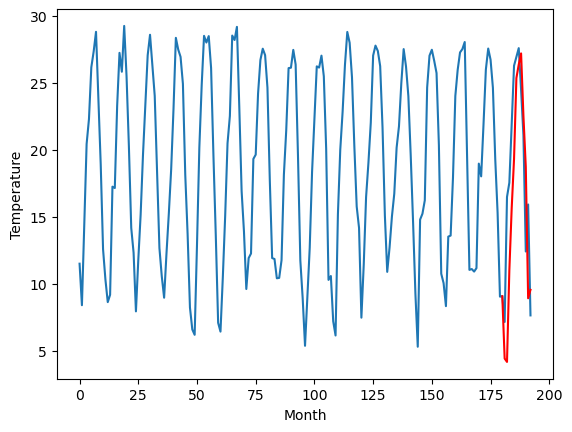

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.37		3.21		-1.16
0.91		2.95		2.04
11.87		9.79		-2.08
13.56		14.43		0.87
17.72		18.12		0.40
23.40		24.15		0.75
24.99		25.16		0.17
25.36		25.99		0.63
22.57		21.32		-1.25
17.92		17.53		-0.39
9.92		7.72		-2.20
11.92		8.35		-3.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.48, 3.20502046585083, 2.9487042808532715, 9.789999523162841, 14.432597675323485, 18.11648205757141, 24.14725712776184, 25.156355895996093, 25.993583002090453, 21.317840375900268, 17.53346661567688, 7.720686235427856, 8.346262254714965]


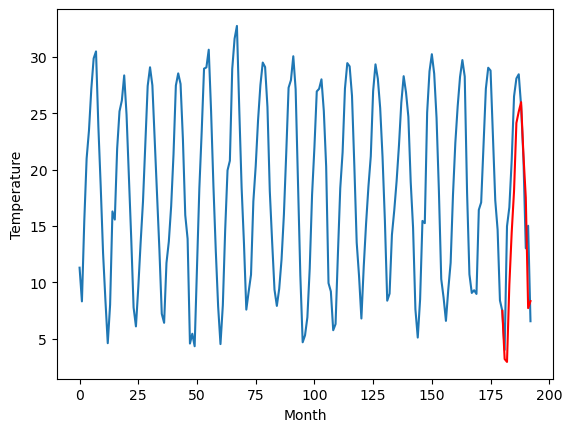

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.61		10.13		-1.48
7.72		9.87		2.15
18.64		16.71		-1.93
20.82		21.36		0.54
24.35		25.04		0.69
31.20		31.07		-0.13
32.69		32.08		-0.61
33.06		32.91		-0.15
29.63		28.24		-1.39
24.76		24.47		-0.29
16.92		14.66		-2.26
18.66		15.28		-3.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.33, 10.126250944137574, 9.871420106887818, 16.70730134010315, 21.355949125289918, 25.042894563674928, 31.06864281654358, 32.077125511169434, 32.91436632633209, 28.244764409065247, 24.46567877292633, 14.655837616920472, 15.278988382816316]


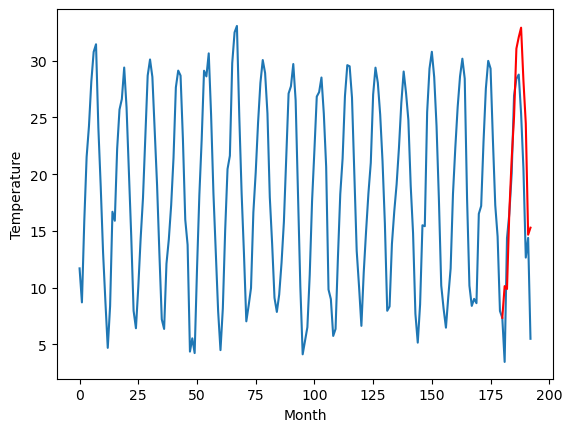

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.42		12.45		-0.97
11.85		12.19		0.34
21.10		19.02		-2.08
23.33		23.67		0.34
28.82		27.35		-1.47
33.78		33.39		-0.39
33.52		34.40		0.88
33.84		35.22		1.38
33.15		30.56		-2.59
27.45		26.78		-0.67
20.51		16.98		-3.53
20.92		17.60		-3.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 12.446837921142578, 12.190657128095626, 19.02062271952629, 23.67385004878044, 27.35177325129509, 33.3858055961132, 34.39521049380302, 35.21758972525596, 30.561385978460308, 26.78436051726341, 16.9844041955471, 17.60258274197578]


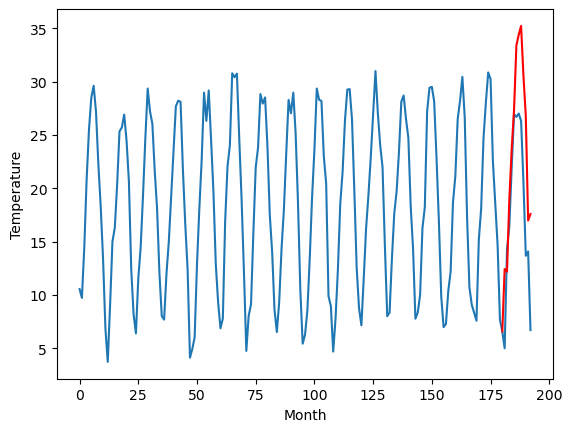

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.14		6.83		-2.31
9.81		6.60		-3.21
16.21		13.42		-2.79
18.94		18.08		-0.86
22.39		21.75		-0.64
26.41		27.77		1.36
28.15		28.78		0.63
28.28		29.62		1.34
24.31		24.96		0.65
20.51		21.19		0.68
12.35		11.38		-0.97
14.26		12.00		-2.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.04, 6.833412799835205, 6.595943394899368, 13.424197617769241, 18.07517999768257, 21.75113124012947, 27.77491921544075, 28.78483623623848, 29.621925953626633, 24.96362269282341, 21.191192749738693, 11.379082802534104, 12.00066966176033]


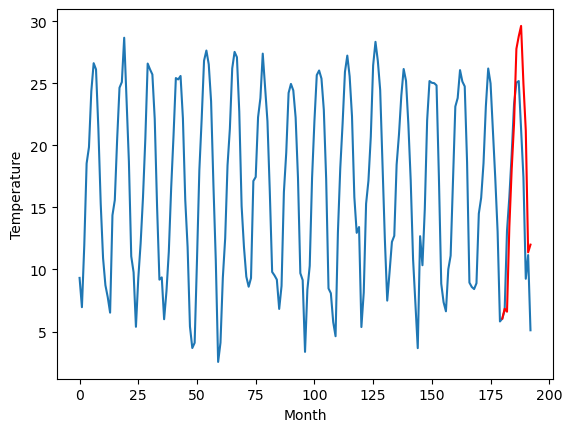

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.56		12.15		-0.41
8.95		11.90		2.95
21.22		18.74		-2.48
23.12		23.39		0.27
27.16		27.06		-0.10
33.46		33.09		-0.37
34.75		34.10		-0.65
35.27		34.92		-0.35
32.23		30.26		-1.97
26.46		26.48		0.02
18.52		16.66		-1.86
19.98		17.29		-2.69
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.13, 12.148514251708985, 11.902184586524964, 18.73641977787018, 23.386181931495667, 27.061827044487, 33.08728681087494, 34.096430759429936, 34.92212412834168, 30.255929689407353, 26.476008157730107, 16.658962945938114, 17.285653452873234]


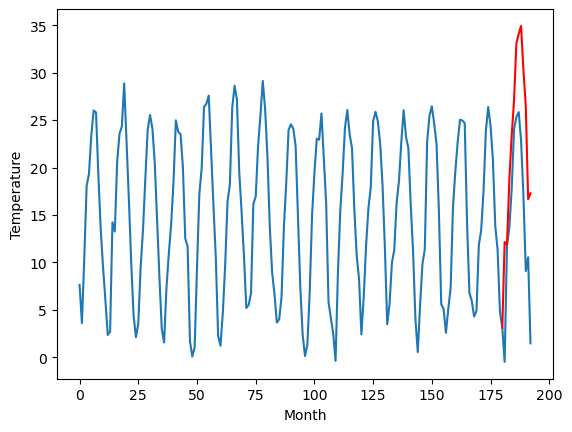

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.72		11.21		-0.51
8.36		10.97		2.61
20.33		17.81		-2.52
23.98		22.46		-1.52
28.39		26.13		-2.26
35.63		32.16		-3.47
36.20		33.16		-3.04
37.06		33.99		-3.07
33.57		29.32		-4.25
28.22		25.54		-2.68
17.36		15.71		-1.65
17.68		16.35		-1.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.29, 11.21455364227295, 10.968601706624032, 17.80712986290455, 22.46107340157032, 26.12814784348011, 32.163222077488896, 33.16372454464435, 33.98682976067066, 29.31739282906055, 25.535212758183476, 15.710675480961797, 16.345750394463536]


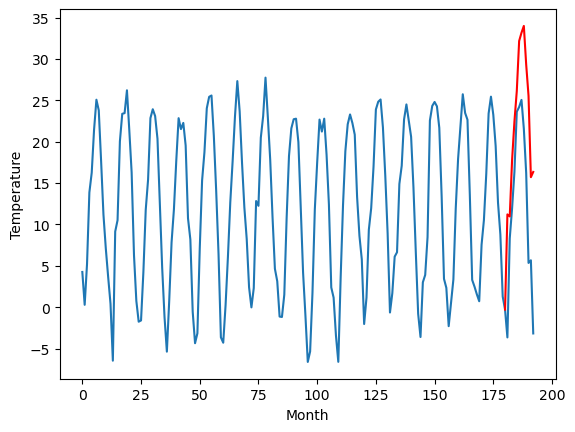

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.76		8.70		-0.06
4.32		8.45		4.13
18.18		15.30		-2.88
21.89		19.95		-1.94
26.67		23.62		-3.05
34.06		29.66		-4.40
33.77		30.66		-3.11
34.05		31.48		-2.57
30.94		26.81		-4.13
25.48		23.02		-2.46
15.17		13.19		-1.98
14.92		13.84		-1.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-1.03, 8.702742376327514, 8.452114560604095, 15.297502496242522, 19.954640367031097, 23.624395110607146, 29.66235802412033, 30.66220901250839, 31.482323863506316, 26.81266901731491, 23.02080152273178, 13.188324906826018, 13.835157253742217]


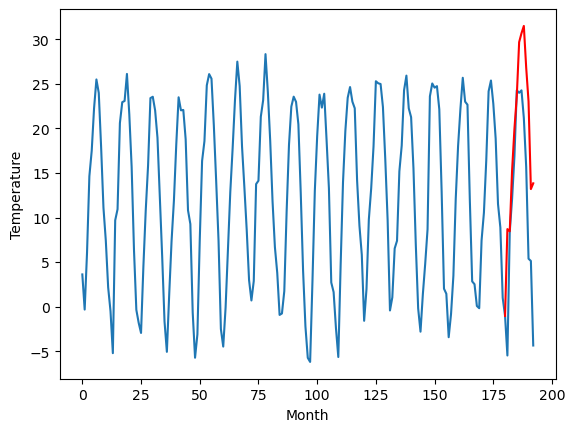

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.93		6.75		-0.18
4.69		6.51		1.82
14.58		13.35		-1.23
18.38		18.01		-0.37
22.91		21.68		-1.23
29.80		27.71		-2.09
29.96		28.71		-1.25
31.16		29.54		-1.62
26.87		24.88		-1.99
23.34		21.09		-2.25
12.94		11.26		-1.68
12.08		11.90		-0.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-2.29, 6.749081707000732, 6.5056933671236035, 13.34986107647419, 18.00840418636799, 21.676033905148508, 27.710580757260324, 28.705373218655588, 29.537596753239633, 24.877100518345834, 21.089916756749155, 11.260517647862436, 11.9035257011652]


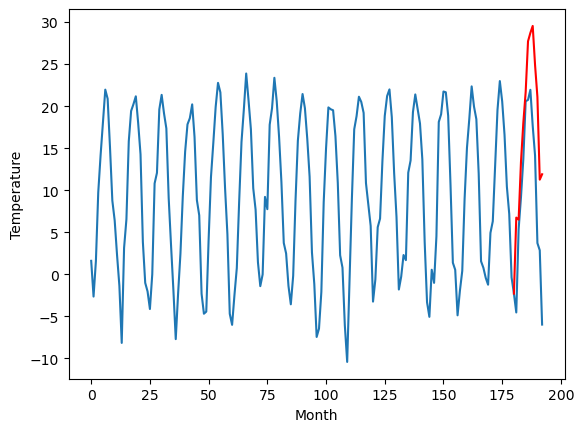

RangeIndex(start=1, stop=12, step=1)
[7.340000000000001, 8.569999999999999, 6.520000000000002, 4.370000000000001, 11.610000000000001, 13.419999999999998, 9.139999999999999, 12.56, 11.72, 8.759999999999998, 6.93]
[6.773520803451538, 5.792091245651245, 4.409332504272461, 3.20502046585083, 10.126250944137574, 12.446837921142578, 6.833412799835205, 12.148514251708985, 11.21455364227295, 8.702742376327514, 6.749081707000732]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.34   6.773521
1                 1    8.57   5.792091
2                 2    6.52   4.409333
3                 3    4.37   3.205020
4                 4   11.61  10.126251
5                 5   13.42  12.446838
6                 6    9.14   6.833413
7                 7   12.56  12.148514
8                 8   11.72  11.214554
9                 9    8.76   8.702742
10               10    6.93   6.749082


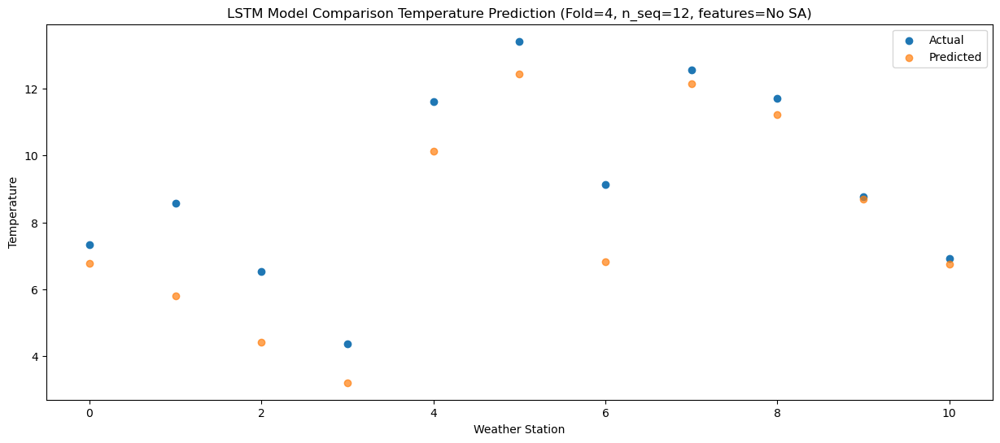

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.21   6.511966
1                 1   12.00   5.534669
2                 2    4.60   4.156686
3                 3    0.91   2.948704
4                 4    7.72   9.871420
5                 5   11.85  12.190657
6                 6    9.81   6.595943
7                 7    8.95  11.902185
8                 8    8.36  10.968602
9                 9    4.32   8.452115
10               10    4.69   6.505693


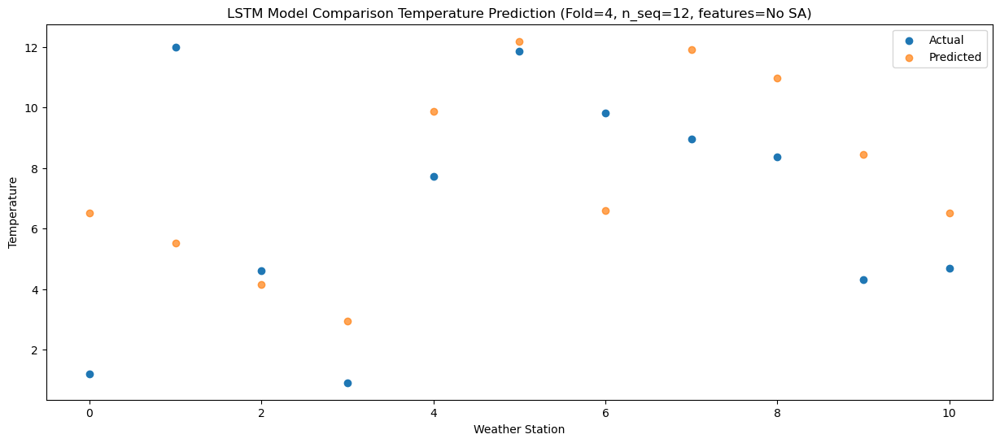

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.94  13.362646
1                 1   13.60  12.368659
2                 2   13.93  10.993360
3                 3   11.87   9.790000
4                 4   18.64  16.707301
5                 5   21.10  19.020623
6                 6   16.21  13.424198
7                 7   21.22  18.736420
8                 8   20.33  17.807130
9                 9   18.18  15.297502
10               10   14.58  13.349861


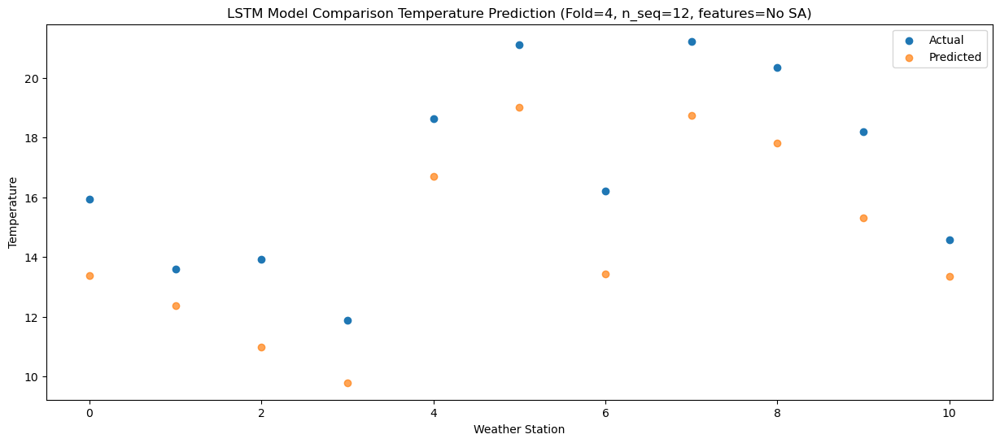

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.85  18.011296
1                 1   15.04  17.019822
2                 2   15.00  15.634351
3                 3   13.56  14.432598
4                 4   20.82  21.355949
5                 5   23.33  23.673850
6                 6   18.94  18.075180
7                 7   23.12  23.386182
8                 8   23.98  22.461073
9                 9   21.89  19.954640
10               10   18.38  18.008404


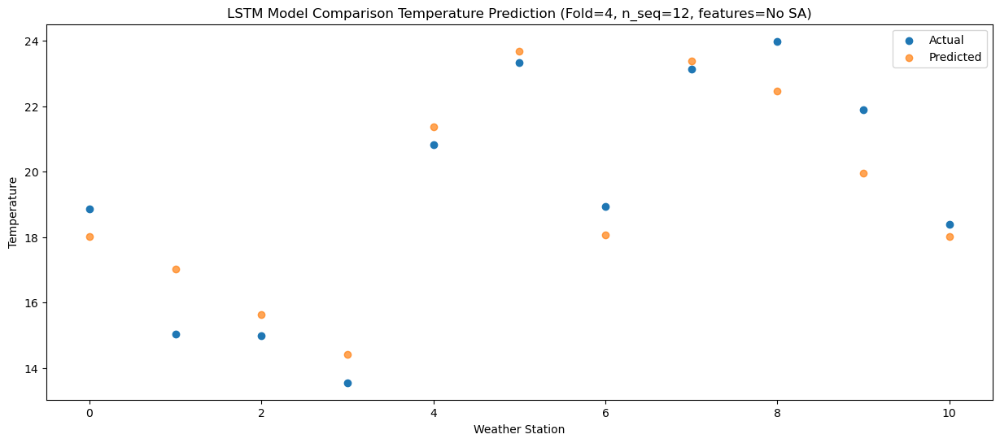

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   23.06  21.699567
1                 1   19.08  20.700557
2                 2   19.47  19.313124
3                 3   17.72  18.116482
4                 4   24.35  25.042895
5                 5   28.82  27.351773
6                 6   22.39  21.751131
7                 7   27.16  27.061827
8                 8   28.39  26.128148
9                 9   26.67  23.624395
10               10   22.91  21.676034


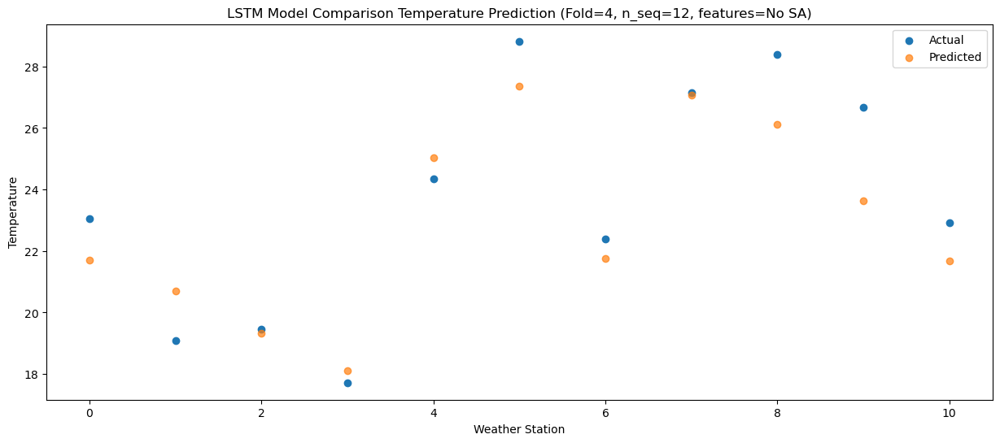

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   30.97  27.741745
1                 1   20.71  26.728550
2                 2   23.73  25.345789
3                 3   23.40  24.147257
4                 4   31.20  31.068643
5                 5   33.78  33.385806
6                 6   26.41  27.774919
7                 7   33.46  33.087287
8                 8   35.63  32.163222
9                 9   34.06  29.662358
10               10   29.80  27.710581


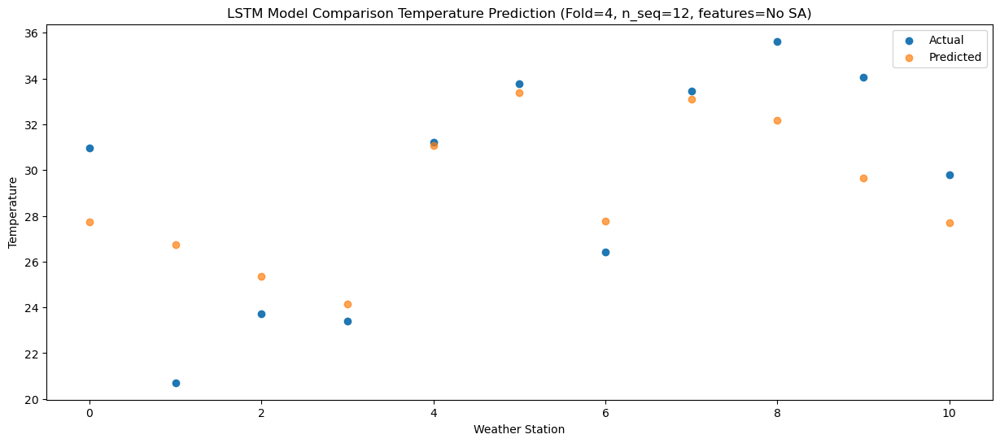

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   31.77  28.752618
1                 1   21.08  27.738347
2                 2   24.39  26.354273
3                 3   24.99  25.156356
4                 4   32.69  32.077126
5                 5   33.52  34.395210
6                 6   28.15  28.784836
7                 7   34.75  34.096431
8                 8   36.20  33.163725
9                 9   33.77  30.662209
10               10   29.96  28.705373


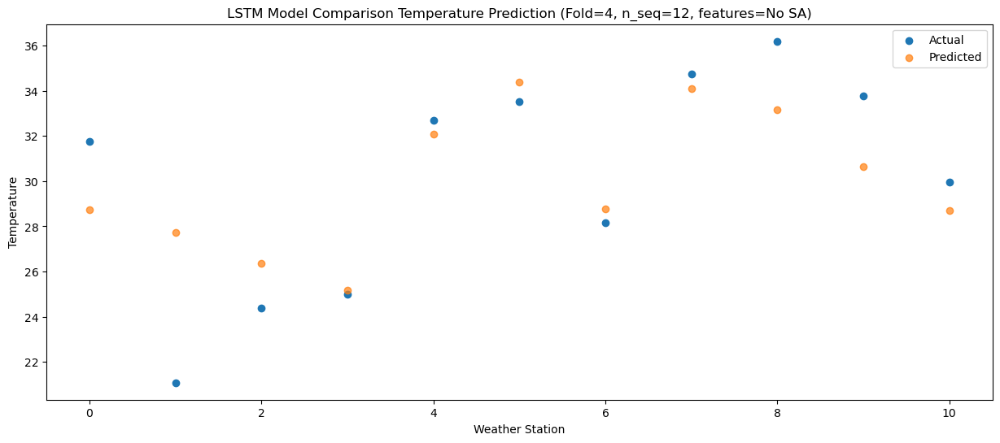

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   32.17  29.565047
1                 1   21.36  28.561182
2                 2   25.04  27.187731
3                 3   25.36  25.993583
4                 4   33.06  32.914366
5                 5   33.84  35.217590
6                 6   28.28  29.621926
7                 7   35.27  34.922124
8                 8   37.06  33.986830
9                 9   34.05  31.482324
10               10   31.16  29.537597


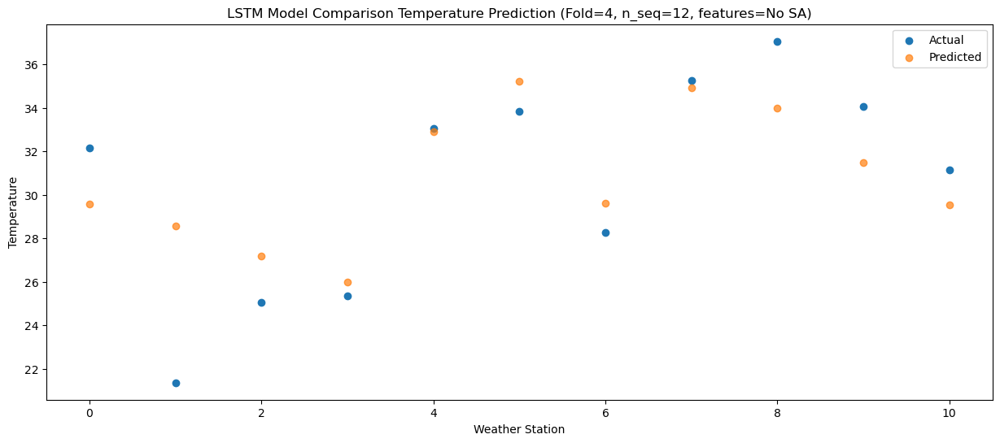

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   28.98  24.884508
1                 1   20.07  23.888645
2                 2   21.92  22.508224
3                 3   22.57  21.317840
4                 4   29.63  28.244764
5                 5   33.15  30.561386
6                 6   24.31  24.963623
7                 7   32.23  30.255930
8                 8   33.57  29.317393
9                 9   30.94  26.812669
10               10   26.87  24.877101


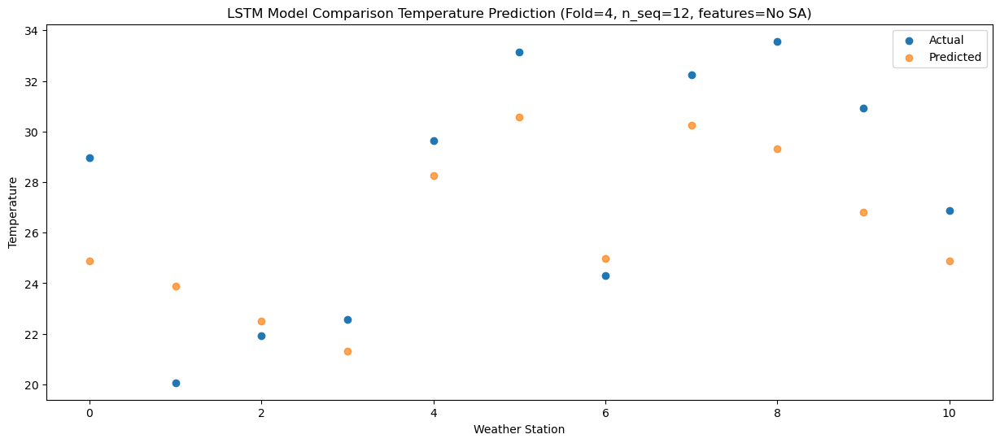

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.85  21.088150
1                 1   18.23  20.102115
2                 2   18.53  18.724478
3                 3   17.92  17.533467
4                 4   24.76  24.465679
5                 5   27.45  26.784361
6                 6   20.51  21.191193
7                 7   26.46  26.476008
8                 8   28.22  25.535213
9                 9   25.48  23.020802
10               10   23.34  21.089917


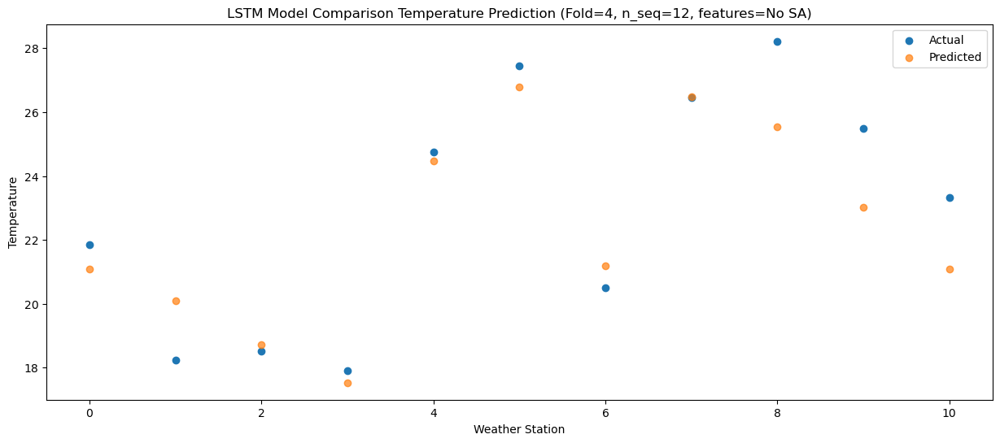

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   14.79  11.259119
1                 1   11.07  10.293511
2                 2    9.86   8.908959
3                 3    9.92   7.720686
4                 4   16.92  14.655838
5                 5   20.51  16.984404
6                 6   12.35  11.379083
7                 7   18.52  16.658963
8                 8   17.36  15.710675
9                 9   15.17  13.188325
10               10   12.94  11.260518


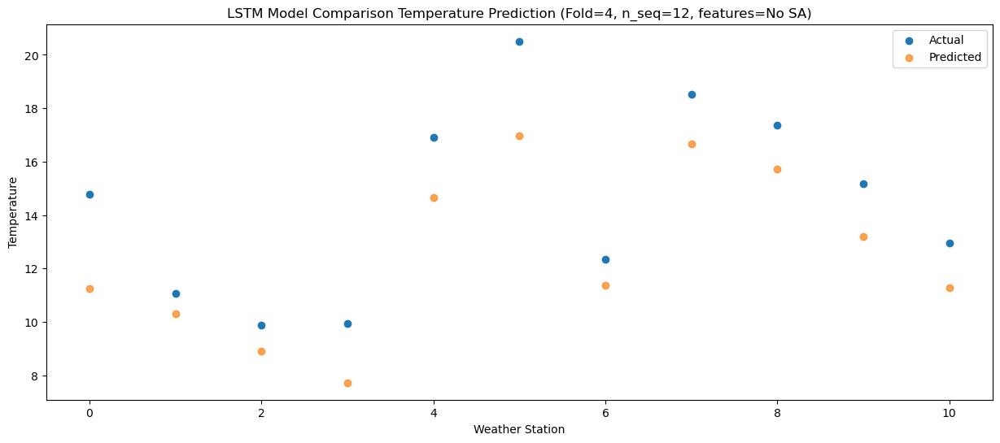

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   13.00  11.891260
1                 1   12.87  10.924234
2                 2   13.37   9.539998
3                 3   11.92   8.346262
4                 4   18.66  15.278988
5                 5   20.92  17.602583
6                 6   14.26  12.000670
7                 7   19.98  17.285653
8                 8   17.68  16.345750
9                 9   14.92  13.835157
10               10   12.08  11.903526


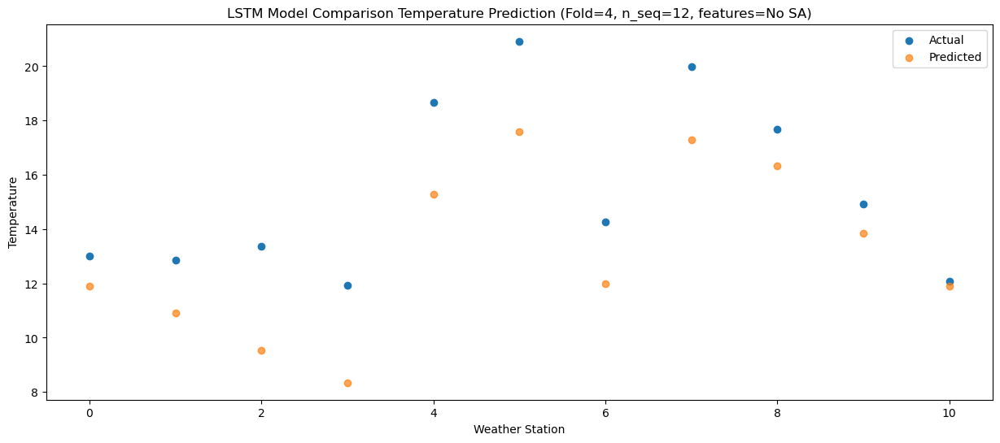

Model: "sequential_512"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1024 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1024 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1025 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1025 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1536 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1537 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1538 (Dense)          (1, 12)                

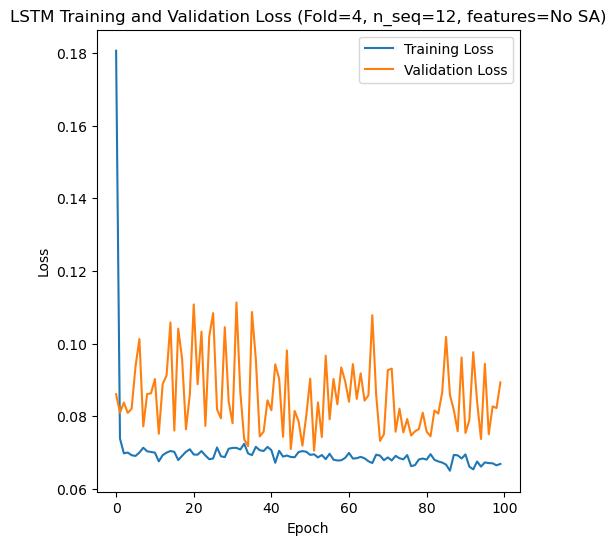

[[0.9010863987345313, 3.1807962558384615, 1.0461235712931216, 1.1011602488618988, 1.4082674264690251, 2.70223274648509, 2.2989085549299153, 2.4586323356117443, 2.349787259603014, 1.5786024149715951, 1.091200360123539, 1.191047377171841], [1.0838746010990887, 2.4769188787734135, 1.0834570845972773, 0.6588312641595906, 1.0325362142637877, 2.350194216960068, 2.463362630319372, 2.416906865081132, 2.9878009771356626, 1.7245533662328925, 1.6269950541350895, 1.1130981909961706], [1.079780193138564, 2.990272097191144, 2.862893002333228, 2.909723920396749, 3.5824288885575153, 4.605424596250232, 4.299362966322294, 4.082461676260017, 3.4397060242690163, 2.4559797817705267, 1.373231335208013, 2.7616143405468527], [1.9982045530968227, 4.892981031981964, 2.368949591261642, 2.4961163170957152, 2.3970656266948844, 4.162593141887958, 4.235523697267481, 4.112549124476632, 3.406374455244888, 3.3207549151699607, 1.8511766489115, 2.1867053606604143], [1.4390488313900633, 3.3741033488966745, 2.3215222152123

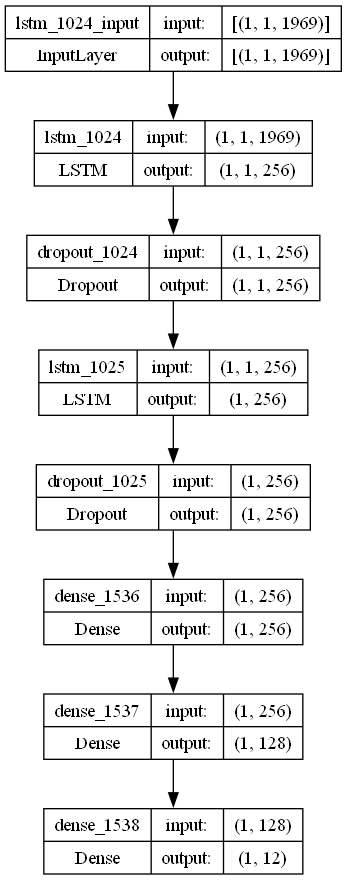

In [35]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr = 0.012583806596462462 
    optimizer = SGD(learning_rate = lr)
    activation_function = 'sigmoid'
    lstm_units = 256
    dropout_rate = 0.18933335146113747

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with an LSTM,
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S12_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)